<center><font = 'Arial' size = 24>Credit Card Users Churn Prediction</font></center>

**Author:** Vinayak Hampiholi

# <a href = #link0> Index </a>
- <a href = #link00> Description </a>
  - <a href = #link01> Context </a>
  - <a href = #link02> Objective </a>
  - <a href = #link03> Data Description </a>
  - <a href = #link04c> Import Libraries </a>
- <a href = #link100> Exploratory Data Analysis </a>
  - <a href = #link110> Problem Definition </a>
  - <a href = #link120> Univariate and Bivariate Analysis with Observations I </a>
  - <a href = #link130> Univariate and Bivariate Analysis with Observations II </a>
- <a href = #link200> Data Preprocessing </a>
  - <a href = link210> Missing Value Treatment </a>
  - <a href = link220> Outlier Detection and Treatment </a>
  - <a href = link230> Feature Engineering </a>
  - <a href = link240> Train-Validation-Test Split </a>
  - <a href = link250> Data Leakage Check </a>
- <a href = #link300> Model Building - Original Data </a>
  - <a href = #link310> Choose the metric to optimize for the problem </a>
  - <a href = #link320> Build 5 models (from decision trees, bagging and boosting methods) </a>
  - <a href = #link330> Check and comment on model performance across different metrics </a>
- <a href = #link400> Model Building - Oversampled data </a>
  - <a href = #link410> Build 5 models (from decision trees, bagging and boosting methods) </a>
  - <a href = #link420> Check and comment on model performance across different metrics </a>
- <a href = #link500> Model Building - Undersampled data </a>
  - <a href = #link510> Build 5 models (from decision trees, bagging and boosting methods) </a>
  - <a href = #link520> Check and comment on model performance across different metrics </a>
- <a href = #link600> Model Performance Improvement using Hyperparameter Tuning </a>
  - <a href = #link610> Choose 3 models (at least) that might perform better after tuning with proper reasoning </a>
  - <a href = #link620> Tune the 3 models (at least) chosen </a>
  - <a href = #link630> Check and comment on model performance across different metrics </a>
- <a href = #link70> Model Performance Comparison and Final Model Selection </a>
  - <a href = #link71> Compare the performances of the tuned models </a>
  - <a href = #link72> Choose the final model with a proper rationale </a>
  - <a href = #link73> Comment on the performance of the best model on the test set </a>
- <a href = #link80> Actionable Insights & Recommendations </a>
  - <a href = #link81> Write down insights from the analysis conducted </a>
  - <a href = #link82> Provide actionable business recommendations </a>

# <a name = 'link00'> Description </a>

## <a name = 'link01'> Context </a>

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

## <a name = 'link02'> Objective </a>

Customers’ leaving credit card services would lead the bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and the reason for same – so that the bank could improve upon those areas.

You as a Data Scientist at Thera Bank need to explore the data provided, identify patterns, and come up with a classification model to identify customers likely to churn, and provide actionable insights and recommendations that will help the bank improve its services so that customers do not renounce their credit cards.

## <a name = 'link03'> Data Description </a>

- **CLIENTNUM:** Client number. Unique identifier for the customer holding the account.
- **Attrition_Flag:** Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer".
- **Customer_Age:** Age in Years.
- **Gender:** The gender of the account holder.
- **Dependent_count:** Number of dependents.
- **Education_Level:** Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to a college student), Post-Graduate, Doctorate.
- **Marital_Status:** Marital Status of the account holder.
- **Income_Category:** Annual Income Category of the account holder.
- **Card_Category:** Type of Card.
- **Months_on_book:** Period of relationship with the bank.
- **Total_Relationship_Count:** Total no. of products held by the customer.
- **Months_Inactive_12_mon:** No. of months inactive in the last 12 months.
- **Contacts_Count_12_mon:** No. of Contacts between the customer and bank in the last 12 months.
- **Credit_Limit:** Credit Limit on the Credit Card.
- **Total_Revolving_Bal:** The balance that carries over from one month to the next is the revolving balance.
- **Avg_Open_To_Buy:** Open to Buy refers to the amount left on the credit card to use (Average of last 12 months).
- **Total_Trans_Amt:** Total Transaction Amount (Last 12 months).
- **Total_Trans_Ct:** Total Transaction Count (Last 12 months).
- **Total_Ct_Chng_Q4_Q1:** Ratio of the total transaction count in 4th quarter and the total transaction count in the 1st quarter.
- **Total_Amt_Chng_Q4_Q1:** Ratio of the total transaction amount in 4th quarter and the total transaction amount in the 1st quarter.
- **Avg_Utilization_Ratio:** Represents how much of the available credit the customer spent.

## <a name = 'link04'> Import Libraries </a>

In [1]:
# Make warnings not displayed
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Import display and MarkDown from IPython to display the messages in text cell via python code block
from IPython.display import display, Markdown, Image

In [3]:
# Import numpy for numerical python operation
import numpy as np

In [4]:
# Import pandas for data loading and dataframe activities
import pandas as pd

In [5]:
# Import seaborn and pyplot from matplotlib to visualize the data
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline

In [6]:
from sklearn.preprocessing import StandardScaler

In [7]:
# Import train_test_split from sklearn.model_selection for splitting the data into train and test split along with KFold, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold, cross_validate, cross_val_score, GridSearchCV, RandomizedSearchCV

In [8]:
# Library to import Pipeline
from imblearn.pipeline import Pipeline

In [9]:
# Library to import different metrics to measure the metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, make_scorer, confusion_matrix, roc_curve, auc

In [10]:
# Library to import DecisionTreeClassifier to build the DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier

In [11]:
# Import Library to calculate BaggingClassifier, AdaBoostClassifier, GradientClassifier
from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier

In [1]:
# Library for XGBoost ensemble technique
from xgboost import XGBClassifier

ModuleNotFoundError: No module named 'xgboost'

In [13]:
# Import SMOTE from imblearn.over_sampling
from imblearn.over_sampling import SMOTE

In [14]:
# Import RandomUnderSampler from imblearn.under_sampling
from imblearn.under_sampling import RandomUnderSampler

In [15]:
# Import sp_randint from scipy.stats
from scipy.stats import randint

In [16]:
# Define UnivariateAnalyzerContinuous to perofrm the univariate analysis on a continuous column
def UnivariateAnalyzerContinuous(ColumnName, Category):
  fig, axes = plt.subplots(1, 4, figsize = (20, 5))
  sns.histplot(data = BankChurnABT, x = ColumnName, kde = True, ax = axes[0])
  axes[0].set_title(ColumnName)
  plt.setp(axes[0].xaxis.get_majorticklabels(), rotation=45)
  sns.histplot(data = BankChurnABT, x = ColumnName, kde = True, hue = Category, ax = axes[1])
  axes[1].set_title(ColumnName)
  plt.setp(axes[1].xaxis.get_majorticklabels(), rotation=45)
  sns.boxplot(data = BankChurnABT, x = ColumnName, ax = axes[2])
  axes[2].set_title(ColumnName)
  plt.setp(axes[2].xaxis.get_majorticklabels(), rotation=45)
  sns.boxplot(data = BankChurnABT, x = ColumnName, hue = Category, ax = axes[3])
  axes[3].set_title(ColumnName)
  plt.setp(axes[3].xaxis.get_majorticklabels(), rotation=45)
  plt.show()

In [17]:
# Define UnivariateAnalyzerCategorical to perofrm the univariate analysis on a categorical column
def UnivariateAnalyzerCategorical(ColumnName, Category):
  fig, axes = plt.subplots(1, 2, figsize = (10, 5))
  sns.countplot(data = BankChurnABT, x = ColumnName, ax = axes[0])
  plt.setp(axes[0].xaxis.get_majorticklabels(), rotation=45)
  axes[0].set_title(ColumnName)
  sns.countplot(data = BankChurnABT, x = ColumnName, hue = Category, ax = axes[1])
  plt.setp(axes[1].xaxis.get_majorticklabels(), rotation=45)
  axes[1].set_title(ColumnName)
  plt.show()

In [18]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def ModelPerformanceMetrics(model, predictors, target):
  # predicting using the independent variables
  pred = model.predict(predictors)

  accuracy = accuracy_score(target, pred)  # to compute Accuracy
  recall = recall_score(target, pred)  # to compute Recall
  precision = precision_score(target, pred)  # to compute Precision
  f1 = f1_score(target, pred)  # to compute F1-score

  # creating a dataframe of metrics
  df_perf = pd.DataFrame({"Accuracy": accuracy, "Recall": recall, "Precision": precision, "F1": f1,}, index=[0],)

  return df_perf

In [19]:
def ConfusionMatrix(model, predictors, target):
  y_pred = model.predict(predictors)
  cm = confusion_matrix(target, y_pred)
  labels = np.asarray([["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())] for item in cm.flatten()]).reshape(2, 2)
  # plot the matrix inside a heatmap
  plt.figure(figsize=(6, 4))
  sns.heatmap(cm, annot=labels, fmt="")
  plt.ylabel("True label")
  plt.xlabel("Predicted label")
  plt.show()

# <a name = 'link100'> Exploratory Data Analysis <a>

## <a name = 'link110'> Problem Definition </a>

### <a name = 'link111'> Problem Statement </a>

Customers’ leaving credit card services would lead the bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and the reason for same – so that the bank could improve upon those areas.

You as a Data Scientist at Thera Bank need to explore the data provided, identify patterns, and come up with a classification model to identify customers likely to churn, and provide actionable insights and recommendations that will help the bank improve its services so that customers do not renounce their credit cards.

### <a name = 'link112'> Loading the file into DataFrame </a>

In [20]:
# Read the file BankChurners.csv from google drive and load into a dataframe
FileURL = "/content/drive/MyDrive/Colab Notebooks/BankChurners.csv"
BankChurnersRaw = pd.read_csv(FileURL)
if BankChurnersRaw.empty:
  display(Markdown("**Observations:**\n- Errors occurred while loading the data and the data loading is unsuccessful."))
else:
  display(Markdown("**Observations:**\n- No errors occurred while loading the data and the data loading is successful."))

**Observations:**
- No errors occurred while loading the data and the data loading is successful.

### <a name = 'link113'> Display Rows and Columns </a>

In [21]:
# Get the rows and columns in the dataframe
display(Markdown("**Observations:**\n- There are {} rows and {} columns in the dataframe.".format(BankChurnersRaw.shape[0], BankChurnersRaw.shape[1])))

**Observations:**
- There are 10127 rows and 21 columns in the dataframe.

### <a name = 'link114'> Prepare Analysis Base Table </a>

In [22]:
#Prepare the ABT (Analysis Base Table by copying the dataframe)
BankChurnABT = BankChurnersRaw.copy()
display(Markdown("**Observations:**\n- There are {} rows and {} columns in the ABT (Analysis Base Table).".format(BankChurnABT.shape[0], BankChurnABT.shape[1])))

**Observations:**
- There are 10127 rows and 21 columns in the ABT (Analysis Base Table).

### <a name = 'link115'> Column Name and Data Types </a>

In [23]:
# Display the column names and datatypes of of the ABT
display(Markdown("**Observations:**\n"))
for c in range(0, BankChurnABT.dtypes.shape[0]):
  display(Markdown("- **Column Name:**{} **Data Type:** {}".format(BankChurnABT.dtypes.index[c],BankChurnABT.dtypes.iloc[c])))

**Observations:**


- **Column Name:**CLIENTNUM **Data Type:** int64

- **Column Name:**Attrition_Flag **Data Type:** object

- **Column Name:**Customer_Age **Data Type:** int64

- **Column Name:**Gender **Data Type:** object

- **Column Name:**Dependent_count **Data Type:** int64

- **Column Name:**Education_Level **Data Type:** object

- **Column Name:**Marital_Status **Data Type:** object

- **Column Name:**Income_Category **Data Type:** object

- **Column Name:**Card_Category **Data Type:** object

- **Column Name:**Months_on_book **Data Type:** int64

- **Column Name:**Total_Relationship_Count **Data Type:** int64

- **Column Name:**Months_Inactive_12_mon **Data Type:** int64

- **Column Name:**Contacts_Count_12_mon **Data Type:** int64

- **Column Name:**Credit_Limit **Data Type:** float64

- **Column Name:**Total_Revolving_Bal **Data Type:** int64

- **Column Name:**Avg_Open_To_Buy **Data Type:** float64

- **Column Name:**Total_Amt_Chng_Q4_Q1 **Data Type:** float64

- **Column Name:**Total_Trans_Amt **Data Type:** int64

- **Column Name:**Total_Trans_Ct **Data Type:** int64

- **Column Name:**Total_Ct_Chng_Q4_Q1 **Data Type:** float64

- **Column Name:**Avg_Utilization_Ratio **Data Type:** float64

### <a name = 'link116'> Five-Point Summary </a>

In [24]:
#Use the describe and transpose to display the 5 point summary of the number datatypes
BankChurnABT.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,7.391776e+08,3.690378e+07,708082083.0,7.130368e+08,7.179264e+08,7.731435e+08,8.283431e+08
Customer_Age,10127.0,4.632596e+01,8.016814e+00,26.0,4.100000e+01,4.600000e+01,5.200000e+01,7.300000e+01
Dependent_count,10127.0,2.346203e+00,1.298908e+00,0.0,1.000000e+00,2.000000e+00,3.000000e+00,5.000000e+00
Months_on_book,10127.0,3.592841e+01,7.986416e+00,13.0,3.100000e+01,3.600000e+01,4.000000e+01,5.600000e+01
Total_Relationship_Count,10127.0,3.812580e+00,1.554408e+00,1.0,3.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00
Months_Inactive_12_mon,10127.0,2.341167e+00,1.010622e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Contacts_Count_12_mon,10127.0,2.455317e+00,1.106225e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Credit_Limit,10127.0,8.631954e+03,9.088777e+03,1438.3,2.555000e+03,4.549000e+03,1.106750e+04,3.451600e+04
Total_Revolving_Bal,10127.0,1.162814e+03,8.149873e+02,0.0,3.590000e+02,1.276000e+03,1.784000e+03,2.517000e+03
Avg_Open_To_Buy,10127.0,7.469140e+03,9.090685e+03,3.0,1.324500e+03,3.474000e+03,9.859000e+03,3.451600e+04


**Observations:**
- There are 15 continuous attributes and 6 categorical attributes.
- CLIENTNUM is a unique value and it identifies a bank customer. We might not need this column and we can drop this.

## <a name = 'link120'> Univariate Analysis & Bivariate Analysis with Observations I </a>

### <a name = 'link121'> CLIENTNUM </a>

In [25]:
if BankChurnABT["CLIENTNUM"].count() == BankChurnABT["CLIENTNUM"].nunique():
  display(Markdown("**Observations**\n- This is a column that has unique values and we can drop this column."))

**Observations**
- This is a column that has unique values and we can drop this column.

In [26]:
# Drop the column CLIENTNUM
BankChurnABT = BankChurnABT.drop("CLIENTNUM", axis = 1)
ColumnDetails = BankChurnABT.dtypes
display(Markdown("**Observations:**\n- There are {} columns in the dataframe.".format(len(ColumnDetails))))

**Observations:**
- There are 20 columns in the dataframe.

### <a name = 'link122'> Attrition_Flag </a>

In [27]:
# Print the unique values in the categorical column Attrition_Flag
print("Unique values and the counts are: ", BankChurnABT["Attrition_Flag"].value_counts())
# Print the total null values
print("The count of null values are:", BankChurnABT["Attrition_Flag"].isnull().sum())

Unique values and the counts are:  Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64
The count of null values are: 0


**Observations:**
- This is the target column and this should be part of the target variable.
- There are no null values in the target column.
- The sample data contains 8500 existing customers and 1627 attrited customers.

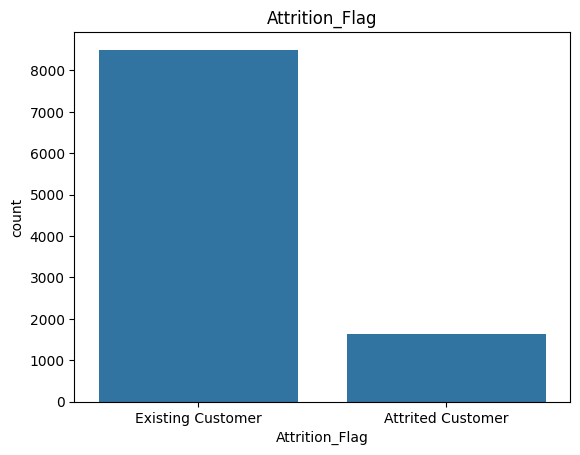

In [28]:
# Plot the countplot for the continuous column Attrition_Flag
sns.countplot(data = BankChurnABT, x = "Attrition_Flag")
plt.title("Attrition_Flag")
plt.show()

**Observations:**
- The number of customers closed their accounts are very less compared to the existing customer.
- We need to consider this while building the model in order to avoid the bias towards the majority class.
- We have 83% observations for Existing Customers and 16% observations for Attrtioners.

### <a name = 'link123'> Customer_Age </a>

In [29]:
# This is a continuous column and we can print the null values
print("The count of null values are:", BankChurnABT["Customer_Age"].isnull().sum())
# Five-Point summary for the column Customer_age
BankChurnABT["Customer_Age"].describe().transpose()

The count of null values are: 0


,Customer_Age
count,10127.000000
mean,46.325960
std,8.016814
min,26.000000
25%,41.000000
50%,46.000000
75%,52.000000
max,73.000000


**Observations:**
- This is a continuous variable and there are no null values
- The minimum value is 26 and the maximum value is 73. Both look normal.
- 25% of the account users are between the age 26-41 and 25% of the account users are between the age 52-73.
- 50% of the account users are between 41-52. This shows a good normal distribution.

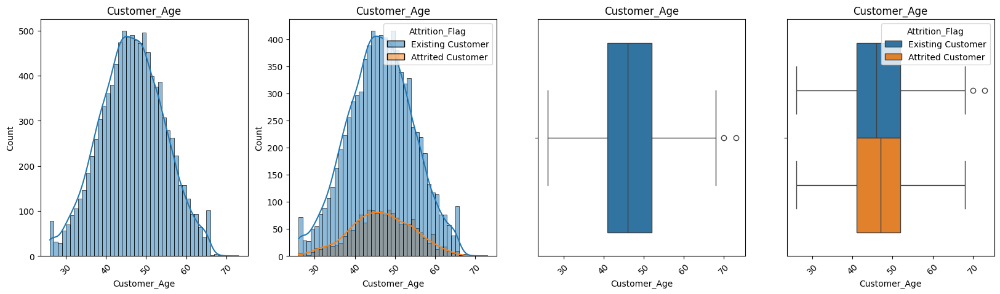

In [30]:
# Plot the histplot and boxplot for the continuous column Customer_Age
UnivariateAnalyzerContinuous("Customer_Age", "Attrition_Flag")

**Observations:**
- The distribution is normal and peaks somewhere at 46.
- There are two outliers identified by the boxplot.
- These values could be a genuine values as we can expect the people of the age 70+ being an account holder.
- We can leave these outliers untreated as they are as these represent the real world scenarios.
- The distribution of the existing or attrited customers also follow a normal curve.

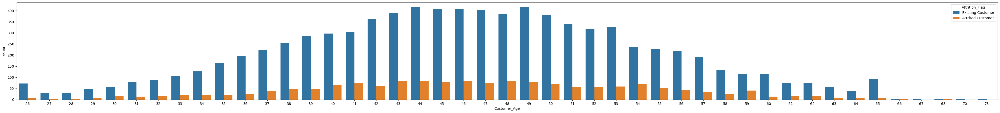

In [31]:
# Since the values are limited we can consider this as a categorical attribute as  well
plt.figure(figsize = (50, 5))
sns.countplot(data = BankChurnABT, x = "Customer_Age", hue = "Attrition_Flag")
plt.show()

**Observations:**
- The mid-aged existing and attrited customers are more for this bank.

### <a name = 'link124'> Gender </a>

In [32]:
# Print the total null values in the column
print("The count of null values are:", BankChurnABT["Gender"].isnull().sum())
# Print the unique values and the counts in the categorical column Gender
print("Unique values and counts are: \n", pd.crosstab(BankChurnABT["Gender"], BankChurnABT["Attrition_Flag"], margins=True))

The count of null values are: 0
Unique values and counts are: 
 Attrition_Flag  Attrited Customer  Existing Customer    All
Gender                                                     
F                             930               4428   5358
M                             697               4072   4769
All                          1627               8500  10127


**Observations:**
- There are no null values in the target column.
- The value M refers to Male and the F refers to Female.
- There are 5358 female customer details and 4769 male customer details.
- Out of 5358 femail customers, 4428 are existing customers and 930 are attrited customers.
- Out of 4769 male customers, 4072 are existing customers and 697 are attrited customers.

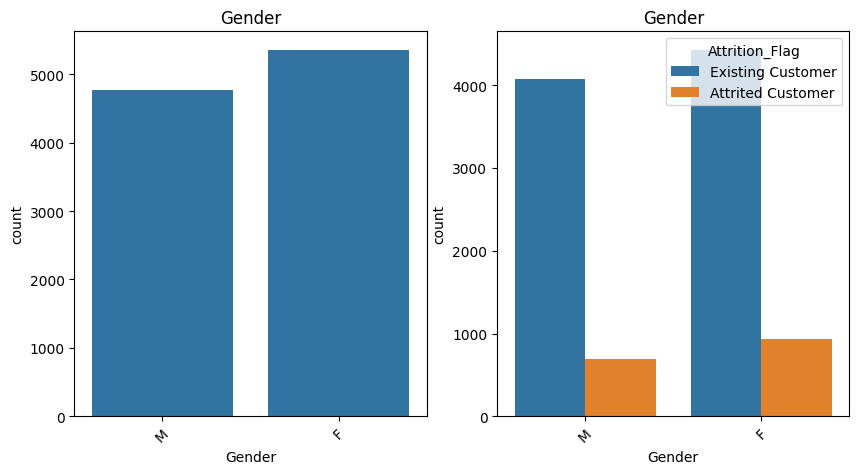

In [33]:
# Plot the countplot for the categorical column Gender
UnivariateAnalyzerCategorical("Gender", "Attrition_Flag")

**Observations:**
- The number of Female credit card users are more than the Male account holders.
- Female customers are taking more credit cards than male customers
- There are approx 47% male customers and 53% are the female customers

### <a name = 'link125'> Dependent_count </a>

In [34]:
# This is a continuous column and we can print the null values
print("The count of null values are:", BankChurnABT["Dependent_count"].isnull().sum())
# Five-Point summary for the column Dependent_count
BankChurnABT["Dependent_count"].describe().transpose()

The count of null values are: 0


,Dependent_count
count,10127.000000
mean,2.346203
std,1.298908
min,0.000000
25%,1.000000
50%,2.000000
75%,3.000000
max,5.000000


**Observations:**
- There are no null values present in the column.

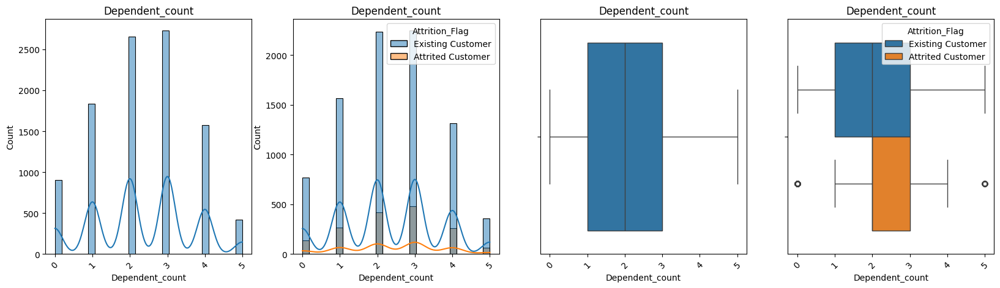

In [35]:
# Plot the histplot and boxplot for the column Dependent_count
UnivariateAnalyzerContinuous("Dependent_count", "Attrition_Flag")

**Observations:**
- The dependents ranges between 0-5 and most of the account holders have 2-3 dependents.
- All the data are from real world scenarios. Hence we need not to treat the records that have 0 values.
- The distribution for the number of children per customer is roughly normal.
- As the median of the distribution is less than 3, more than 50% of customers have spent less than 3 on dependents.
- The Dependent_count does not offer any insight in the distribution of the existing or attrited customers.
- The dependent count does not show any correlation with the different dependent counts. However, most of the customers who attreted have number of dependents between 2-3.

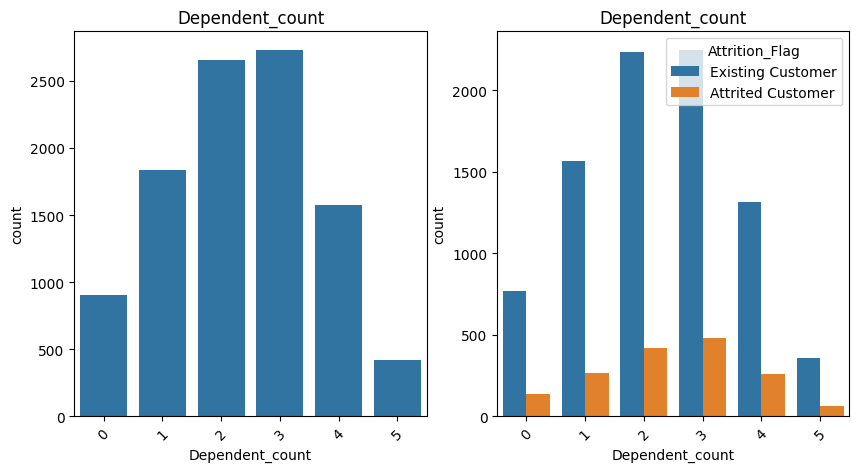

Unique values and counts are: 
 Attrition_Flag   Attrited Customer  Existing Customer    All
Dependent_count                                             
0                              135                769    904
1                              269               1569   1838
2                              417               2238   2655
3                              482               2250   2732
4                              260               1314   1574
5                               64                360    424
All                           1627               8500  10127


In [36]:
# Since the values are limited we can consider this as a categorical attribute as  well
UnivariateAnalyzerCategorical("Dependent_count", "Attrition_Flag")
# Print the unique values and the counts in the categorical column Gender
print("Unique values and counts are: \n", pd.crosstab(BankChurnABT["Dependent_count"], BankChurnABT["Attrition_Flag"], margins=True))

**Observations:**
- The existing and attrited customers show a normal distribution with the number of dependents.
- Among the 1627 attrited customers, there are 482 customers who have 3 dependants and 417 customers who have 2 depdents.
- Among the 8500 existing customers, there are 2250 customers who have 3 dependants and 2238 customers who have 2 dependents.

### <a name = 'link126'> Education_Level </a>

In [37]:
# Print the total null values in the column
print("The count of null values are:", BankChurnABT["Education_Level"].isnull().sum())
# Print the unique values and the counts in the categorical column Education_Level
print("Unique values and counts are: \n", pd.crosstab(BankChurnABT["Education_Level"], BankChurnABT["Attrition_Flag"], margins=True))

The count of null values are: 1519
Unique values and counts are: 
 Attrition_Flag   Attrited Customer  Existing Customer   All
Education_Level                                            
College                        154                859  1013
Doctorate                       95                356   451
Graduate                       487               2641  3128
High School                    306               1707  2013
Post-Graduate                   92                424   516
Uneducated                     237               1250  1487
All                           1371               7237  8608


**Observations:**
- There 1519 null values.
- There are 3128 granduates, 2013 high school passed, 1013 college studying, 516 post-graduates and 451 doctorates.
- There 1487 uneducated customers and we need to check how to treat the null values.

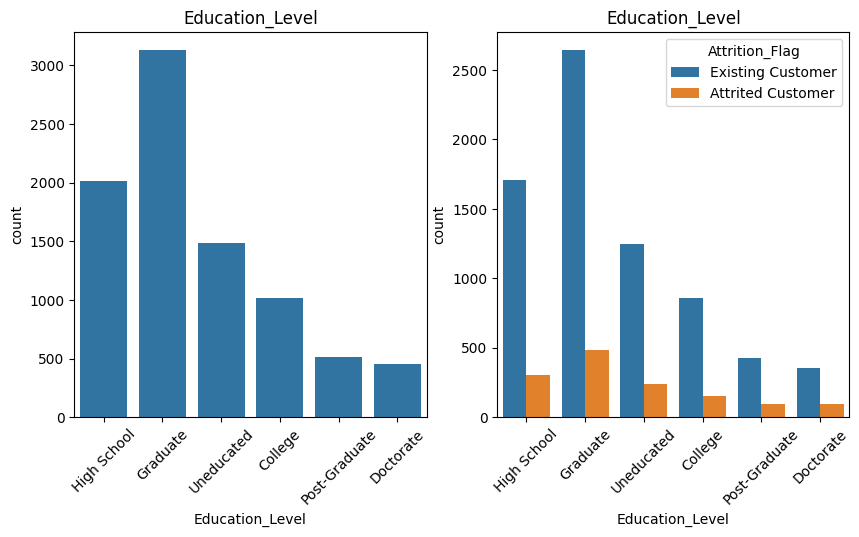

In [38]:
# Plot the countplot for the categorical column Education_Level
UnivariateAnalyzerCategorical("Education_Level", "Attrition_Flag")

**Observations:**
- Among the customers, graduates are more and the post-graduates and doctors are very less.
- Existing and Attrited customers are distribibuted at all the education levels.
- Major of the customers, approx 31%, who take credit cards have their Graduate degree.
- Approx 19% of customers are high school gradudates.
- There are only 14% of customers who have no formal educaiton. These are customers who may not qualify for a credit card.

### <a name = 'link127'> Marital_Status </a>

In [39]:
# Print the total null values in the column
print("The count of null values are:", BankChurnABT["Marital_Status"].isnull().sum())
# Print the unique values and the counts in the categorical column Marital_Status
print("Unique values and counts are: \n", pd.crosstab(BankChurnABT["Marital_Status"], BankChurnABT["Attrition_Flag"], margins=True))

The count of null values are: 749
Unique values and counts are: 
 Attrition_Flag  Attrited Customer  Existing Customer   All
Marital_Status                                            
Divorced                      121                627   748
Married                       709               3978  4687
Single                        668               3275  3943
All                          1498               7880  9378


**Observations:**
- There are 4687 married, 3943 Single and 748 divorced customers.
- There are 749 null values and we need to check the pattern in the records that have null values to determine if this is a miss or a deliberately left without filling.

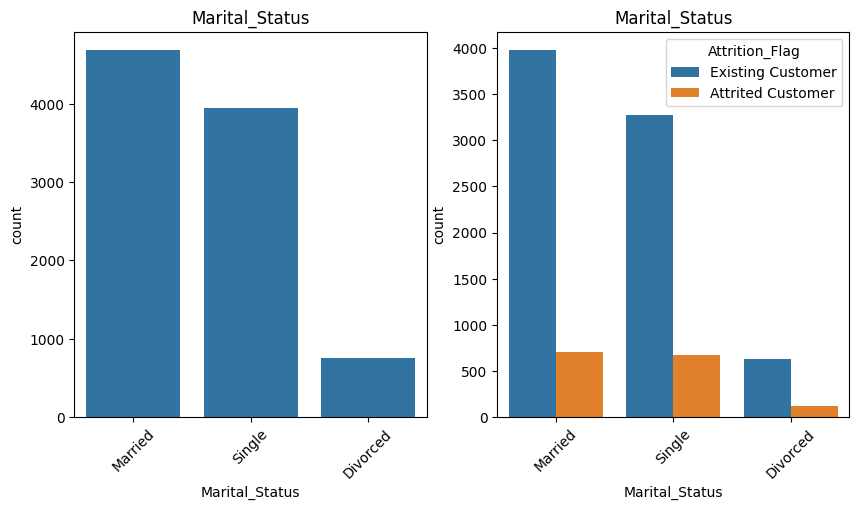

In [40]:
# Plot the countplot for the categorical column Marital_Status
UnivariateAnalyzerCategorical("Marital_Status", "Attrition_Flag")

**Observations:**
- There are more married customers than the Single and Divorced.
- Approx 46% of customers are married. This makes sense as joint accounts are popular.
- Approx 39% of customer are single.
- Note the low amount of divored customers.
- The distribution of attrited and existing customers is spread across the different marital status we do not see a direct correlation.

### <a name = 'link128'> Income_Category </a>

In [41]:
# Print the total null values in the column
print("The count of null values are:", BankChurnABT["Income_Category"].isnull().sum())
# Print the unique values and the counts in the categorical column Income_Category
print("Unique values and counts are: \n", pd.crosstab(BankChurnABT["Income_Category"], BankChurnABT["Attrition_Flag"], margins=True))

The count of null values are: 0
Unique values and counts are: 
 Attrition_Flag   Attrited Customer  Existing Customer    All
Income_Category                                             
$120K +                        126                601    727
$40K - $60K                    271               1519   1790
$60K - $80K                    189               1213   1402
$80K - $120K                   242               1293   1535
Less than $40K                 612               2949   3561
abc                            187                925   1112
All                           1627               8500  10127


**Observations:**
- There are 3561 customers who earn less than \$40K.
- There are 1790 customers who earn between \$40K - \$60K.
- There are 1402 customers who earn between \$60K - \$80K.
- There are 1535 customers who earn between \$80K - \$120K.
- There are 727 customers who earn more than \$120K.
- Around 1112 customer have not mentioned their income Category and this is mentioned as abc. We will take a closure look on the distribution of the data that miss the accurate value and check whether the customers have deliberately skipped this information or is there any typo.

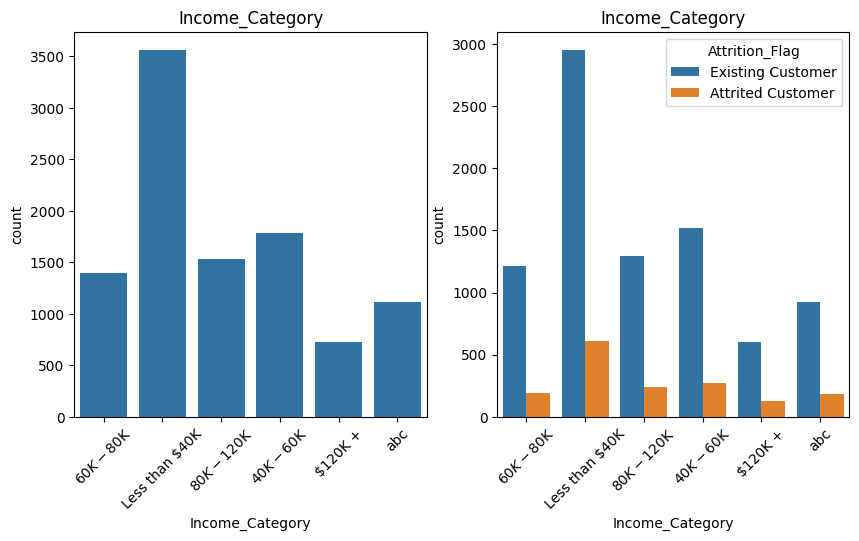

In [42]:
# Plot the countplot for the categorical column Income_Category
UnivariateAnalyzerCategorical("Income_Category", "Attrition_Flag")

**Observations:**
- There are more customers who fall under the income category Less than $40K.
- The distribution of attrited and existing customers is spread across the different income category we do not see a direct correlation.

### <a name = 'link129'> Card_Category </a>

In [43]:
# Print the total null values in the column
print("The count of null values are:", BankChurnABT["Card_Category"].isnull().sum())
# Print the unique values and the counts in the categorical column Card_Category
print("Unique values and counts are: \n", pd.crosstab(BankChurnABT["Card_Category"], BankChurnABT["Attrition_Flag"], margins=True))

The count of null values are: 0
Unique values and counts are: 
 Attrition_Flag  Attrited Customer  Existing Customer    All
Card_Category                                              
Blue                         1519               7917   9436
Gold                           21                 95    116
Platinum                        5                 15     20
Silver                         82                473    555
All                          1627               8500  10127


**Observations:**
- There are no null values in this categorical column.
- There are 4 types of credit cards namely, Blue, Silver, Gold, Platinum.
- There are 9436 customers who have Blue card, 555 customers have Silver card, 116 customers have Gold card and 20 cards have Platinum.

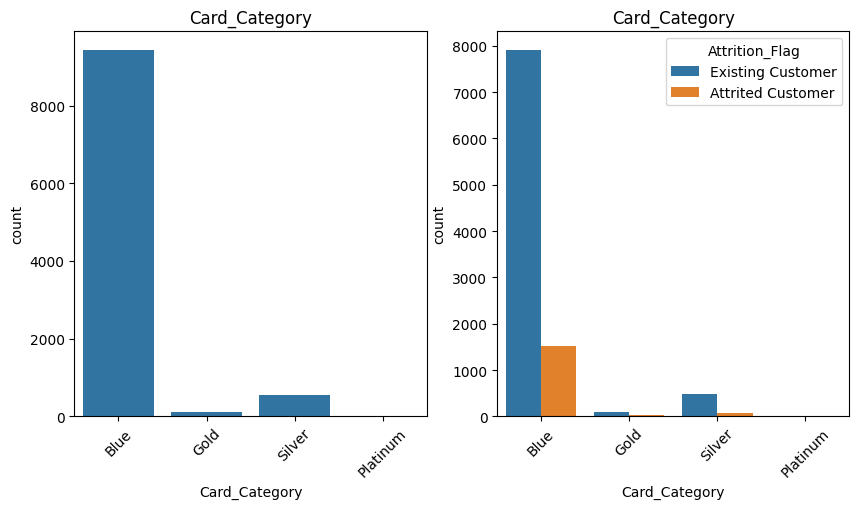

In [44]:
# Plot the countplot for the categorical column Card_Category
UnivariateAnalyzerCategorical("Card_Category", "Attrition_Flag")

**Observations:**
- Around 93% of the card holders are Blue card holders.
- There are only approx 1% of customers that lie in the Gold category which makes sense as these may be the persons with high credit or high income.
- Only a few card holders are platinum card holders.
- The distribution of existing and attrited customers are spread across different card category. Hence card category does not contribute a direct correlation.

### <a name = 'link12A'> Months_on_book </a>

In [45]:
# This is a continuous column and we can print the null values
print("The count of null values are:", BankChurnABT["Months_on_book"].isnull().sum())
# Five-Point summary for the column Months_on_book
BankChurnABT["Months_on_book"].describe().transpose()

The count of null values are: 0


,Months_on_book
count,10127.000000
mean,35.928409
std,7.986416
min,13.000000
25%,31.000000
50%,36.000000
75%,40.000000
max,56.000000


**Observations:**
- There are no null values in the attribute.
- The 25% of the customers are using the cards from past 13-31 months.
- The 25% of the customers are using the cards from past 40-56 months.
- Rest of the 50% of the customers are using the cards from past 31-40 months.
- This shows a normal distribution pattern.

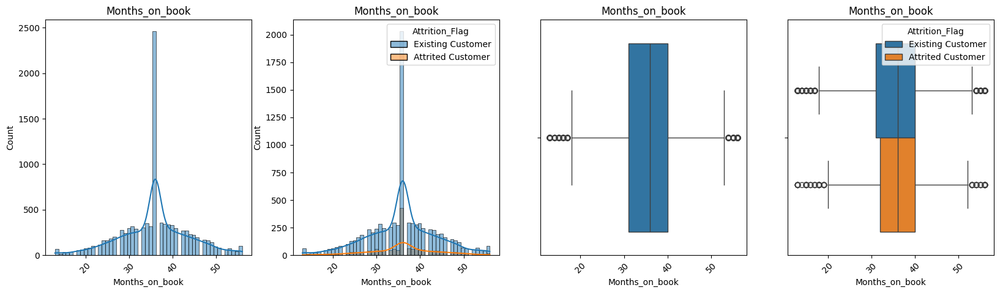

In [46]:
# Plot the histplot and boxplot for the column Months_on_book
UnivariateAnalyzerContinuous("Months_on_book", "Attrition_Flag")

**Observations:**
- There are a few outliers on both sides. This means there are a few users (5 customers) who have recently opted to use the cards.
- Similarly there are a few users (3 customers) who are using the cards from a few years.
- The distribution for the amount spent is highly normal.
- The median lies around 37 months on the books for these customers.
- There are some outliers on the right and left ends of the boxplot but we will not treat them as some variation is always expected in real-world scenarios for variables like amount spent.
- These outliers can be a genuine data and we need not to treat all the outliers.
- The distribution of existing and attrited customers are spread across different ranges and show the normal distribution pattern.

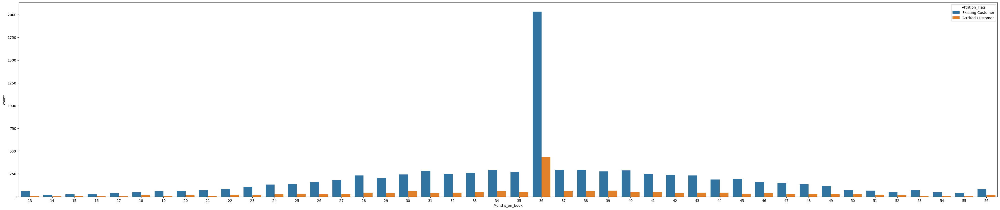

In [47]:
# Since the values are limited we can consider this as a categorical attribute as  well
plt.figure(figsize = (50, 10))
sns.countplot(data = BankChurnABT, x = "Months_on_book", hue = "Attrition_Flag")
plt.show()

**Observations:**
- We see an exceptionally very high value for the value 36.
- We will look for the values 36 and see if there are any duplicates later.

### <a name = 'link12B'> Total_Relationship_Count </a>

In [48]:
# This is a continuous column and we can print the null values
print("The count of null values are:", BankChurnABT["Total_Relationship_Count"].isnull().sum())
# Five-Point summary for the column Total_Relationship_Count
BankChurnABT["Total_Relationship_Count"].describe().transpose()

The count of null values are: 0


,Total_Relationship_Count
count,10127.000000
mean,3.812580
std,1.554408
min,1.000000
25%,3.000000
50%,4.000000
75%,5.000000
max,6.000000


**Observations:**
- There are no null values in the attribute values.
- The minimum value is 1 and the maximum value is 6.

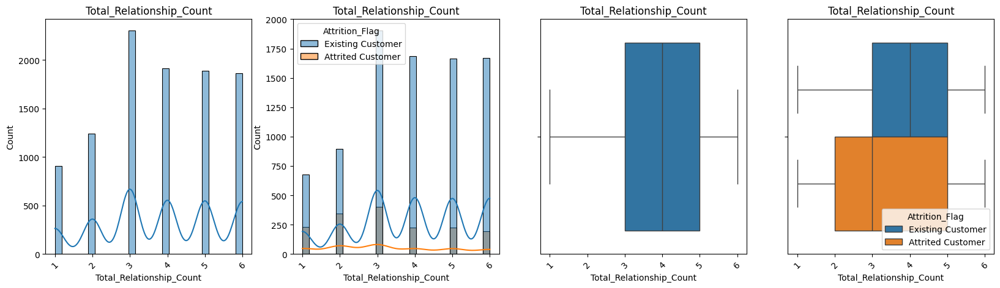

In [49]:
# Plot the histplot and boxplot for the column Total_Relationship_Count
UnivariateAnalyzerContinuous("Total_Relationship_Count", "Attrition_Flag")

**Observations:**
- Total relationship is a distinct value ranging between 1-6. Thi means we have the ncustomers who have 6 products offered by the bank.
- There is no outlier and there is no specific pattern here.
- We can see that there are the mean and median lie around 4 products per customer.
- We can see the high count of customers with 3 products.
- The distribution of existing and attrited customers are distributed in all the ranges for total relationship counts.

Unique values and counts are: 
 Attrition_Flag            Attrited Customer  Existing Customer    All
Total_Relationship_Count                                             
1                                       233                677    910
2                                       346                897   1243
3                                       400               1905   2305
4                                       225               1687   1912
5                                       227               1664   1891
6                                       196               1670   1866
All                                    1627               8500  10127


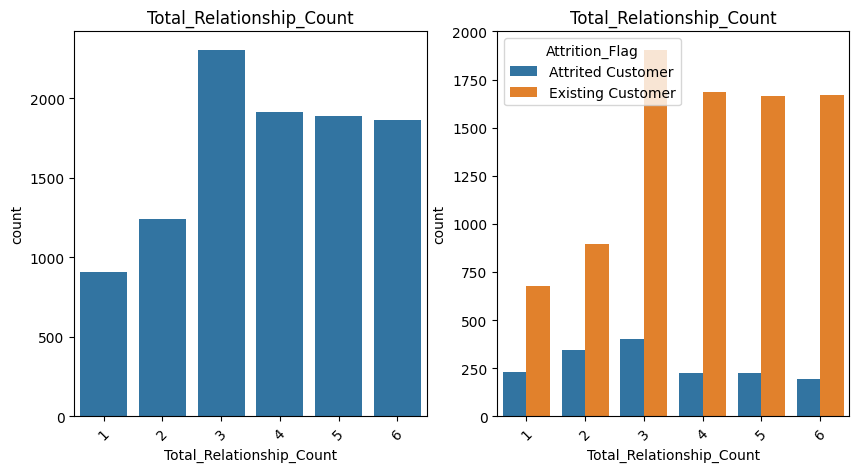

In [50]:
# Print the unique values and the counts in the categorical column Card_Category
print("Unique values and counts are: \n", pd.crosstab(BankChurnABT["Total_Relationship_Count"], BankChurnABT["Attrition_Flag"], margins=True))
# Plot the histplot and boxplot for the column Total_Relationship_Count
UnivariateAnalyzerCategorical("Total_Relationship_Count", "Attrition_Flag")

**Observations:**
- Most of the customers have 3-6 relationship counts and the existing customer hasve more relationship counts.

### <a name = 'link12C'> Months_Inactive_12_mon </a>

In [51]:
# This is a continuous column and we can print the null values
print("The count of null values are:", BankChurnABT["Months_Inactive_12_mon"].isnull().sum())
# Five-Point summary for the column Total_Relationship_Count
BankChurnABT["Months_Inactive_12_mon"].describe().transpose()

The count of null values are: 0


,Months_Inactive_12_mon
count,10127.000000
mean,2.341167
std,1.010622
min,0.000000
25%,2.000000
50%,2.000000
75%,3.000000
max,6.000000


**Observations:**
- The minimum value is 0 which means the card is active.
- The maximum is 6 which means the card is not active since 6 months.

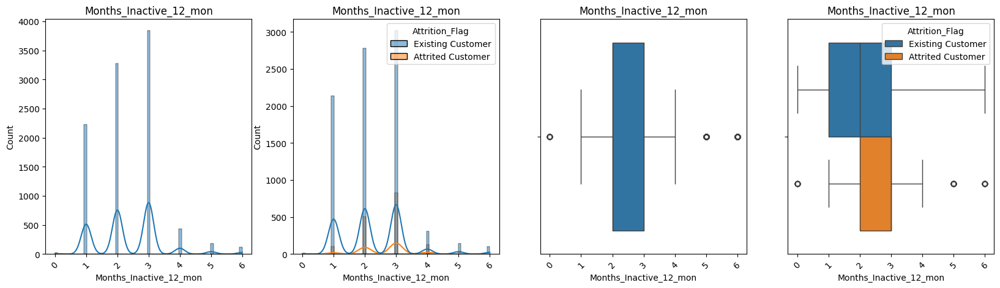

In [52]:
# Plot the histplot and boxplot for the column Months_Inactive_12_mon
UnivariateAnalyzerContinuous("Months_Inactive_12_mon", "Attrition_Flag")

**Observations:**
- The 0 is an outlier and 5, 6 are outlier too.
- Most of the data is distributed between 2-3 and this means the most of the account holders have used their credit cards 2-3 months back.
- The distribution of existing and attrited customers are distributed in all the ranges for all values for months for which the card was inactive.

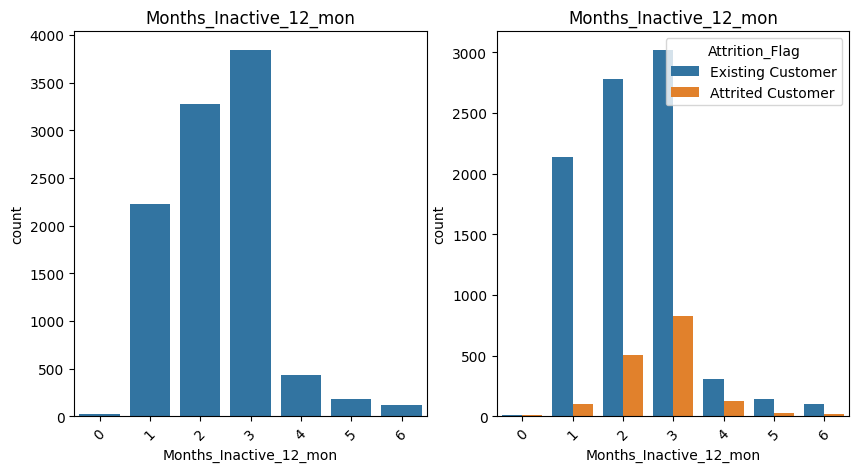

In [53]:
# Since this attribute has a few distinct numbers we can consider this as a cateogrical column
UnivariateAnalyzerCategorical("Months_Inactive_12_mon", "Attrition_Flag")

**Observations:**
- The number of customers who are inactive from 1-3 months are very high compared to the number of customers who are inactive in 4-6 months.

### <a name = 'link12D'> Contacts_Count_12_mon </a>

In [54]:
# This is a continuous column and we can print the null values
print("The count of null values are:", BankChurnABT["Contacts_Count_12_mon"].isnull().sum())
# Five-Point summary for the column Contacts_Count_12_mon
BankChurnABT["Contacts_Count_12_mon"].describe().transpose()

The count of null values are: 0


,Contacts_Count_12_mon
count,10127.000000
mean,2.455317
std,1.106225
min,0.000000
25%,2.000000
50%,2.000000
75%,3.000000
max,6.000000


**Observations:**
- There are no null values in the attribute.
- The minimum value is 0 and the maximum value is 6.

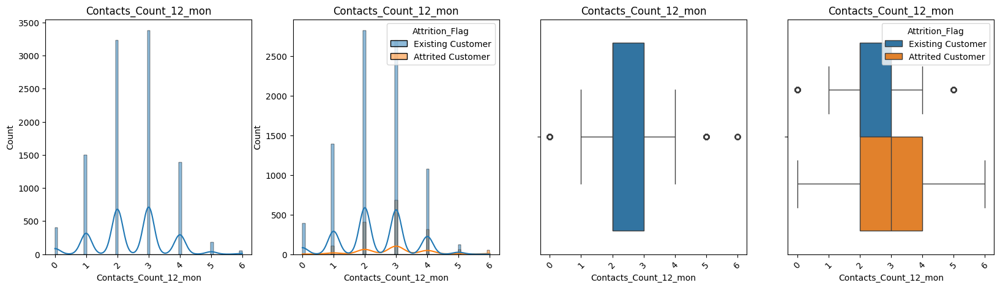

In [55]:
# Plot the histplot and boxplot for the column Contacts_Count_12_mon
UnivariateAnalyzerContinuous("Contacts_Count_12_mon", "Attrition_Flag")

**Observations:**
- Majority of the customers are contacted 2-3 times in the past 12 months.
- There are a few outlier values (0, 5, 6) and these are genunie values. Hence we need not to treat the outliers here.
- The distribution of existing and attrited customers are spread across different ranges in the number of times the customer was contacted in the past 12 months. However, Attrited customer have been contacted for several times in the past 12 months. This shows a good correlation between the the attribute Contacts_Count_12_mon with the target variable Attrition_Flag.

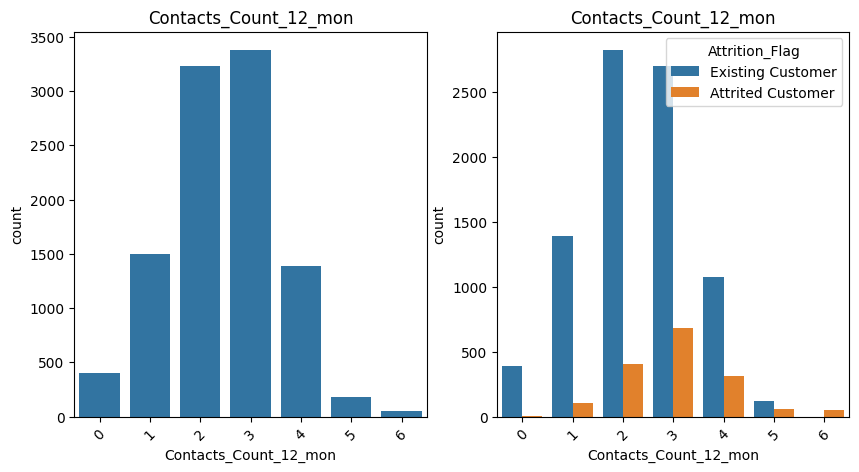

In [56]:
# This attribute has a few unique values and we can consider this as a categorical attribute
UnivariateAnalyzerCategorical("Contacts_Count_12_mon", "Attrition_Flag")

**Observations:**
- Most of the customers (more than 50%) have been contacted 2-3 times in the past 1 year. A few more customers were contacted once or more than three times.

### <a name = 'link12E'> Credit_Limit </a>

In [57]:
# This is a continuous column and we can print the null values
print("The count of null values are:", BankChurnABT["Credit_Limit"].isnull().sum())
# Five-Point summary for the column Credit_Limit
BankChurnABT["Credit_Limit"].describe().transpose()

The count of null values are: 0


,Credit_Limit
count,10127.000000
mean,8631.953698
std,9088.776650
min,1438.300000
25%,2555.000000
50%,4549.000000
75%,11067.500000
max,34516.000000


**Observations:**
- The minimum value is 1438.3 and the maximum value is 34516.
- 75% of the data lies between 1438 - 11067 and the rest of 25% of the data lies between 11067 - 34516.
- This shows a tail on the right side and there will be a lot of outliers.

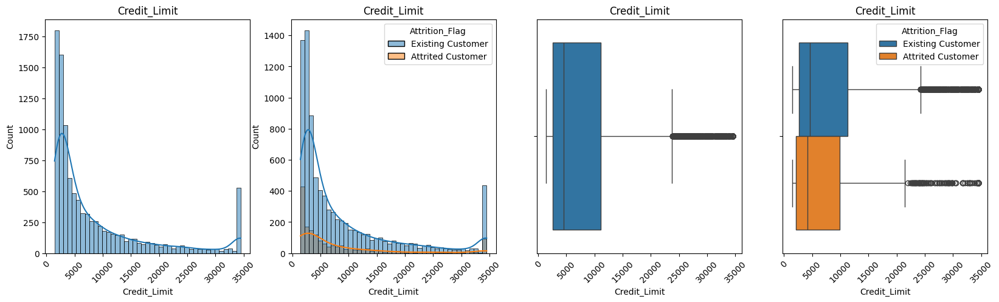

In [58]:
# Plot the histplot and boxplot for the column Credit_Limit
UnivariateAnalyzerContinuous("Credit_Limit", "Attrition_Flag")

**Observations:**
- The number of customers decreases as the credit limit increses.
- However, we have a huge spike at the end where the credit limit after $33K.
- The distribution of the credit amount is right-skewed.
- The boxplot shows that there are outliers at the right end.
- We will not treat these outliers as they represent the real market trend
- The distributin of attrited and existing customers are distributed across different ranges for the credit limit.

### <a name = 'link12F'> Total_Revolving_Bal </a>

In [59]:
# This is a continuous column and we can print the null values
print("The count of null values are:", BankChurnABT["Total_Revolving_Bal"].isnull().sum())
# Five-Point summary for the column Total_Revolving_Bal
BankChurnABT["Total_Revolving_Bal"].describe().transpose()

The count of null values are: 0


,Total_Revolving_Bal
count,10127.000000
mean,1162.814061
std,814.987335
min,0.000000
25%,359.000000
50%,1276.000000
75%,1784.000000
max,2517.000000


**Observations:**
- The minimum value is 0 and the maximum value is 2517.

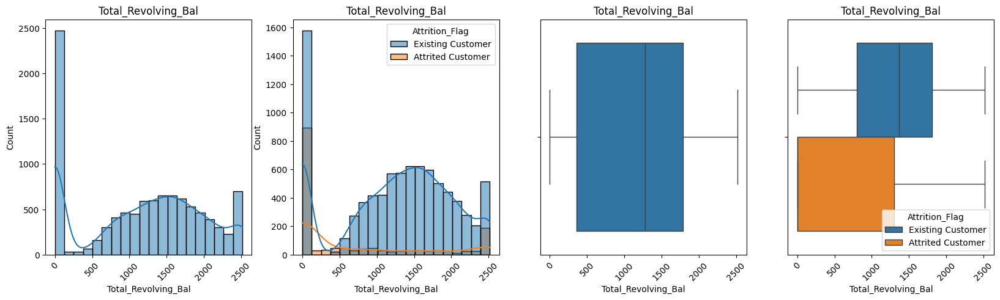

In [60]:
# Plot the histplot and boxplot for the column Total_Revolving_Bal
UnivariateAnalyzerContinuous("Total_Revolving_Bal", "Attrition_Flag")

**Observations:**
- The distribution of the balance that carries over from one month to the next is the revolving balance for which the credit is given is somewhat normal.
- We see a huge spike for the lowest value and the highest value. Except these two, the total revolving balance follows a slight normal curve.
- We will not treat these outliers as they represent the real market trend.
- The distribution of attrited and existing customers are distributed across different ranges of credit limits. However, the boxplot shows that the attrited customers have lower amount total revolving balance compared to the existing customers.
- The outliers represent a real world scenarios and hecne we will retain the values.

### <a name = 'link12G'> Avg_Open_To_Buy </a>

In [61]:
# This is a continuous column and we can print the null values
print("The count of null values are:", BankChurnABT["Avg_Open_To_Buy"].isnull().sum())
# Five-Point summary for the column Avg_Open_To_Buy
BankChurnABT["Avg_Open_To_Buy"].describe().transpose()

The count of null values are: 0


,Avg_Open_To_Buy
count,10127.000000
mean,7469.139637
std,9090.685324
min,3.000000
25%,1324.500000
50%,3474.000000
75%,9859.000000
max,34516.000000


**Observations:**
- There are no null values in this attribute.
- This column provides the average left amount on the credit card open to Buy.
- The minimum value is 3 and the maximum value is 34516.

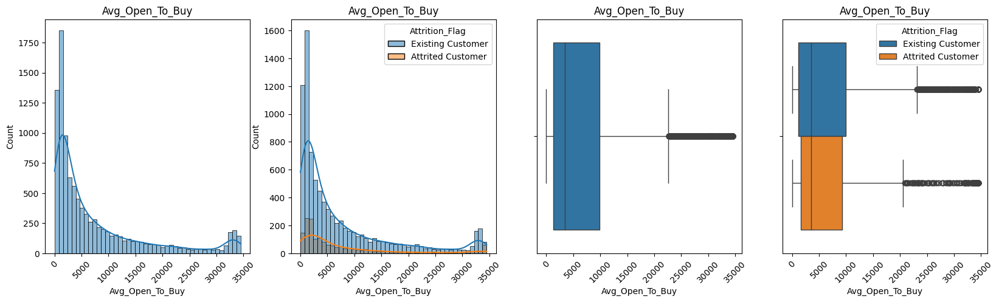

In [62]:
# Plot the histplot and boxplot for the column Avg_Open_To_Buy
UnivariateAnalyzerContinuous("Avg_Open_To_Buy", "Attrition_Flag")

**Observations:**
- The number of customers increases rapidly for the early few range of values and the number of customers decrease with the increase in the average open to buy value.
- There are a lot of outliers with the high value of average open to buy amount.
- The distribution for the amount left on the credit card to use (Average of last 12 months) is right-skewed.
- There is many observations to the right extreme which can be considered as an outliers.
- We will not remove all such data points as they represent real customer trends.
- The distribution of existing and attrited customers are distributed in all the ranges for different values of average open to buy values.

### <a name = 'link12H'> Total_Trans_Amt </a>

In [63]:
# This is a continuous column and we can print the null values
print("The count of null values are:", BankChurnABT["Total_Trans_Amt"].isnull().sum())
# Five-Point summary for the column Total_Trans_Amt
BankChurnABT["Total_Trans_Amt"].describe().transpose()

The count of null values are: 0


,Total_Trans_Amt
count,10127.000000
mean,4404.086304
std,3397.129254
min,510.000000
25%,2155.500000
50%,3899.000000
75%,4741.000000
max,18484.000000


**Observations:**
- There are no null values in the attribute.
- The minimum value is 510 and the maximum value is 18484.
- 75% of the data lies between 510-4741 and rest of the 25% of the data is distributed in the range 4741-18484.
- The distribution will have a tail on the right side and we might expect a lot of outliers.

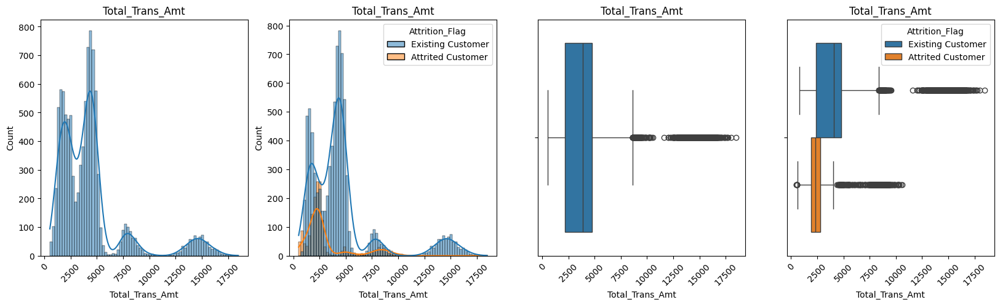

In [64]:
# Plot the histplot and boxplot for the column Total_Trans_Amt
UnivariateAnalyzerContinuous("Total_Trans_Amt", "Attrition_Flag")

**Observations:**
- The values show a normal curve in 4 different clusters.
- There are a lot of outliers and the distribution is highly right-skewed. There are many outliers in the amount spent on above 12500.
- We will not remove all such data points as they represent real customers.
- After looking at the boxplot, we can say that most of the attrited customers have lower value of total_trans_amt when compared with that of the existing customers.

### <a name = 'link12I'> Total_Trans_Ct </a>

In [65]:
# This is a continuous column and we can print the null values
print("The count of null values are:", BankChurnABT["Total_Trans_Ct"].isnull().sum())
# Five-Point summary for the column Total_Trans_Ct
BankChurnABT["Total_Trans_Ct"].describe().transpose()

The count of null values are: 0


,Total_Trans_Ct
count,10127.000000
mean,64.858695
std,23.472570
min,10.000000
25%,45.000000
50%,67.000000
75%,81.000000
max,139.000000


**Observations:**
- There are no null values in the attribute.
- The minimum value is 10 and the maximum value is 139.

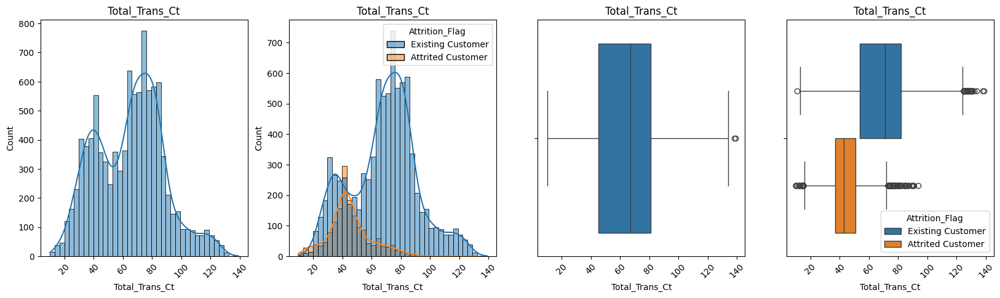

In [66]:
# Plot the histplot and boxplot for the column Total_Trans_Ct
UnivariateAnalyzerContinuous("Total_Trans_Ct", "Attrition_Flag")

**Observations:**
- The total transaction count show a normal distribution for attrited customers with right skewness. A partial normal distribution is observed for the existing customers.
- Majority of the customers ~65 transactions in the last 12 months.
- We can see that there some extreme values in the far right end.
- The attrited customers have lesser total transaction counts when compared with that of the existing customers.
- The outliers can be ignored as these data are real and represent the real world scenario.

### <a name = 'link12J'> Total_Ct_Chng_Q4_Q1 </a>

In [67]:
# This is a continuous column and we can print the null values
print("The count of null values are:", BankChurnABT["Total_Ct_Chng_Q4_Q1"].isnull().sum())
# Five-Point summary for the column Total_Ct_Chng_Q4_Q1
BankChurnABT["Total_Ct_Chng_Q4_Q1"].describe().transpose()

The count of null values are: 0


,Total_Ct_Chng_Q4_Q1
count,10127.000000
mean,0.712222
std,0.238086
min,0.000000
25%,0.582000
50%,0.702000
75%,0.818000
max,3.714000


**Observations:**
- The minimum value is 0 and the maximum value is 3.714.
- 75% of the data is spread acrsoss 0 - 0.818 whereas the rest of the 25% of the data is spread between 0.818 - 3.714.
- This shows a right tail and outliers towards the right skewed data.

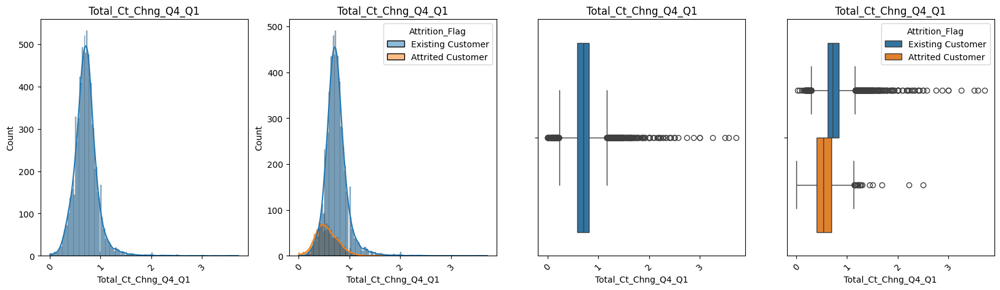

In [68]:
# Plot the histplot and boxplot for the column Total_Ct_Chng_Q4_Q1
UnivariateAnalyzerContinuous("Total_Ct_Chng_Q4_Q1", "Attrition_Flag")

**Observations:**
- The median of the distribution is ~.6 i.e. 50% of customers have ~.6 or less than ~.6 ratio of the total transaction count in 4th quarter and the total transaction count in 1st quarter.
- There are extreme outliers for both existing and attrited customers but the amount of outliers in the case of existing customer is more.
- The median of this attribute for attrited customer is slightly less than that of the existing customers.

### <a name = 'link12K'> Total_Amt_Chng_Q4_Q1 </a>

In [69]:
# This is a continuous column and we can print the null values
print("The count of null values are:", BankChurnABT["Total_Amt_Chng_Q4_Q1"].isnull().sum())
# Five-Point summary for the column Total_Amt_Chng_Q4_Q1
BankChurnABT["Total_Amt_Chng_Q4_Q1"].describe().transpose()

The count of null values are: 0


,Total_Amt_Chng_Q4_Q1
count,10127.000000
mean,0.759941
std,0.219207
min,0.000000
25%,0.631000
50%,0.736000
75%,0.859000
max,3.397000


**Observations:**
- The minimum value is 0 and the maximum value is 3.397
- 75% of the data is distributed between 0 - 0.859. The rest of the 25% of the data lies between 0.859 - 3.397.
- This shows a right skewed data distribution along with outliers towards the right.

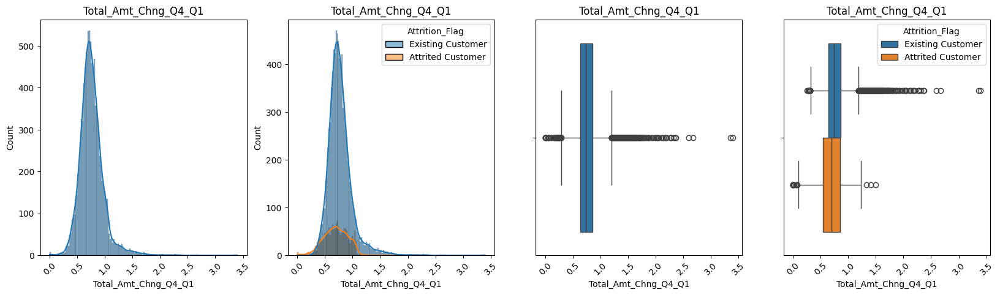

In [70]:
# Plot the histplot and boxplot for the column Total_Amt_Chng_Q4_Q1
UnivariateAnalyzerContinuous("Total_Amt_Chng_Q4_Q1", "Attrition_Flag")

**Observations:**
- The distribution is right skewed and follows a normal curve.
- The median of the distribution is around .7 for the ratio of the total transaction amount in 4th quarter and the total transaction amount in 1st quarter.
- We can see that there are many extreme observations in the variable and see many outliers. We need not to treat these outliers as these represent a realworld scenarios.
- The distribution of existing attrited customers follows normal curve.

### <a name = 'link12K'> Avg_Utilization_Ratio </a>

In [71]:
# This is a continuous column and we can print the null values
print("The count of null values are:", BankChurnABT["Avg_Utilization_Ratio"].isnull().sum())
# Five-Point summary for the column Avg_Utilization_Ratio
BankChurnABT["Avg_Utilization_Ratio"].describe().transpose()

The count of null values are: 0


,Avg_Utilization_Ratio
count,10127.000000
mean,0.274894
std,0.275691
min,0.000000
25%,0.023000
50%,0.176000
75%,0.503000
max,0.999000


**observations:**
- The mininum value is 0 and the maximum value is 0.999.
- 50% of the customers have an average utilization between 0 - 0.17.
- Another 25% of the customers have an average utilization between 0.17 - 0.50.
- Rest of the 25% of the customers have an average utilization between 0.50 - 0.999.

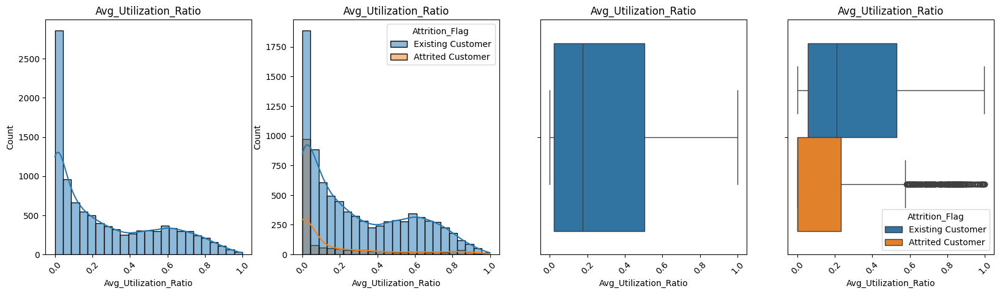

In [72]:
# Plot the histplot and boxplot for the column Avg_Utilization_Ratio
UnivariateAnalyzerContinuous("Avg_Utilization_Ratio", "Attrition_Flag")

**Observations:**
- The count of customers having lower averge utilization ratio is very high and it decreases as the average utilization ration increases.
- Most of the attrited customers are distributed between 0.0 - 0.2.
- There are very few observations with greater than .8 representation of how much of the available credit the customer spent.
- So about 28% is what the average customer uses on average of their total credit.
- The distribution is right skewed.

## <a name = 'link130'> Univariate Analysis & Bivariate Analysis II </a>

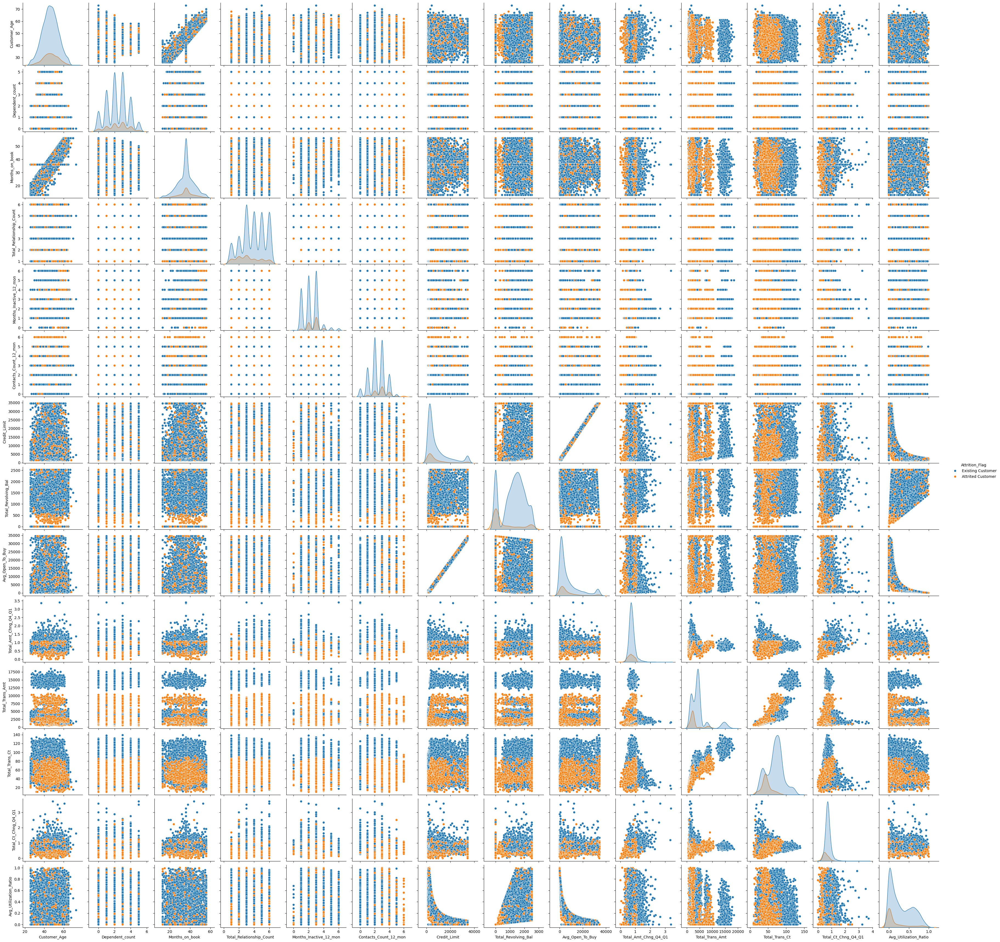

In [73]:
#Draw a pairplot between all the numeric columns
sns.pairplot(data = BankChurnABT, hue = "Attrition_Flag")
plt.show()

**Observations:**
- The data in the attributes Customer_Age, Months_on_book, Credit_Limit, Avg_Open_To_Buy, Total_Amt_Chng_04_01, Total_Ct_Chng_04_01 show a good normal distribution.
- The data in the attributes Dependent_Count, Months_Inactive_12_month, Contacts_count_12_moon, Total_revolving_Bal, Total_Trans_Amt, Total_trans_Ct, Avg_Utilization_ratio show a weak normal distribution.
- The pairplot of Customer_Age with the attributes Dependent_count, Months_on_book, Total_relationship_count, Months_Inactive_12_moon, Countacts_count_12_mon, Credit_limit Avg_Open_To_Buy, Avg_Utilization_Ratio do not show any significant clusters for attrited customers.
- The paiplot of Customer_Age with Total_Ct_Chng_Q4_Q1, TOtal_Trans_Ct, Total_Trans_Amt, Total_Amt_Chng_Q4-Q1, Total_Revolving_Bal show a considerable clustering for existing and attrited customers.
- There are a set of customers with different ages but have a same value of Months_on_book and this shows a straightline that is not following the regular distribution pattern in the pairplot of Customer_Age vs Months_on_book. We need to check these records and see whether this is a real time scenario or some kind of type/duplicates etc.
- The pairplot of Dependent_count with Months_on_book Total_relationship_Count, Months_Inactive_12_mon, Contacts_Count_12_mon, Credit_Limit, Avg_Open_To_Buy, Avg_Utilization_Ratio show the distribution of attrited customers all over the space.
- The pairplot of Dependent_count with Total_Ct_Chng_Q4_Q1, Total_Trans_Ct, Total_Trans_Amt, Total_Amt_Chng_Q4_Q1, Total_Revolving_Bal, show a decent clustering of attrited customers in the distribution space.
- The pairplot of Months_on_book with Avg_Utilization_Ratio, Avg_Open_To_Buy, Credit_Limit, Months_Inactive_12_mon, Total_Relationship_Count do not show proper clustering for attrited customers.
- The pairplot of Months_on_book with Total_Ct_Chng_Q4_Q1, Total_Trans_Ct, Total_Trans_Amt, Total_Amt_Chng_Q4_Q1, Total_revolving_Bal, Contacts_Count_12_mon show a good clustering patterns for attrited customers.
- The pairplot of Total_relationship_Count with Avg_Utilization_Ratio, Contacts_Count_12_mon, Months_Inactive_12_mon, show a scattered points for attrited customers.
- The pairplot of Total_relationship_Count with Total_Ct_Chng_Q4_Q1, Total_Trans_Ct, Total_Trans_Amt, Total_Amt_Chng_Q4_Q1, Avg_Open_To_Buy, Total_revolving_Bal, Credit_Limit show a good clustering for attrited and existing customers.
- The pairplot of Months_Inactive_12_mon with Contacts_Count_12_mon do not show any clustering for attrited customers.
- The pairplot of Months_Inactive_12_mon with Avg_Utilization_Ratio, Total_Ct_Chng_Q4_Q1, Total_Trans_Ct, Total_Trans_Amt, Avg_Open_To_Buy, Total_revolving_Bal, Credit_Limit, Total_Amt_Chng_Q4_Q1 show a good clustering for existing and attrited customers.
- The pairplot of Contacts_Count_12_mon with Avg_Utilization_Ratio, Total_Ct_Chng_Q4_Q1, Total_Trans_Ct, Total_Trans_Amt, Avg_Open_To_Buy, Total_revolving_Bal, Credit_Limit, Total_Amt_Chng_Q4_Q1 show a few groupings of the attrited customers.
- The records with the highest values for Contacts_Count_12_mon are all attrited customers and this means, the bank has tried to reach out to the attrited customers a few times to retain them.
- The pairplot of Credit_Limit with Avg_Open_To_Buy show a straightline that shows a direct correlation between the two attributes.
-The pairplot of Credit_Limit with Avg_Utilization_Ratio shows a curve and the points occupy the area under the curve that appears to be a kind of logicstic curve.
- The pairplot of Credit_Limit with Total_Ct_Chng_Q4_Q1, Total_Trans_Ct, Total_Trans_Amt, Avg_Open_To_Buy, Total_revolving_Bal, Total_Amt_Chng_Q4_Q1 show a good clustering for attrited and existing customers.
- The pairplot of Total_revolving_Bal with Total_Ct_Chng_Q4_Q1, Total_Trans_Ct, Total_Trans_Amt, Avg_Open_To_Buy, Total_Amt_Chng_Q4_Q1 show a good clustering for attrited and existing customers.
- The pairplot of Avg_Open_To_Buy with Avg_Utilization_Ratio, Total_Ct_Chng_Q4_Q1, Total_Trans_Ct, Total_Trans_Amt, Total_Amt_Chng_Q4_Q1 show a good clustering for attrited and existing customers.
- The pairplot of Avg_Open_To_Buy with Avg_Utilization_Ratio shows a curve and the points occupy the area under the curve that appears to be a kind of logicstic curve.
- The pairplot of Total_Amt_Chng_Q4_Q1 with Avg_Utilization_Ratio, Total_Ct_Chng_Q4_Q1, Total_Trans_Ct, Total_Trans_Amt show a good clustering for attrited and existing customers.
- The pairplot of Total_Trans_Amt with Avg_Utilization_Ratio, Total_Ct_Chng_Q4_Q1, Total_Trans_Ct show a good clustering of data for both attrited and existing customers. Higher the Total_trans_Amt, the existing customers are found more than attrited customers.
- The pairplot of Total_Trans_Ct with Avg_Utilization_Ratio, Total_Ct_Chng_Q4_Q1 show a good clustering of data for both attrited and existing customers. Higher the Total_Trans_Ct, the existing customers are found more than attrited customers.
- THe pairplot of Total_Ct_Chng_Q4_Q1 with Avg_Utilization_Ratio shows a good clustering of data for both attrited and existing customers.

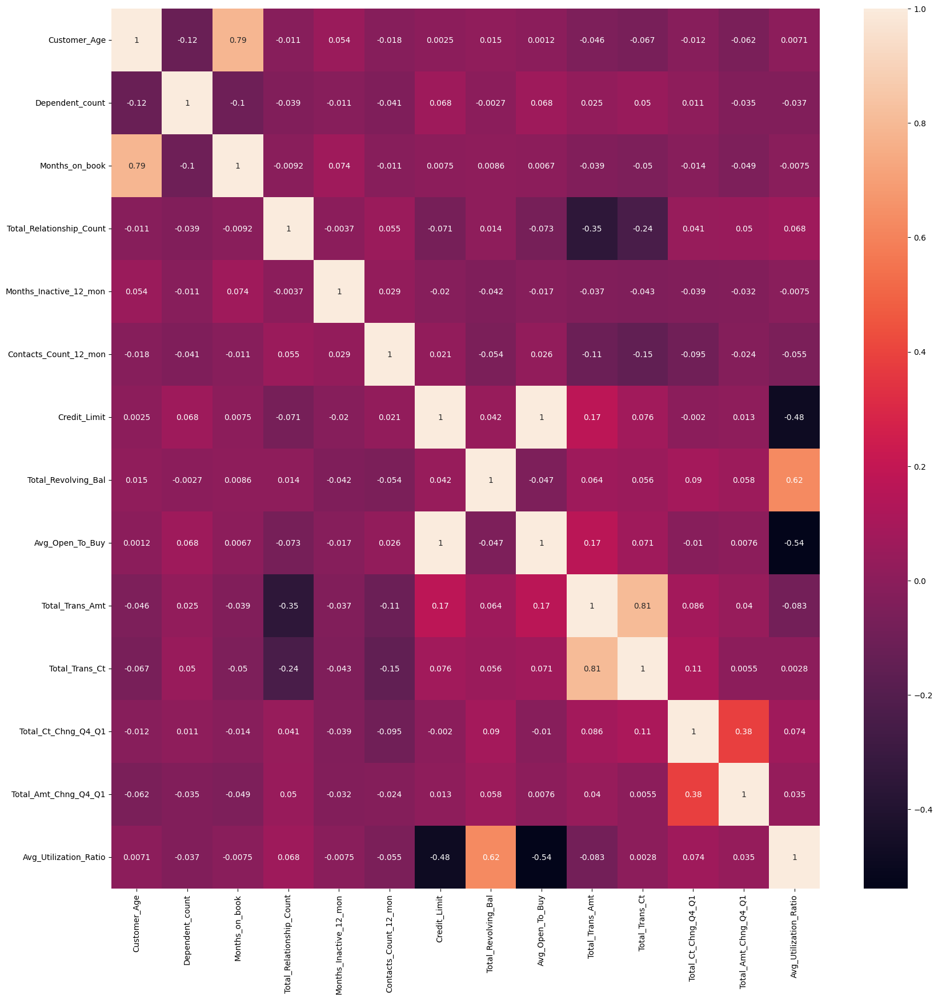

**Pair of columns that Show Strong Positive Correlation:**
- Correlation between Months_on_book vs Customer_Age : 0.7889123589930508
- Correlation between Avg_Open_To_Buy vs Credit_Limit : 0.995980543932001
- Correlation between Total_Trans_Ct vs Total_Trans_Amt : 0.8071920346514367


**Pair of columns that Show Moderate Positive Correlation:**
- Correlation between Avg_Utilization_Ratio vs Total_Revolving_Bal : 0.6240219910059064


**Pair of columns that Show Weak Positive Correlation:**
- Correlation between Total_Amt_Chng_Q4_Q1 vs Total_Ct_Chng_Q4_Q1 : 0.3841892560337165


**Pair of columns that Show No Correlation:**
- Correlation between Dependent_count vs Customer_Age : -0.12225375200525321
- Correlation between Months_on_book vs Dependent_count : -0.10306228148764927
- Correlation between Total_Relationship_Count vs Customer_Age : -0.010931068804259482
- Correlation between Total_Relationship_Count vs Dependent_count : -0.03907638897966843
- Correlation between Total_Relationship_Count vs Months_on_book : -0.00920308023127444
- Correlation between Months_Inactive_12_mon vs Customer_Age : 0.054360998760120814
- Correlation between Months_Inactive_12_mon vs Dependent_count : -0.01076791848095198
- Correlation between Months_Inactive_12_mon vs Months_on_book : 0.07416351432950953
- Correlation between Months_Inactive_12_mon vs Total_Relationship_Count : -0.003675376932207407
- Correlation between Contacts_Count_12_mon vs Customer_Age : -0.0184518547587971
- Correlation between Contacts_Count_12_mon vs Dependent_count : -0.04050495976228984
- Correlation between Contacts_Count_12_mon vs Months_on_book : -0.010774478506729145
- Correlation between Contacts_Count_12_mon vs Total_Relationship_Count : 0.05520316331250555
- Correlation between Contacts_Count_12_mon vs Months_Inactive_12_mon : 0.029492910128659285
- Correlation between Credit_Limit vs Customer_Age : 0.002476227359664691
- Correlation between Credit_Limit vs Dependent_count : 0.06806460020347013
- Correlation between Credit_Limit vs Months_on_book : 0.007507009229698237
- Correlation between Credit_Limit vs Total_Relationship_Count : -0.07138581742352747
- Correlation between Credit_Limit vs Months_Inactive_12_mon : -0.02039379144345504
- Correlation between Credit_Limit vs Contacts_Count_12_mon : 0.02081701171626793
- Correlation between Total_Revolving_Bal vs Customer_Age : 0.014779894579644452
- Correlation between Total_Revolving_Bal vs Dependent_count : -0.002688145858857811
- Correlation between Total_Revolving_Bal vs Months_on_book : 0.008622804474098151
- Correlation between Total_Revolving_Bal vs Total_Relationship_Count : 0.013725848920523953
- Correlation between Total_Revolving_Bal vs Months_Inactive_12_mon : -0.04220960877980104
- Correlation between Total_Revolving_Bal vs Contacts_Count_12_mon : -0.05391273122599859
- Correlation between Total_Revolving_Bal vs Credit_Limit : 0.04249260734895824
- Correlation between Avg_Open_To_Buy vs Customer_Age : 0.0011506778791898996
- Correlation between Avg_Open_To_Buy vs Dependent_count : 0.06829130387444331
- Correlation between Avg_Open_To_Buy vs Months_on_book : 0.006732391627270253
- Correlation between Avg_Open_To_Buy vs Total_Relationship_Count : -0.07260136283372588
- Correlation between Avg_Open_To_Buy vs Months_Inactive_12_mon : -0.01660538381048117
- Correlation between Avg_Open_To_Buy vs Contacts_Count_12_mon : 0.02564596120868006
- Correlation between Avg_Open_To_Buy vs Total_Revolving_Bal : -0.047167127943430955
- Correlation between Total_Trans_Amt vs Customer_Age : -0.04644649085469088
- Correlation between Total_Trans_Amt vs Dependent_count : 0.025046237587382482
- Correlation between Total_Trans_Amt vs Months_on_book : -0.03859062947522644
- Correlation between Total_Trans_Amt vs Months_Inactive_12_mon : -0.03698242508478301
- Correlation between Total_Trans_Amt vs Contacts_Count_12_mon : -0.11277392883883214
- Correlation between Total_Trans_Amt vs Credit_Limit : 0.17173015046794077
- Correlation between Total_Trans_Amt vs Total_Revolving_Bal : 0.06437047704790985
- Correlation between Total_Trans_Amt vs Avg_Open_To_Buy : 0.1659232284970104
- Correlation between Total_Trans_Ct vs Customer_Age : -0.06709686360086074
- Correlation between Total_Trans_Ct vs Dependent_count : 0.0499124766384954
- Correlation between Total_Trans_Ct vs Months_on_book : -0.04981908353962511
- Correlation between Total_Trans_Ct vs Total_Relationship_Count : -0.24189084971343594
- Correlation between Total_Trans_Ct vs Months_Inactive_12_mon : -0.04278703930774648
- Correlation between Total_Trans_Ct vs Contacts_Count_12_mon : -0.15221260518404692
- Correlation between Total_Trans_Ct vs Credit_Limit : 0.07592691199468905
- Correlation between Total_Trans_Ct vs Total_Revolving_Bal : 0.056060493046322143
- Correlation between Total_Trans_Ct vs Avg_Open_To_Buy : 0.07088510162623113
- Correlation between Total_Ct_Chng_Q4_Q1 vs Customer_Age : -0.012142548310869122
- Correlation between Total_Ct_Chng_Q4_Q1 vs Dependent_count : 0.011087180902770234
- Correlation between Total_Ct_Chng_Q4_Q1 vs Months_on_book : -0.014071670900046846
- Correlation between Total_Ct_Chng_Q4_Q1 vs Total_Relationship_Count : 0.04083114826057427
- Correlation between Total_Ct_Chng_Q4_Q1 vs Months_Inactive_12_mon : -0.03898933797671036
- Correlation between Total_Ct_Chng_Q4_Q1 vs Contacts_Count_12_mon : -0.09499691598377367
- Correlation between Total_Ct_Chng_Q4_Q1 vs Credit_Limit : -0.0020198499941714303
- Correlation between Total_Ct_Chng_Q4_Q1 vs Total_Revolving_Bal : 0.08986100776026948
- Correlation between Total_Ct_Chng_Q4_Q1 vs Avg_Open_To_Buy : -0.010075538362497083
- Correlation between Total_Ct_Chng_Q4_Q1 vs Total_Trans_Amt : 0.08558097602856081
- Correlation between Total_Ct_Chng_Q4_Q1 vs Total_Trans_Ct : 0.11232443991563544
- Correlation between Total_Amt_Chng_Q4_Q1 vs Customer_Age : -0.06204209191981924
- Correlation between Total_Amt_Chng_Q4_Q1 vs Dependent_count : -0.03543942896257459
- Correlation between Total_Amt_Chng_Q4_Q1 vs Months_on_book : -0.048959320126718116
- Correlation between Total_Amt_Chng_Q4_Q1 vs Total_Relationship_Count : 0.0501186436597206
- Correlation between Total_Amt_Chng_Q4_Q1 vs Months_Inactive_12_mon : -0.03224671239481278
- Correlation between Total_Amt_Chng_Q4_Q1 vs Contacts_Count_12_mon : -0.024445115120385143
- Correlation between Total_Amt_Chng_Q4_Q1 vs Credit_Limit : 0.012812535653393454
- Correlation between Total_Amt_Chng_Q4_Q1 vs Total_Revolving_Bal : 0.05817366445423314
- Correlation between Total_Amt_Chng_Q4_Q1 vs Avg_Open_To_Buy : 0.0075945291959918825
- Correlation between Total_Amt_Chng_Q4_Q1 vs Total_Trans_Amt : 0.03967759237186187
- Correlation between Total_Amt_Chng_Q4_Q1 vs Total_Trans_Ct : 0.0054685673307721065
- Correlation between Avg_Utilization_Ratio vs Customer_Age : 0.007114222226032007
- Correlation between Avg_Utilization_Ratio vs Dependent_count : -0.03713515854004745
- Correlation between Avg_Utilization_Ratio vs Months_on_book : -0.00754083697632563
- Correlation between Avg_Utilization_Ratio vs Total_Relationship_Count : 0.067662878041457
- Correlation between Avg_Utilization_Ratio vs Months_Inactive_12_mon : -0.0075026327688393415
- Correlation between Avg_Utilization_Ratio vs Contacts_Count_12_mon : -0.05547128465245328
- Correlation between Avg_Utilization_Ratio vs Total_Trans_Amt : -0.08303424588646034
- Correlation between Avg_Utilization_Ratio vs Total_Trans_Ct : 0.0028381122342156077
- Correlation between Avg_Utilization_Ratio vs Total_Ct_Chng_Q4_Q1 : 0.07414320991782065
- Correlation between Avg_Utilization_Ratio vs Total_Amt_Chng_Q4_Q1 : 0.03523483473073431


**Pair of columns that show Weak Negative Correlation:**
- Correlation between Total_Trans_Amt vs Total_Relationship_Count : -0.34722887963701443
- Correlation between Avg_Utilization_Ratio vs Credit_Limit : -0.4829650714174503


**Pair of columns that Show Moderate Negative Correlation:**
- Correlation between Avg_Utilization_Ratio vs Avg_Open_To_Buy : -0.5388077476174624


In [74]:
# Show the correltion between the numeric columns
plt.figure(figsize=(20, 20))
sns.heatmap(data = BankChurnABT[["Customer_Age", "Dependent_count", "Months_on_book", "Total_Relationship_Count", "Months_Inactive_12_mon", "Contacts_Count_12_mon", "Credit_Limit", "Total_Revolving_Bal", "Avg_Open_To_Buy", "Total_Trans_Amt", "Total_Trans_Ct", "Total_Ct_Chng_Q4_Q1", "Total_Amt_Chng_Q4_Q1", "Avg_Utilization_Ratio"]].corr(), annot = True)
plt.show()

# Group the correlations into strong and weak based on the table obtained above
Corr = BankChurnABT[["Customer_Age", "Dependent_count", "Months_on_book", "Total_Relationship_Count", "Months_Inactive_12_mon", "Contacts_Count_12_mon", "Credit_Limit", "Total_Revolving_Bal", "Avg_Open_To_Buy", "Total_Trans_Amt", "Total_Trans_Ct", "Total_Ct_Chng_Q4_Q1", "Total_Amt_Chng_Q4_Q1", "Avg_Utilization_Ratio"]].corr()
CorrSize = len(Corr)
StrongPositiveCorr = ""
ModeratePositiveCorr = ""
WeakPositiveCorr = ""
NoCorr = ""
WeakNegativeCorr = ""
ModerateNegativeCorr = ""
StrongNegativeCorr = ""
UndefinedCorr = ""
for i in range(0, CorrSize):
  for j in range(0, i):
    CorrVal = float(Corr.iloc[i, j])
    if  CorrVal <= 1 and CorrVal >= 0.75:
      StrongPositiveCorr = StrongPositiveCorr + "- Correlation between " + Corr.index[i] + " vs " + Corr.columns[j] + " : " + str(Corr.iloc[i, j]) + "\n"
    elif CorrVal < 0.75 and CorrVal >= 0.5:
      ModeratePositiveCorr = ModeratePositiveCorr + "- Correlation between " + Corr.index[i] + " vs " + Corr.columns[j] + " : " + str(Corr.iloc[i, j]) + "\n"
    elif CorrVal < 0.50 and CorrVal >= 0.25:
      WeakPositiveCorr = WeakPositiveCorr + "- Correlation between " + Corr.index[i] + " vs " + Corr.columns[j] + " : " + str(Corr.iloc[i, j]) + "\n"
    elif CorrVal < 0.25 and CorrVal > -0.25:
      NoCorr = NoCorr + "- Correlation between " + Corr.index[i] + " vs " + Corr.columns[j] + " : " + str(Corr.iloc[i, j]) + "\n"
    elif CorrVal <= -0.25 and CorrVal > -0.5:
      WeakNegativeCorr = WeakNegativeCorr + "- Correlation between " + Corr.index[i] + " vs " + Corr.columns[j] + " : " + str(Corr.iloc[i, j]) + "\n"
    elif CorrVal <= -0.5 and CorrVal > -0.75:
      ModerateNegativeCorr = ModerateNegativeCorr + "- Correlation between " + Corr.index[i] + " vs " + Corr.columns[j] + " : " + str(Corr.iloc[i, j]) + "\n"
    elif CorrVal <= -0.75 and CorrVal >= -1:
      StrongNegativeCorr = StrongNegativeCorr + "- Correlation between " + Corr.index[i] + " vs " + Corr.columns[j] + " : " + str(Corr.iloc[i, j]) + "\n"
    else:
      UndefinedCorr = UndefinedCorr + "- Correlation between " + Corr.index[i] + " vs " + Corr.columns[j] + " : " + str(Corr.iloc[i, j]) + "\n"
if StrongPositiveCorr != "":
  display(Markdown("**Pair of columns that Show Strong Positive Correlation:**\n{}".format(StrongPositiveCorr)))
if ModeratePositiveCorr != "":
  display(Markdown("**Pair of columns that Show Moderate Positive Correlation:**\n{}".format(ModeratePositiveCorr)))
if WeakPositiveCorr != "":
  display(Markdown("**Pair of columns that Show Weak Positive Correlation:**\n{}".format(WeakPositiveCorr)))
if NoCorr != "":
  display(Markdown("**Pair of columns that Show No Correlation:**\n{}".format(NoCorr)))
if WeakNegativeCorr != "":
  display(Markdown("**Pair of columns that show Weak Negative Correlation:**\n{}".format(WeakNegativeCorr)))
if ModerateNegativeCorr != "":
  display(Markdown("**Pair of columns that Show Moderate Negative Correlation:**\n{}".format(ModerateNegativeCorr)))
if StrongNegativeCorr != "":
  display(Markdown("**Pair of columns that Show Strong Negative Correlation:**\n{}".format(StrongNegativeCorr)))
if UndefinedCorr != "":
  display(Markdown("**Pair of columns that Show Undefined Correlation:**\n{}".format(UndefinedCorr)))

**Observations:**
- Most of the pair of the columns do not show any correlation
- Three pairs of columns show a strong positive correlation. Average amount left on the credit card shows a strong positive correlation with Credit Limit. As the credit limit increases, the average amount left on the card at the end of the month increases too. A similar strong correlation is also observed between total transaction counts and the total transaction amount as well.
- There are a few more pair of columns that show moderate and weak, positive and negative correlation.


# <a name = 'link200'> Data Preprocessing <a>

## <a name = 'link210'> Missing Value Treatment <a>

In [75]:
# # Check the columns that have null values
BankChurnABT.isnull().sum()

,0
Attrition_Flag,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,1519
Marital_Status,749
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0


**Observations:**
- There are two columns which have null values. Education_Level and Marital Status.
- From the above EDA we have also noticed that Income_Level a dummy value abc.
- From the above EDA we have also noticed that Months_onBook has a huge number of customers with the value 36. We will check for duplicates as well.
- Even though we have identified many outliers in a few attributes during EDA, we have also decided not to treat those outliers as they represent real time scenarios and we do not see a huge variations in the data distribution.

### <a name = 'link211'> Education_Level <a>

In [76]:
# Print the total null values in the column
print("The count of null values are:", BankChurnABT["Education_Level"].isnull().sum())
# Print the unique values and the counts in the categorical column Education_Level
print("Unique values and counts are: \n", pd.crosstab(BankChurnABT["Education_Level"], BankChurnABT["Attrition_Flag"], margins=True))

The count of null values are: 1519
Unique values and counts are: 
 Attrition_Flag   Attrited Customer  Existing Customer   All
Education_Level                                            
College                        154                859  1013
Doctorate                       95                356   451
Graduate                       487               2641  3128
High School                    306               1707  2013
Post-Graduate                   92                424   516
Uneducated                     237               1250  1487
All                           1371               7237  8608


**Observations:**
- For both Existing and Attrited customers, the number of Graduates are more than any other category of education level. Hence we can replace the null values with Graduates.

In [77]:
MFEducationLevel = BankChurnABT["Education_Level"].mode()[0]

# Replace NaN values in column Education_Level with the most frequent value
BankChurnABT["Education_Level"].fillna(MFEducationLevel, inplace = True)

# Print the total null values in the column
print("The count of null values are:", BankChurnABT["Education_Level"].isnull().sum())

# Print the unique values and the counts in the categorical column Education_Level
print("Unique values and counts are: \n", pd.crosstab(BankChurnABT["Education_Level"], BankChurnABT["Attrition_Flag"], margins=True))

The count of null values are: 0
Unique values and counts are: 
 Attrition_Flag   Attrited Customer  Existing Customer    All
Education_Level                                             
College                        154                859   1013
Doctorate                       95                356    451
Graduate                       743               3904   4647
High School                    306               1707   2013
Post-Graduate                   92                424    516
Uneducated                     237               1250   1487
All                           1627               8500  10127


### <a name = 'link212'> Marital_Status <a>

In [78]:
# Print the total null values in the column
print("The count of null values are:", BankChurnABT["Marital_Status"].isnull().sum())
# Print the unique values and the counts in the categorical column Marital_Status
print("Unique values and counts are: \n", pd.crosstab(BankChurnABT["Marital_Status"], BankChurnABT["Attrition_Flag"], margins=True))

The count of null values are: 749
Unique values and counts are: 
 Attrition_Flag  Attrited Customer  Existing Customer   All
Marital_Status                                            
Divorced                      121                627   748
Married                       709               3978  4687
Single                        668               3275  3943
All                          1498               7880  9378


**Observations:**
- The marital status has more value for Married than the other. Hence we can treat the null values as married

In [79]:
MFMaritalStatus = BankChurnABT["Marital_Status"].mode()[0]

# Replace NaN values in column Marital_Status with the most frequent value
BankChurnABT["Marital_Status"].fillna(MFMaritalStatus, inplace = True)

# Print the total null values in the column
print("The count of null values are:", BankChurnABT["Marital_Status"].isnull().sum())

# Print the unique values and the counts in the categorical column Marital_Status
print("Unique values and counts are: \n", pd.crosstab(BankChurnABT["Marital_Status"], BankChurnABT["Attrition_Flag"], margins=True))

The count of null values are: 0
Unique values and counts are: 
 Attrition_Flag  Attrited Customer  Existing Customer    All
Marital_Status                                             
Divorced                      121                627    748
Married                       838               4598   5436
Single                        668               3275   3943
All                          1627               8500  10127


## <a name = 'link220'> Outlier Detection and Treatment <a>

### <a name = 'link213'> Income_Level <a>

In [80]:
# Identify the rows that have Income_Category as abc and replace them with the majority category
print("The column with dummy values: ", BankChurnABT[BankChurnABT["Income_Category"] == "abc"]["Income_Category"].value_counts())
BankChurnABT["Income_Category"].replace("abc", np.nan, inplace = True)
MFIncomeLevel = BankChurnABT["Income_Category"].mode()[0]

# Replace NaN values in column Income_Category with the most frequent value
BankChurnABT["Income_Category"].fillna(MFIncomeLevel, inplace = True)

# Print the total null values in the column
print("The distinct values in the column: ", BankChurnABT["Income_Category"].value_counts())

The column with dummy values:  Income_Category
abc    1112
Name: count, dtype: int64
The distinct values in the column:  Income_Category
Less than $40K    4673
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
$120K +            727
Name: count, dtype: int64


**Observations:**
- We have replaced abc wtih Less than $40K.

### <a name = 'link213'> Months_on_book <a>

In [81]:
# Analysis of the data having Months_on_book = 36
DuplicatedRecords = BankChurnABT[BankChurnABT["Months_on_book"] == 36].duplicated()
DuplicatedRecords.value_counts()

,count
False,2463


**Observations:**
- We do not see any duplicate rows and all the 2463 rows that have Months_on_book = 36 are genuine records and we can believe that a customer drive or a promotion drive might have attracted 2.4K customers around 3 years back.
- Even though we identified a few outliers in the real time data, we left them as they are because they reproese t a true population.

## <a name = 'link230'> Feature Engineering <a>

In [82]:
# Identify the columns that have non-numeric categorical value
print("The columns with non-numeric categorical value:", list(BankChurnABT.dtypes[BankChurnABT.dtypes == "object"].index))

The columns with non-numeric categorical value: ['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']


In [83]:
print("List of unique values in Attrition Flag:", list(BankChurnABT["Attrition_Flag"].unique()))
print("List of unique values in Gender:", list(BankChurnABT["Gender"].unique()))
print("List of unique values in Education_Level:", list(BankChurnABT["Education_Level"].unique()))
print("List of unique values in Marital_Status:", list(BankChurnABT["Marital_Status"].unique()))
print("List of unique values in Income_Category:", list(BankChurnABT["Income_Category"].unique()))
print("List of unique values in Card_Category:", list(BankChurnABT["Card_Category"].unique()))

List of unique values in Attrition Flag: ['Existing Customer', 'Attrited Customer']
List of unique values in Gender: ['M', 'F']
List of unique values in Education_Level: ['High School', 'Graduate', 'Uneducated', 'College', 'Post-Graduate', 'Doctorate']
List of unique values in Marital_Status: ['Married', 'Single', 'Divorced']
List of unique values in Income_Category: ['$60K - $80K', 'Less than $40K', '$80K - $120K', '$40K - $60K', '$120K +']
List of unique values in Card_Category: ['Blue', 'Gold', 'Silver', 'Platinum']


**Observations:**
- We will replace Attrition_Flag values with 0 and 1.
- For rest of the columns we will use dummy columns

In [84]:
# Prepare the replaceStruct and OneHotCols to replace the above categorical values with the boolean values
replaceStruct = {"Attrition_Flag": {"Existing Customer": False, "Attrited Customer": True }}
oneHotCols = ["Gender", "Education_Level", "Marital_Status", "Income_Category", "Card_Category"]
BankChurnABT = BankChurnABT.replace(replaceStruct)
BankChurnABT = pd.get_dummies(BankChurnABT, columns = oneHotCols)
BankChurnABT.dtypes

,0
Attrition_Flag,bool
Customer_Age,int64
Dependent_count,int64
Months_on_book,int64
Total_Relationship_Count,int64
Months_Inactive_12_mon,int64
Contacts_Count_12_mon,int64
Credit_Limit,float64
Total_Revolving_Bal,int64
Avg_Open_To_Buy,float64


## <a name = 'link240'> Train - Validation - Test Split <a>

In [85]:
# Split the Datafraome into X and Y with Attrition_Flag as Y and rest of the column as X
X = BankChurnABT.drop(columns = "Attrition_Flag")
Y = BankChurnABT["Attrition_Flag"]

# Split the Dataframe X and Y into XTemp, XTest, YTemp, YTest
XTemp, XTest, YTemp, YTest = train_test_split(X, Y, test_size = 0.20, random_state = 1, stratify = Y)
# Split the Dataframe XTemp and YTemp into XTrain, XValid, YTrain, YValid
XTrain, XValid, YTrain, YValid = train_test_split(XTemp, YTemp, test_size = 0.20, random_state = 1, stratify = YTemp)

## <a name = 'link250'> Data Leakage Check <a>

In [86]:
# Print the rows and columns in the original dataframe and the split dataframe
print("The number of rows in the dataframe X:", X.shape[0], "and the number of columns in the dataframe X:", X.shape[1])
print("The number of rows in the dataframe Y:", Y.shape[0])

# Print the rows and columns in the XTrain, XValid, XTest, YTrain, YValid, YTest
print("The number of rows in the dataframe XTrain:", XTrain.shape[0], "and the number of columns in the dataframe XTrain:", XTrain.shape[1])
print("The number of rows in the dataframe XValid:", XValid.shape[0], "and the number of columns in the dataframe XValid:", XValid.shape[1])
print("The number of rows in the dataframe XTest:", XTest.shape[0], "and the number of columns in the dataframe XTest:", XTest.shape[1])
print("The number of rows in the dataframe YTrain:", YTrain.shape[0])
print("The number of rows in the dataframe YValid:", YValid.shape[0])
print("The number of rows in the dataframe YTest:", YTest.shape[0])

# Print the total rows from all the dataframes XTrain, XValid, XTest and YTrain, YValid, YTest
print("The total rows from all dataframe XTrain, XValid, XTest: ", XTrain.shape[0] + XValid.shape[0] + XTest.shape[0])
print("The total rows from all dataframe YTrain, YValid, YTest: ", YTrain.shape[0] + YValid.shape[0] + YTest.shape[0])

The number of rows in the dataframe X: 10127 and the number of columns in the dataframe X: 34
The number of rows in the dataframe Y: 10127
The number of rows in the dataframe XTrain: 6480 and the number of columns in the dataframe XTrain: 34
The number of rows in the dataframe XValid: 1621 and the number of columns in the dataframe XValid: 34
The number of rows in the dataframe XTest: 2026 and the number of columns in the dataframe XTest: 34
The number of rows in the dataframe YTrain: 6480
The number of rows in the dataframe YValid: 1621
The number of rows in the dataframe YTest: 2026
The total rows from all dataframe XTrain, XValid, XTest:  10127
The total rows from all dataframe YTrain, YValid, YTest:  10127


**Observations:**
- All the rows and columns are scaled appropriately.
- We do not see any null values in the scaled dataframe.

# <a name = 'link300'> Model Building - Original Data <a>

## <a name = 'link310'> Model Choose the metric to optimize for the problem <a>

### <a name = 'link311'> Definition <a>

- A model has to predict whether the Attrition_Flag for a Bank customer can be True or False.
- If the Attrition_Flag is True then the customer is an attrited customer.
- If the Attrition Flag is False then the customer is an existing customer.

### <a name = 'link312'> Type I Error <a>

- If the actual Attrition_Flag is False and the predicted value is True the case is False Positives.
- This is Type I error in which the model predicts an existing customer as attrited customer.

### <a name = 'link313'> Type II Error <a>

- If the actual Attrition_Flag is True and and the predicted value is False then the case is False Negatives.
- This is Type II error in which the model predicts an attrited customer as existing customer.

### <a name = 'link313'> Metric Consideration <a>

- If there is a Type I error where the model wrongly predicts an existing customer as an attrited customer, then the error can be tolerated. In this case the bank needs to offer a few programs to retain the customer and such efforts will surely retain the customer and removes any chances of giving up the bank services.
- If there is a Type II error where the model wrong predicts an attrited customer as an existing customer, then the error cannot be tolerated. In such case, the bank will simply ignore a potential attriting customer and that action will further increases the chances for the customer to give up the bank.
- Hence we need to consider a metric that makes no or least mistakes in predicting the False Negatives so that the Type II error can be minimized.
- Hence we will populate all the metrics that are available, however, we will concentrate on the performance of Recall/Sensitivity/True Positive Rate which is calculated as TP / (TP + FN). This should be as high as possible.
- We can also consider Negative Predictive Value (NPV) which is the proportion of correctly predicted negative instances out of the total predicted negatives. This is calculated as TN / (TN + FN). This should be as high as possible.
- We can also consider False Omission Rate (FOR) which is the proportion of predicted negatives that are actually false negatives. This is calculated as FN / (TN + FN). The value of FOR should be as low as possible.
- As of now we will focus on improving the Recall and we will not be considering NPV and FOR.

In [87]:
# We will use this class to store the different matrics of various models and compare
class ModelPerformanceStats:
  def __init__(self, name, accuracy, recall, precision, f1):
    self.name = name
    self.accuracy = accuracy
    self.recall = recall
    self.precision = precision
    self.f1 = f1
  def __repr__(self):
    return f"ModelPerformanceStats(name = {self.name}, accuracy = {self.accuracy}, recall = {self.recall}, precision = {self.precision}, f1 = {self.f1})"

AllModels = []

## <a name = 'link320'> Build 5 models (from decision trees, bagging and boosting methods) <a>

**Cross-Validation Performance:**

Model Name: DTCDefaultModel

- Recall: [0.76923077 0.75961538 0.76923077 0.84615385 0.75       0.76923077
 0.80769231 0.80769231 0.71153846 0.75238095] Min: 0.7115384615384616 Max: 0.8461538461538461 Mean: 0.7742765567765567

Model Name: BCDefaultModel

- Recall: [0.77884615 0.86538462 0.83653846 0.82692308 0.76923077 0.78846154
 0.79807692 0.86538462 0.76923077 0.73333333] Min: 0.7333333333333333 Max: 0.8653846153846154 Mean: 0.8031410256410256

Model Name: ABCDefaultModel

- Recall: [0.84615385 0.79807692 0.83653846 0.83653846 0.83653846 0.83653846
 0.79807692 0.875      0.75961538 0.73333333] Min: 0.7333333333333333 Max: 0.875 Mean: 0.8156410256410256

Model Name: GBCDefaultModel

- Recall: [0.82692308 0.88461538 0.875      0.83653846 0.82692308 0.86538462
 0.77884615 0.86538462 0.74038462 0.75238095] Min: 0.7403846153846154 Max: 0.8846153846153846 Mean: 0.8252380952380953

Model Name: XGBCCDefaultModel

- Recall: [0.86538462 0.88461538 0.93269231 0.91346154 0.90384615 0.875
 0.81730769 0.92307692 0.83653846 0.8       ] Min: 0.8 Max: 0.9326923076923077 Mean: 0.8751923076923077

**Validation Performance: with Recall Values:**

- Model Name: DTCDefaultModel Recall: 0.8620689655172413

- Model Name: BCDefaultModel Recall: 0.8390804597701149

- Model Name: ABCDefaultModel Recall: 0.842911877394636

- Model Name: GBCDefaultModel Recall: 0.8697318007662835

- Model Name: XGBCCDefaultModel Recall: 0.8773946360153256

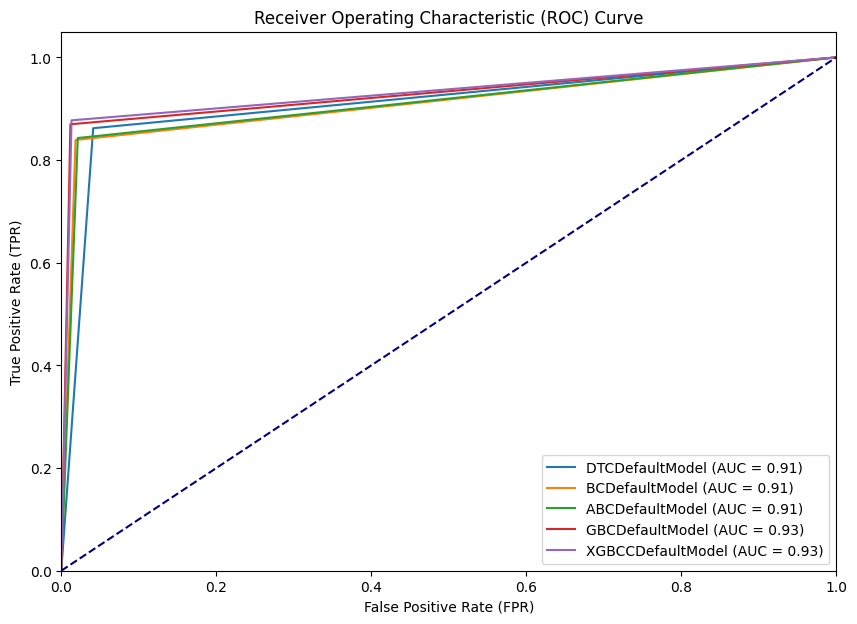

In [88]:
# Use Pipeline() to club scaling and model building

DefaultModels = []
DefaultModelNames = []
DefaultModelResults = []

DefaultModels.append(("DTCDefaultModel", Pipeline([("DTCScaler", StandardScaler()), ("DTCDefault", DecisionTreeClassifier(random_state = 1))])))
DefaultModels.append(("BCDefaultModel", Pipeline([("BCScaler", StandardScaler()), ("BCDefault", BaggingClassifier(random_state = 1))])))
DefaultModels.append(("ABCDefaultModel", Pipeline([("ABCScaler", StandardScaler()), ("ABCDefault", AdaBoostClassifier(random_state = 1))])))
DefaultModels.append(("GBCDefaultModel", Pipeline([("GBCScaler", StandardScaler()), ("GBCDefault", GradientBoostingClassifier(random_state = 1))])))
DefaultModels.append(("XGBCCDefaultModel", Pipeline([("XGBCScaler", StandardScaler()), ("XGBCDefault", XGBClassifier(random_state = 1))])))

# loop through all models to get the mean cross validated score
display(Markdown("**Cross-Validation Performance:**"))

for name, model in DefaultModels:
  scoring = ["accuracy", "recall", "precision", "f1"]
  kfold = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 1)
  cv_result = cross_validate(estimator = model, X = XTrain, y = YTrain, scoring = scoring, cv = kfold)
  DefaultModelResults.append(cv_result["test_recall"])
  DefaultModelNames.append(name)
  display(Markdown("Model Name: {}".format(name)))
  display(Markdown("- Recall: {} Min: {} Max: {} Mean: {}".format(cv_result["test_recall"], cv_result["test_recall"].min(), cv_result["test_recall"].max(), cv_result["test_recall"].mean())))

# loop through all models to get the
display(Markdown("**Validation Performance: with Recall Values:**"))
plt.figure(figsize=(10, 7))
for name, model in DefaultModels:
  model.fit(XTrain, YTrain)
  YPred = model.predict(XValid)
  accuracy = accuracy_score(YValid, YPred)
  recall = recall_score(YValid, YPred)
  precision = precision_score(YValid, YPred)
  f1 = f1_score(YValid, YPred)
  AllModels.append(ModelPerformanceStats(name, accuracy, recall, precision, f1))
  display(Markdown("- Model Name: {} Recall: {}".format(name, recall)))
  fpr, tpr, thresholds = roc_curve(YValid, YPred)
  roc_auc = auc(fpr, tpr)
  plt.plot(fpr, tpr, label=f"{name} (AUC = {roc_auc:.2f})")

# Plot settings
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')  # Diagonal line for random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

**Observations:**
- We have captured different metrics, however, we will focus on recall at the beginning. If two models return same recall value then we will consider other metrics.
- The better recall values and better AUC are returned by Adaptive Boosting, Gradient Boosting and XGBoosting.
  - Model Name: ABCDefaultModel Min: 0.7333333333333333 Max: 0.875 Mean: 0.8156410256410256
  - Model Name: GBCDefaultModel Min: 0.7403846153846154 Max: 0.8846153846153846 Mean: 0.8252380952380953
  - Model Name: XGBCCDefaultModel Min: 0.8 Max: 0.9326923076923077 Mean: 0.8751923076923077

- The direct Train and Validation method provides better results for Adaptive Boosting, Gradient Boosting and XGBoosting.
  - Model Name: ABCDefaultModel Recall: 0.842911877394636
  - Model Name: GBCDefaultModel Recall: 0.8697318007662835
  - Model Name: XGBCCDefaultModel Recall: 0.8773946360153256
- These three can become a better contenders for further tuning with cross validation output.

## <a name = 'link330'> Check and comment on model performance across different metrics <a>

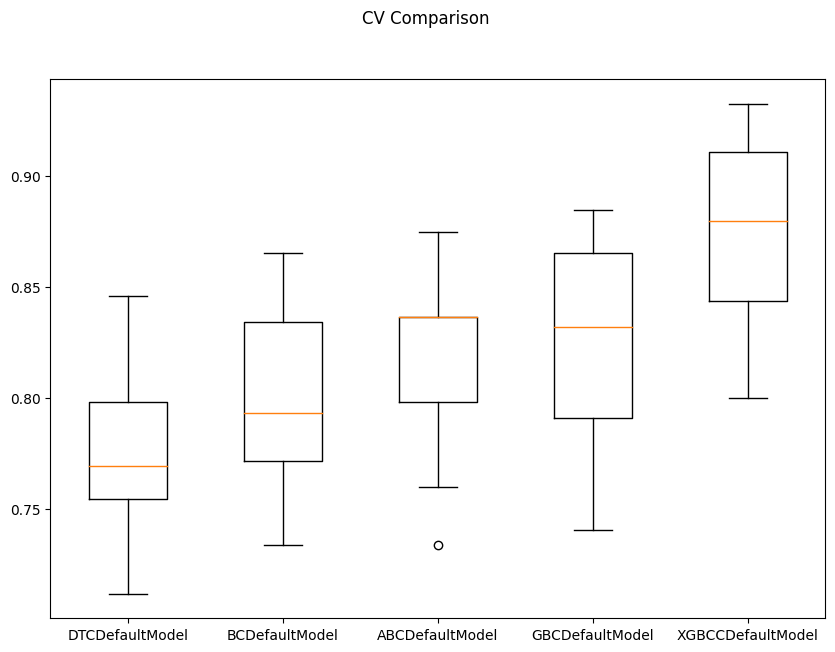

In [89]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure(figsize=(10, 7))

fig.suptitle("CV Comparison")
ax = fig.add_subplot(111)

plt.boxplot(DefaultModelResults)
ax.set_xticklabels(DefaultModelNames)

plt.show()

**Observations:**
- Adaptive Boosting, Gradient Boosting and XGBoosting models provide higher mode of the vaules.
- We can consider these models to improve while tuning.

# <a name = 'link400'> Model Building - Oversampled data <a>

## <a name = 'link410'> Build 5 models (from decision trees, bagging and boosting methods) <a>

**Cross-Validation Performance:**

Model Name: OSDTCDefaultModel

- Recall: [0.79807692 0.85576923 0.875      0.78846154 0.79807692 0.81730769
 0.78846154 0.84615385 0.72115385 0.76190476] Min: 0.7211538461538461 Max: 0.875 Mean: 0.80503663003663

Model Name: OSBCDefaultModel

- Recall: [0.85576923 0.86538462 0.875      0.79807692 0.81730769 0.85576923
 0.80769231 0.90384615 0.79807692 0.77142857] Min: 0.7714285714285715 Max: 0.9038461538461539 Mean: 0.8348351648351648

Model Name: OSABCDefaultModel

- Recall: [0.85576923 0.89423077 0.89423077 0.94230769 0.84615385 0.90384615
 0.90384615 0.94230769 0.81730769 0.80952381] Min: 0.8095238095238095 Max: 0.9423076923076923 Mean: 0.880952380952381

Model Name: OSGBCDefaultModel

- Recall: [0.86538462 0.92307692 0.93269231 0.92307692 0.82692308 0.89423077
 0.89423077 0.95192308 0.86538462 0.77142857] Min: 0.7714285714285715 Max: 0.9519230769230769 Mean: 0.8848351648351649

Model Name: OSXGBCCDefaultModel

- Recall: [0.86538462 0.92307692 0.93269231 0.92307692 0.88461538 0.88461538
 0.85576923 0.94230769 0.82692308 0.78095238] Min: 0.780952380952381 Max: 0.9423076923076923 Mean: 0.881941391941392

**Validation Performance: with Recall Values:**

- Model Name: OSDTCDefaultModel Recall: 0.8045977011494253

- Model Name: OSBCDefaultModel Recall: 0.8390804597701149

- Model Name: OSABCDefaultModel Recall: 0.9003831417624522

- Model Name: OSGBCDefaultModel Recall: 0.896551724137931

- Model Name: OSXGBCCDefaultModel Recall: 0.8850574712643678

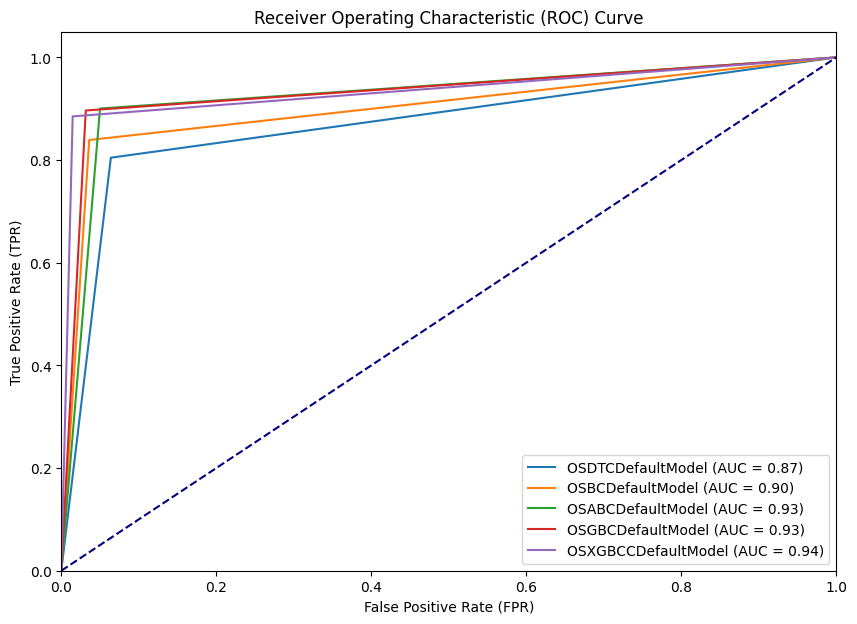

In [90]:
# Use Pipeline() to club scaling, oversampling and model building

OSDefaultModels = []
OSDefaultModelNames = []
OSDefaultModelResults = []

OSDefaultModels.append(("OSDTCDefaultModel", Pipeline([("OSDTCScaler", StandardScaler()), ("OSDTCSmote", SMOTE(sampling_strategy = "auto", k_neighbors = 5, random_state = 1)), ("OSDTCDefault", DecisionTreeClassifier(random_state = 1))])))
OSDefaultModels.append(("OSBCDefaultModel", Pipeline([("OSBCScaler", StandardScaler()), ("OSBCSmote", SMOTE(sampling_strategy = "auto", k_neighbors = 5, random_state = 1)), ("OSBCDefault", BaggingClassifier(random_state = 1))])))
OSDefaultModels.append(("OSABCDefaultModel", Pipeline([("OSABCScaler", StandardScaler()), ("OSABCSmote", SMOTE(sampling_strategy = "auto", k_neighbors = 5, random_state = 1)), ("OSABCDefault", AdaBoostClassifier(random_state = 1))])))
OSDefaultModels.append(("OSGBCDefaultModel", Pipeline([("OSGBCScaler", StandardScaler()), ("OSGBCSmote", SMOTE(sampling_strategy = "auto", k_neighbors = 5, random_state = 1)), ("OSGBCDefault", GradientBoostingClassifier(random_state = 1))])))
OSDefaultModels.append(("OSXGBCCDefaultModel", Pipeline([("OSXGBCScaler", StandardScaler()), ("OSXGBCSmote", SMOTE(sampling_strategy = "auto", k_neighbors = 5, random_state = 1)), ("OSXGBCDefault", XGBClassifier(random_state = 1))])))

# loop through all models to get the mean cross validated score
display(Markdown("**Cross-Validation Performance:**"))

for name, model in OSDefaultModels:
  scoring = ["accuracy", "recall", "precision", "f1"]
  kfold = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 1)
  cv_result = cross_validate(estimator = model, X = XTrain, y = YTrain, scoring = scoring, cv = kfold)
  OSDefaultModelResults.append(cv_result["test_recall"])
  OSDefaultModelNames.append(name)
  display(Markdown("Model Name: {}".format(name)))
  display(Markdown("- Recall: {} Min: {} Max: {} Mean: {}".format(cv_result["test_recall"], cv_result["test_recall"].min(), cv_result["test_recall"].max(), cv_result["test_recall"].mean())))

display(Markdown("**Validation Performance: with Recall Values:**"))
plt.figure(figsize=(10, 7))
for name, model in OSDefaultModels:
  model.fit(XTrain, YTrain)
  YPred = model.predict(XValid)
  accuracy = accuracy_score(YValid, YPred)
  recall = recall_score(YValid, YPred)
  precision = precision_score(YValid, YPred)
  f1 = f1_score(YValid, YPred)
  AllModels.append(ModelPerformanceStats(name, accuracy, recall, precision, f1))
  display(Markdown("- Model Name: {} Recall: {}".format(name, recall)))
  fpr, tpr, thresholds = roc_curve(YValid, YPred)
  roc_auc = auc(fpr, tpr)
  plt.plot(fpr, tpr, label=f"{name} (AUC = {roc_auc:.2f})")

# Plot settings
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')  # Diagonal line for random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

**Observations:**
- We have captured different metrics, however, we will focus on recall at the beginning. If two models return same recall value then we will consider other metrics.
- The better recall values and better AUC are returned by Adaptive Boosting, Gradient Boosting and XGBoosting.
  - Model Name: OSABCDefaultModel Recall Min: 0.8095238095238095 Max: 0.9423076923076923 Mean: 0.880952380952381
  - Model Name: OSGBCDefaultModel Recall Min: 0.7714285714285715 Max: 0.9519230769230769 Mean: 0.8848351648351649
  - Model Name: OSXGBCCDefaultModel Recall Min: 0.780952380952381 Max: 0.9423076923076923 Mean: 0.881941391941392

- The direct Train and Validation method provides better results for Adaptive Boosting, Gradient Boosting and XGBoosting.
  - Model Name: OSABCDefaultModel Recall: 0.9003831417624522
  - Model Name: OSGBCDefaultModel Recall: 0.896551724137931
  - Model Name: OSXGBCCDefaultModel Recall: 0.8850574712643678
- These three can become a better contenders for further tuning with cross validation output.

## <a name = 'link420'> Check and comment on model performance across different metrics <a>

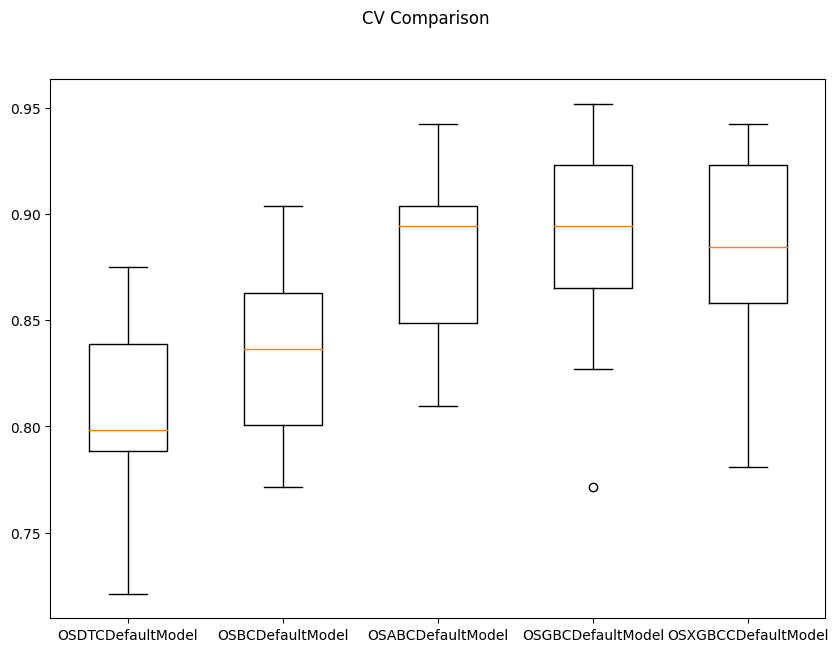

In [91]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure(figsize=(10, 7))

fig.suptitle("CV Comparison")
ax = fig.add_subplot(111)

plt.boxplot(OSDefaultModelResults)
ax.set_xticklabels(OSDefaultModelNames)

plt.show()

**Observations:**
- Adaptive Boosting, Gradient Boosting and XGBoosting models provide higher mode of the vaules.
- We can consider these models to improve while tuning.

# <a name = 'link500'> Model Building - Undersampled data <a>

## <a name = 'link510'> Build 5 models (from decision trees, bagging and boosting methods) <a>

**Cross-Validation Performance:**

Model Name: USDTCDefaultModel

- Recall: [0.81730769 0.93269231 0.90384615 0.88461538 0.90384615 0.88461538
 0.86538462 0.94230769 0.86538462 0.86666667] Min: 0.8173076923076923 Max: 0.9423076923076923 Mean: 0.8866666666666667

Model Name: USBCDefaultModel

- Recall: [0.90384615 0.93269231 0.96153846 0.91346154 0.89423077 0.89423077
 0.875      0.95192308 0.88461538 0.87619048] Min: 0.875 Max: 0.9615384615384616 Mean: 0.9087728937728938

Model Name: USABCDefaultModel

- Recall: [0.93269231 0.96153846 0.98076923 0.96153846 0.92307692 0.92307692
 0.92307692 0.96153846 0.90384615 0.8952381 ] Min: 0.8952380952380953 Max: 0.9807692307692307 Mean: 0.9366391941391943

Model Name: USGBCDefaultModel

- Recall: [0.93269231 0.98076923 1.         0.96153846 0.92307692 0.93269231
 0.94230769 0.99038462 0.90384615 0.86666667] Min: 0.8666666666666667 Max: 1.0 Mean: 0.9433974358974359

Model Name: USXGBCCDefaultModel

- Recall: [0.95192308 0.97115385 0.98076923 0.94230769 0.95192308 0.94230769
 0.91346154 0.99038462 0.89423077 0.87619048] Min: 0.8761904761904762 Max: 0.9903846153846154 Mean: 0.9414652014652015

**Validation Performance: with Recall Values:**

- Model Name: USDTCDefaultModel Recall: 0.9118773946360154

- Model Name: USBCDefaultModel Recall: 0.9386973180076629

- Model Name: USABCDefaultModel Recall: 0.9386973180076629

- Model Name: USGBCDefaultModel Recall: 0.9501915708812261

- Model Name: USXGBCCDefaultModel Recall: 0.9655172413793104

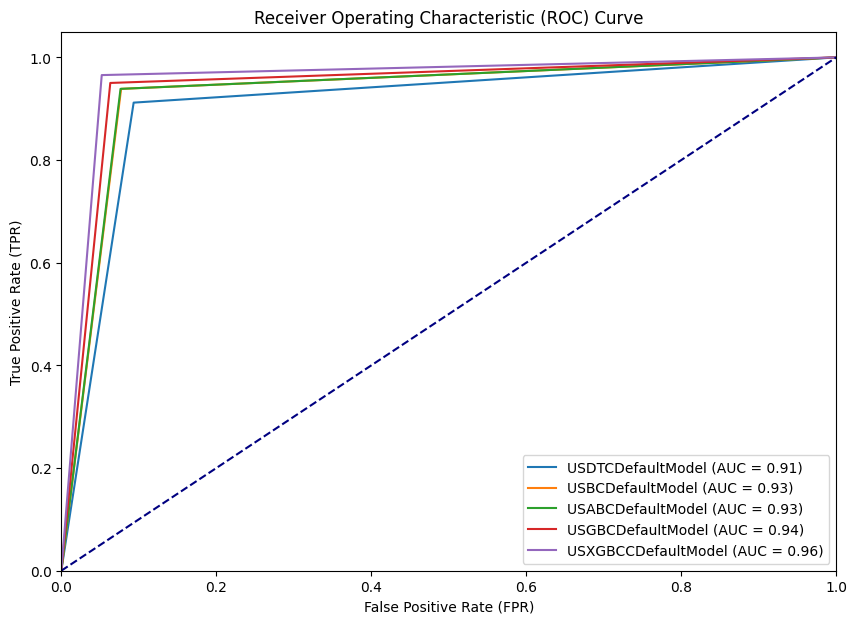

In [92]:
# Use Pipeline() to club scaling, oversampling and model building

USDefaultModels = []
USDefaultModelNames = []
USDefaultModelResults = []

USDefaultModels.append(("USDTCDefaultModel", Pipeline([("USDTCScaler", StandardScaler()), ("USDTCSmote", RandomUnderSampler(sampling_strategy = "auto")), ("USDTCDefault", DecisionTreeClassifier(random_state = 1))])))
USDefaultModels.append(("USBCDefaultModel", Pipeline([("USBCScaler", StandardScaler()), ("USBCSmote", RandomUnderSampler(sampling_strategy = "auto")), ("USBCDefault", BaggingClassifier(random_state = 1))])))
USDefaultModels.append(("USABCDefaultModel", Pipeline([("USABCScaler", StandardScaler()), ("USABCSmote", RandomUnderSampler(sampling_strategy = "auto")), ("USABCDefault", AdaBoostClassifier(random_state = 1))])))
USDefaultModels.append(("USGBCDefaultModel", Pipeline([("USGBCScaler", StandardScaler()), ("USGBCSmote", RandomUnderSampler(sampling_strategy = "auto")), ("USGBCDefault", GradientBoostingClassifier(random_state = 1))])))
USDefaultModels.append(("USXGBCCDefaultModel", Pipeline([("USXGBCScaler", StandardScaler()), ("USXGBCSmote", RandomUnderSampler(sampling_strategy = "auto")), ("USXGBCDefault", XGBClassifier(random_state = 1))])))

# loop through all models to get the mean cross validated score
display(Markdown("**Cross-Validation Performance:**"))

for name, model in USDefaultModels:
  scoring = ["accuracy", "recall", "precision", "f1"]
  kfold = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 1)
  cv_result = cross_validate(estimator = model, X = XTrain, y = YTrain, scoring = scoring, cv = kfold)
  USDefaultModelResults.append(cv_result["test_recall"])
  USDefaultModelNames.append(name)
  display(Markdown("Model Name: {}".format(name)))
  display(Markdown("- Recall: {} Min: {} Max: {} Mean: {}".format(cv_result["test_recall"], cv_result["test_recall"].min(), cv_result["test_recall"].max(), cv_result["test_recall"].mean())))

display(Markdown("**Validation Performance: with Recall Values:**"))
plt.figure(figsize=(10, 7))
for name, model in USDefaultModels:
  model.fit(XTrain, YTrain)
  YPred = model.predict(XValid)
  accuracy = accuracy_score(YValid, YPred)
  recall = recall_score(YValid, YPred)
  precision = precision_score(YValid, YPred)
  f1 = f1_score(YValid, YPred)
  AllModels.append(ModelPerformanceStats(name, accuracy, recall, precision, f1))
  display(Markdown("- Model Name: {} Recall: {}".format(name, recall)))
  fpr, tpr, thresholds = roc_curve(YValid, YPred)
  roc_auc = auc(fpr, tpr)
  plt.plot(fpr, tpr, label=f"{name} (AUC = {roc_auc:.2f})")

# Plot settings
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')  # Diagonal line for random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

**Observations:**
- We have captured different metrics, however, we will focus on recall at the beginning. If two models return same recall value then we will consider other metrics.
- The better recall values and better AUC are returned by Adaptive Boosting, Gradient Boosting and XGBoosting.
  - Model Name: USABCDefaultModel Recall Min: 0.8952380952380953 Max: 0.9807692307692307 Mean: 0.9366391941391943
  - Model Name: USGBCDefaultModel Recall Min: 0.8666666666666667 Max: 1.0 Mean: 0.9433974358974359
  - Model Name: USXGBCCDefaultModel Recall Min: 0.8761904761904762 Max: 0.9903846153846154 Mean: 0.9414652014652015

- The direct Train and Validation method provides better results for Adaptive Boosting, Gradient Boosting and XGBoosting.
  - Model Name: USABCDefaultModel Recall: 0.9386973180076629
  - Model Name: USGBCDefaultModel Recall: 0.9501915708812261
  - Model Name: USXGBCCDefaultModel Recall: 0.9655172413793104
- These three can become a better contenders for further tuning with cross validation output.

## <a name = 'link520'> Check and comment on model performance across different metrics <a>

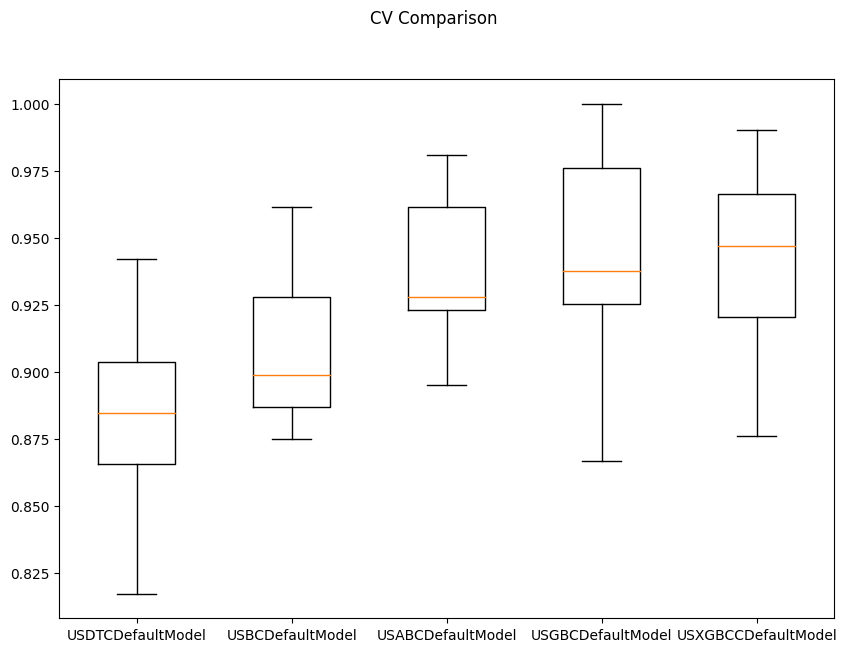

In [93]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure(figsize=(10, 7))

fig.suptitle("CV Comparison")
ax = fig.add_subplot(111)

plt.boxplot(USDefaultModelResults)
ax.set_xticklabels(USDefaultModelNames)

plt.show()

**Observations:**
- Adaptive Boosting, Gradient Boosting and XGBoosting models provide higher mode of the vaules.
- We can consider these models to improve while tuning.

# <a name = 'link600'> Model Performance Improvement using Hyperparameter Tuning <a>

## <a name = 'link610'> Choose 3 models (at least) that might perform better after tuning with proper reasoning <a>

- We are using ADABoost, GradientBoost and XGBoost ans all of the three have given good recall values with good ROC curve.
- Since these models have done well with oversampling and undersampling, we will test the performance of the hypertuned models along with oversampled and undersampled data.
- Here are the Base Recall values that we are planning to improve
- Adaptive Boost
  - Default: Model Name: ABCDefaultModel Recall: 0.842911877394636
  - Over Sampled: Model Name: OSABCDefaultModel Recall: 0.9003831417624522
  - Under Sampled: Model Name: USABCDefaultModel Recall: 0.9386973180076629
- Gradient Boost
  - Default: Model Name: GBCDefaultModel Recall: 0.8697318007662835
  - Over Sampled: Model Name: OSGBCDefaultModel Recall: 0.896551724137931
  - Under Sampled: Model Name: USGBCDefaultModel Recall: 0.9578544061302682
- XGBoost
  - Default: Model Name: XGBCCDefaultModel Recall: 0.8773946360153256
  - Over Sampled: Model Name: OSXGBCCDefaultModel Recall: 0.8850574712643678
  - Under Sampled: Model Name: USXGBCCDefaultModel Recall: 0.9655172413793104

## <a name = 'link620'> Tune the 3 models (at least) chosen <a>

### <a name = 'link621'> Adaptive Boost Hypertuning <a>

In [94]:
# Tune default Adaptive Boost model
ABCTunedModel = Pipeline([("ABCScaler", StandardScaler()), ("ABCTuned", AdaBoostClassifier(base_estimator = DecisionTreeClassifier(), random_state = 1))])  # Set base_estimator explicitly])

# Grid parameters
param_grid = {"ABCTuned__n_estimators": [100, 150, 200], "ABCTuned__learning_rate": [0.01 ,0.1], "ABCTuned__base_estimator__max_depth": [2, 3]}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

# Initialize GridSearchCV
ABCTunedGrid = GridSearchCV(ABCTunedModel, param_grid = param_grid, scoring = scorer, cv = 5)
# Fit the model
ABCTunedGrid.fit(XTrain, YTrain)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('ABCScaler', StandardScaler()),
                                       ('ABCTuned',
                                        AdaBoostClassifier(base_estimator=DecisionTreeClassifier(),
                                                           random_state=1))]),
             param_grid={'ABCTuned__base_estimator__max_depth': [2, 3],
                         'ABCTuned__learning_rate': [0.01, 0.1],
                         'ABCTuned__n_estimators': [100, 150, 200]},
             scoring=make_scorer(recall_score))

In [95]:
# Print the best parameters and score
print("Best parameters found by GridSearchCV:", ABCTunedGrid.best_params_)
print("Best cross-validation score (recall):", ABCTunedGrid.best_score_)

# Construct the model with best estimator
ABCTunedGridBest = ABCTunedGrid.best_estimator_
ABCTunedGridBest.fit(XTrain, YTrain)

Best parameters found by GridSearchCV: {'ABCTuned__base_estimator__max_depth': 3, 'ABCTuned__learning_rate': 0.1, 'ABCTuned__n_estimators': 200}
Best cross-validation score (recall): 0.8665071770334928


Pipeline(steps=[('ABCScaler', StandardScaler()),
                ('ABCTuned',
                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3),
                                    learning_rate=0.1, n_estimators=200,
                                    random_state=1))])

Training performance:


,Accuracy,Recall,Precision,F1
0,0.991512,0.965418,0.981445,0.973366


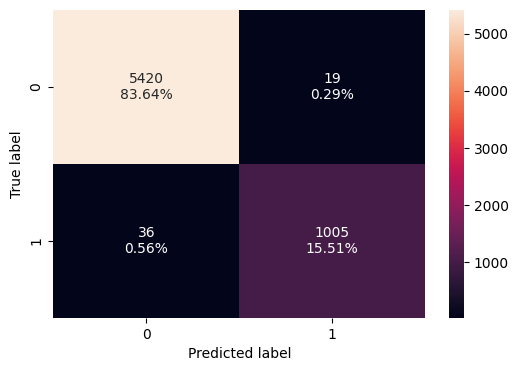

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.97409,0.89272,0.94332,0.917323


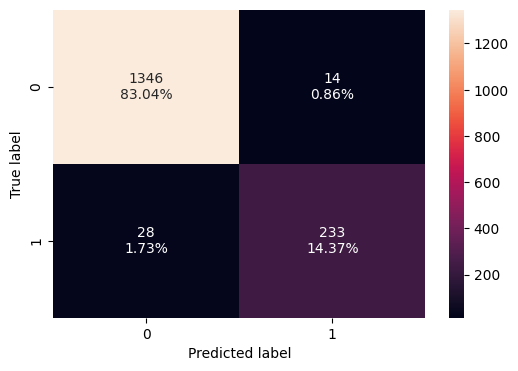

In [96]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(ABCTunedGridBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(ABCTunedGridBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(ABCTunedGridBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(ABCTunedGridBest, XValid, YValid)

tmp = ModelPerformanceMetrics(ABCTunedGridBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("ABCTunedGridBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))


**Observations:**
- Old Adaptive BoostDefault: Model Name: ABCDefaultModel Recall: 0.842911877394636
- New Adaptive Boost Grid: Model Name: ABCTunedGridBest Recall: 0.89272
- There is a gain in the recall performance.

In [97]:
# Tune default Adaptive Boost model
ABCTunedModel = Pipeline([("ABCScaler", StandardScaler()), ("ABCTuned", AdaBoostClassifier(base_estimator = DecisionTreeClassifier(), random_state = 1))])

param_dist = {"ABCTuned__n_estimators": randint(50, 200), "ABCTuned__learning_rate": np.logspace(-2, 0, 10), "ABCTuned__base_estimator__max_depth": randint(2, 4)}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

ABCTunedRandom = RandomizedSearchCV(ABCTunedModel, param_distributions = param_dist, n_iter = 10, cv = 5, scoring = scorer, random_state = 1)

# Fit the model
ABCTunedRandom.fit(XTrain, YTrain)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('ABCScaler', StandardScaler()),
                                             ('ABCTuned',
                                              AdaBoostClassifier(base_estimator=DecisionTreeClassifier(),
                                                                 random_state=1))]),
                   param_distributions={'ABCTuned__base_estimator__max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c327ac400>,
                                        'ABCTuned__learning_rate': array([0.01      , 0.01668101, 0.02782559, 0.04641589, 0.07742637,
       0.12915497, 0.21544347, 0.35938137, 0.59948425, 1.        ]),
                                        'ABCTuned__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c31dcf910>},
                   random_state=1, scoring=make_scorer(recall_score))

In [98]:
# Print the best parameters and best score
print("Best parameters found by RandomizedSearchCV:", ABCTunedRandom.best_params_)
print("Best cross-validation score (recall):", ABCTunedRandom.best_score_)

ABCTunedRandomBest = ABCTunedRandom.best_estimator_
ABCTunedRandomBest.fit(XTrain, YTrain)

Best parameters found by RandomizedSearchCV: {'ABCTuned__base_estimator__max_depth': 2, 'ABCTuned__learning_rate': 0.3593813663804626, 'ABCTuned__n_estimators': 184}
Best cross-validation score (recall): 0.8732425469267575


Pipeline(steps=[('ABCScaler', StandardScaler()),
                ('ABCTuned',
                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=2),
                                    learning_rate=0.3593813663804626,
                                    n_estimators=184, random_state=1))])

Training performance:


,Accuracy,Recall,Precision,F1
0,0.991049,0.965418,0.978578,0.971954


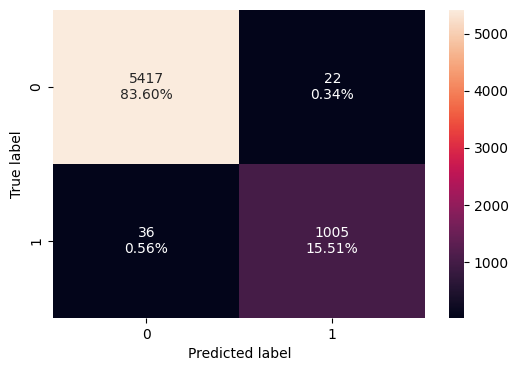

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.97409,0.888889,0.946939,0.916996


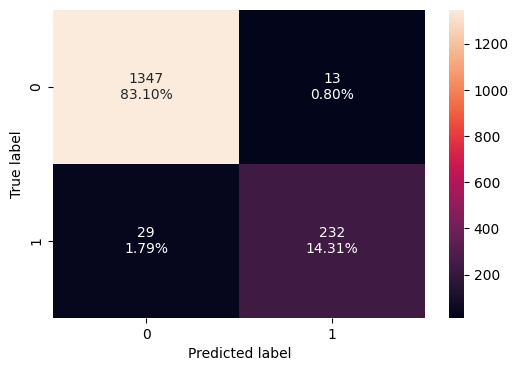

In [99]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(ABCTunedRandomBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(ABCTunedRandomBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(ABCTunedRandomBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(ABCTunedRandomBest, XValid, YValid)

tmp = ModelPerformanceMetrics(ABCTunedRandomBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("ABCTunedRandomBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))

**Observations:**
- Old Adaptive BoostDefault: Model Name: ABCDefaultModel Recall: 0.842911877394636
- New Adaptive Boost Random: Model Name: ABCTunedRandomBest Recall: 0.888889
- There is a gain in the recall performance.

In [100]:
# Tune the Adaptive Boost model for over sampled data
OSABCTunedModel = Pipeline([("OSABCScaler", StandardScaler()), ("OSABCSmote", SMOTE(sampling_strategy = "auto", k_neighbors = 5, random_state = 1)), ("OSABCTuned", AdaBoostClassifier(base_estimator = DecisionTreeClassifier(), random_state = 1))])

# Grid parameters
param_grid = {"OSABCTuned__n_estimators": [100, 150, 200], "OSABCTuned__learning_rate": [0.01 ,0.1], "OSABCTuned__base_estimator__max_depth": [2, 3]
}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

# Initialize GridSearchCV
OSABCTunedGrid = GridSearchCV(OSABCTunedModel, param_grid = param_grid, scoring = scorer, cv = 5)

# Fit the model
OSABCTunedGrid.fit(XTrain, YTrain)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('OSABCScaler', StandardScaler()),
                                       ('OSABCSmote', SMOTE(random_state=1)),
                                       ('OSABCTuned',
                                        AdaBoostClassifier(base_estimator=DecisionTreeClassifier(),
                                                           random_state=1))]),
             param_grid={'OSABCTuned__base_estimator__max_depth': [2, 3],
                         'OSABCTuned__learning_rate': [0.01, 0.1],
                         'OSABCTuned__n_estimators': [100, 150, 200]},
             scoring=make_scorer(recall_score))

In [101]:
# Print the best parameters and score
print("Best parameters found by GridSearchCV:", OSABCTunedGrid.best_params_)
print("Best cross-validation score (recall):", OSABCTunedGrid.best_score_)

# Train a model with the best estimator parameters
OSABCTunedGridBest = OSABCTunedGrid.best_estimator_
OSABCTunedGridBest.fit(XTrain, YTrain)

Best parameters found by GridSearchCV: {'OSABCTuned__base_estimator__max_depth': 3, 'OSABCTuned__learning_rate': 0.01, 'OSABCTuned__n_estimators': 100}
Best cross-validation score (recall): 0.8760627530364372


Pipeline(steps=[('OSABCScaler', StandardScaler()),
                ('OSABCSmote', SMOTE(random_state=1)),
                ('OSABCTuned',
                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3),
                                    learning_rate=0.01, n_estimators=100,
                                    random_state=1))])

Training performance:


,Accuracy,Recall,Precision,F1
0,0.904475,0.888569,0.647759,0.749291


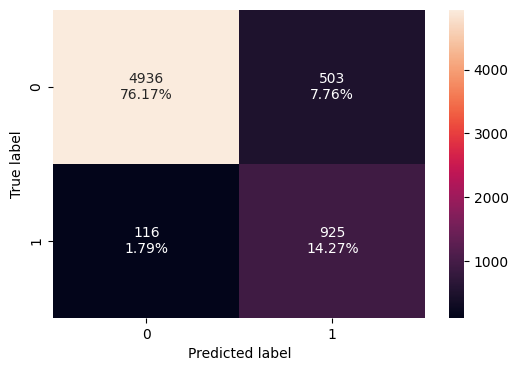

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.916101,0.911877,0.678063,0.777778


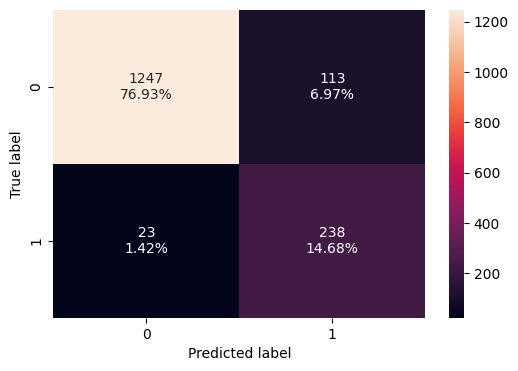

In [102]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(OSABCTunedGridBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(OSABCTunedGridBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(OSABCTunedGridBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(OSABCTunedGridBest, XValid, YValid)

tmp = ModelPerformanceMetrics(OSABCTunedGridBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("OSABCTunedGridBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))

**Observations:**
- Old Adaptive Boost Over Sampled Default: Model Name: OSABCDefaultModel Recall: 0.9003831417624522
- New Adaptive Boost Over Sampled Grid: Model Name: OSABCTunedGridBest Recall: 0.911877
- There is a slight gain after tuning


In [103]:
# Tune the Adaptive Boost model for over sampled data
OSABCTunedModel = Pipeline([("OSABCScaler", StandardScaler()), ("OSABCSmote", SMOTE(sampling_strategy = "auto", k_neighbors = 5, random_state = 1)), ("OSABCTuned", AdaBoostClassifier(base_estimator = DecisionTreeClassifier(), random_state = 1))])

param_dist = {"OSABCTuned__n_estimators": randint(50, 200), "OSABCTuned__learning_rate": np.logspace(-2, 0, 10), "OSABCTuned__base_estimator__max_depth": randint(2, 4)}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

OSABCTunedRandom = RandomizedSearchCV(OSABCTunedModel, param_distributions = param_dist, n_iter = 10, cv = 5, scoring = scorer, random_state = 1)

# Fit the model
OSABCTunedRandom.fit(XTrain, YTrain)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('OSABCScaler', StandardScaler()),
                                             ('OSABCSmote',
                                              SMOTE(random_state=1)),
                                             ('OSABCTuned',
                                              AdaBoostClassifier(base_estimator=DecisionTreeClassifier(),
                                                                 random_state=1))]),
                   param_distributions={'OSABCTuned__base_estimator__max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c32f4b550>,
                                        'OSABCTuned__learning_rate': array([0.01      , 0.01668101, 0.02782559, 0.04641589, 0.07742637,
       0.12915497, 0.21544347, 0.35938137, 0.59948425, 1.        ]),
                                        'OSABCTuned__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c31d48c10>},
                   random_state=1, scoring=make_scorer(recall_score))

In [104]:
# Print the best parameters and best score
print("Best parameters found by RandomizedSearchCV:", OSABCTunedRandom.best_params_)
print("Best cross-validation score (accuracy):", OSABCTunedRandom.best_score_)

OSABCTunedRandomBest = OSABCTunedRandom.best_estimator_
OSABCTunedRandomBest.fit(XTrain, YTrain)

Best parameters found by RandomizedSearchCV: {'OSABCTuned__base_estimator__max_depth': 2, 'OSABCTuned__learning_rate': 0.3593813663804626, 'OSABCTuned__n_estimators': 184}
Best cross-validation score (accuracy): 0.8751656238498345


Pipeline(steps=[('OSABCScaler', StandardScaler()),
                ('OSABCSmote', SMOTE(random_state=1)),
                ('OSABCTuned',
                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=2),
                                    learning_rate=0.3593813663804626,
                                    n_estimators=184, random_state=1))])

Training performance:


,Accuracy,Recall,Precision,F1
0,0.991049,0.966378,0.977648,0.971981


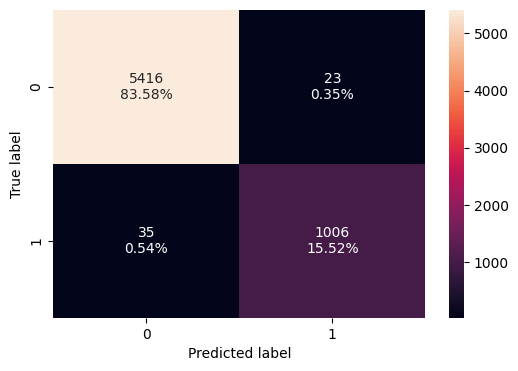

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.977175,0.908046,0.948,0.927593


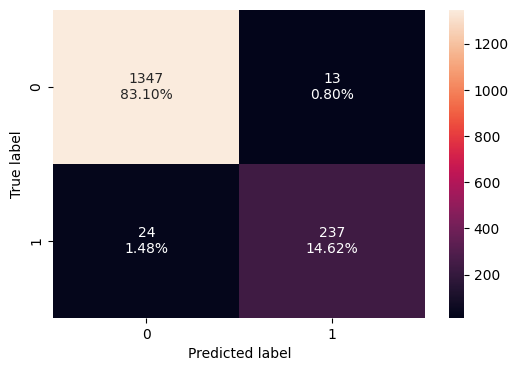

In [105]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(OSABCTunedRandomBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(OSABCTunedRandomBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(OSABCTunedRandomBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(OSABCTunedRandomBest, XValid, YValid)

tmp = ModelPerformanceMetrics(OSABCTunedRandomBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("OSABCTunedRandomBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))

**Observations:**
- Old Adaptive Boost Over Sampled Default: Model Name: OSABCDefaultModel Recall: 0.9003831417624522
- New Adaptive Boost Over Sampled Random: Model Name: OSABCTunedRandomBest Recall: 0.908046
- There is a slight improvement in the performance

In [106]:
# Tune the Adaptive Boost model for under sampled data
USABCTunedModel = Pipeline([("USABCScaler", StandardScaler()), ("USABCSmote", RandomUnderSampler(sampling_strategy = "auto")), ("USABCTuned", AdaBoostClassifier(base_estimator = DecisionTreeClassifier(), random_state = 1))])
# Grid parameters
param_grid = {"USABCTuned__n_estimators": [100, 150, 200], "USABCTuned__learning_rate": [0.01 ,0.1], "USABCTuned__base_estimator__max_depth": [2, 3]
}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

# Initialize GridSearchCV
USABCTunedGrid = GridSearchCV(USABCTunedModel, param_grid = param_grid, scoring = scorer, cv = 5)

# Fit the model
USABCTunedGrid.fit(XTrain, YTrain)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('USABCScaler', StandardScaler()),
                                       ('USABCSmote', RandomUnderSampler()),
                                       ('USABCTuned',
                                        AdaBoostClassifier(base_estimator=DecisionTreeClassifier(),
                                                           random_state=1))]),
             param_grid={'USABCTuned__base_estimator__max_depth': [2, 3],
                         'USABCTuned__learning_rate': [0.01, 0.1],
                         'USABCTuned__n_estimators': [100, 150, 200]},
             scoring=make_scorer(recall_score))

In [107]:
# Print the best parameters and score
print("Best parameters found by GridSearchCV:", USABCTunedGrid.best_params_)
print("Best cross-validation score (recall):", USABCTunedGrid.best_score_)

USABCTunedGridBest = USABCTunedGrid.best_estimator_
USABCTunedGridBest.fit(XTrain, YTrain)

Best parameters found by GridSearchCV: {'USABCTuned__base_estimator__max_depth': 2, 'USABCTuned__learning_rate': 0.1, 'USABCTuned__n_estimators': 200}
Best cross-validation score (recall): 0.9558152373941848


Pipeline(steps=[('USABCScaler', StandardScaler()),
                ('USABCSmote', RandomUnderSampler()),
                ('USABCTuned',
                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=2),
                                    learning_rate=0.1, n_estimators=200,
                                    random_state=1))])

Training performance:


,Accuracy,Recall,Precision,F1
0,0.946451,0.98367,0.756278,0.855115


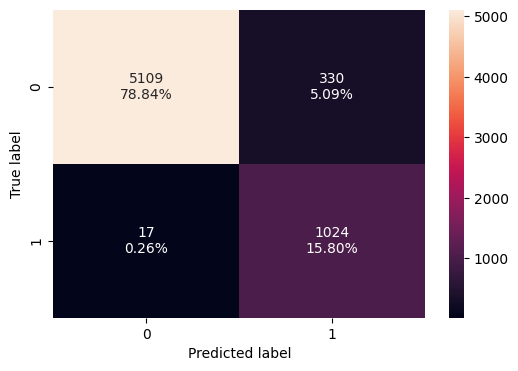

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.946329,0.97318,0.760479,0.853782


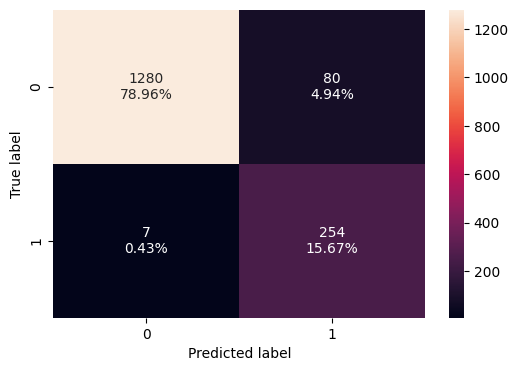

In [108]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(USABCTunedGridBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(USABCTunedGridBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(USABCTunedGridBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(USABCTunedGridBest, XValid, YValid)

tmp = ModelPerformanceMetrics(USABCTunedGridBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("USABCTunedGridBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))

**Observations:**
- Old Adaptive Boost Under Sampled Default: Model Name: USABCDefaultModel Recall: 0.9386973180076629
- New Adaptive Boost Under Sampled Grid: Model Name: USABCTunedGridBest Recall: 0.97318
- There is slight improvement in the performance which is already is the maximum

In [109]:
# Tune the Adaptive Boost model for under sampled data
USABCTunedModel = Pipeline([("USABCScaler", StandardScaler()), ("USABCSmote", RandomUnderSampler(sampling_strategy = "auto")), ("USABCTuned", AdaBoostClassifier(base_estimator = DecisionTreeClassifier(), random_state = 1))])

param_dist = {"USABCTuned__n_estimators": randint(50, 200), "USABCTuned__learning_rate": np.logspace(-2, 0, 10), "USABCTuned__base_estimator__max_depth": randint(2, 4)}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

USABCTunedRandom = RandomizedSearchCV(USABCTunedModel, param_distributions = param_dist, n_iter = 10, cv = 5, scoring = scorer, random_state = 1)

# Fit the model
USABCTunedRandom.fit(XTrain, YTrain)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('USABCScaler', StandardScaler()),
                                             ('USABCSmote',
                                              RandomUnderSampler()),
                                             ('USABCTuned',
                                              AdaBoostClassifier(base_estimator=DecisionTreeClassifier(),
                                                                 random_state=1))]),
                   param_distributions={'USABCTuned__base_estimator__max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c3120d000>,
                                        'USABCTuned__learning_rate': array([0.01      , 0.01668101, 0.02782559, 0.04641589, 0.07742637,
       0.12915497, 0.21544347, 0.35938137, 0.59948425, 1.        ]),
                                        'USABCTuned__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c31084310>},
                   random_state=1, scoring=make_scorer(recall_score))

In [110]:
# Print the best parameters and best score
print("Best parameters found by RandomizedSearchCV:", USABCTunedRandom.best_params_)
print("Best cross-validation score (accuracy):", USABCTunedRandom.best_score_)

USABCTunedRandomBest = USABCTunedRandom.best_estimator_
USABCTunedRandomBest.fit(XTrain, YTrain)

Best parameters found by RandomizedSearchCV: {'USABCTuned__base_estimator__max_depth': 3, 'USABCTuned__learning_rate': 0.5994842503189409, 'USABCTuned__n_estimators': 187}
Best cross-validation score (accuracy): 0.9519874861980124


Pipeline(steps=[('USABCScaler', StandardScaler()),
                ('USABCSmote', RandomUnderSampler()),
                ('USABCTuned',
                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3),
                                    learning_rate=0.5994842503189409,
                                    n_estimators=187, random_state=1))])

Training performance:


,Accuracy,Recall,Precision,F1
0,0.956019,1.0,0.785068,0.879594


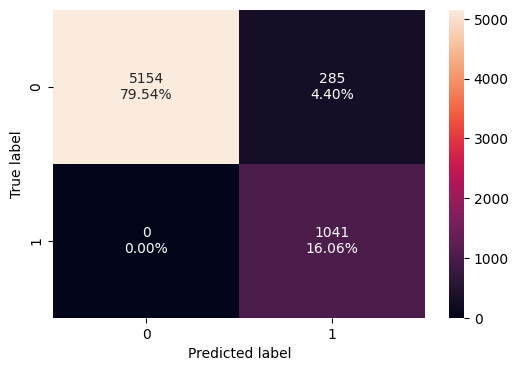

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.944479,0.94636,0.764706,0.84589


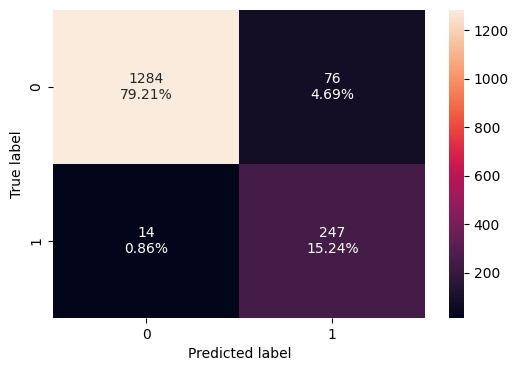

In [111]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(USABCTunedRandomBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(USABCTunedRandomBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(USABCTunedRandomBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(USABCTunedRandomBest, XValid, YValid)

tmp = ModelPerformanceMetrics(USABCTunedRandomBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("USABCTunedRandomBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))

**Observations:**
- Old Adaptive Boost Under Sampled Default: Model Name: USABCDefaultModel Recall: 0.9386973180076629
- New Adaptive Boost Under Sampled Random: Model Name: USABCTunedRandomBest Recall: 0.94636
- There is a slight increase in the recall performance

### <a name = 'link622'> Gradient Boosting Hypertuning <a>

In [112]:
# Tune the Gradient Boost model
GBCTunedModel = Pipeline([("GBCScaler", StandardScaler()), ("GBCTuned", GradientBoostingClassifier(random_state = 1))])

param_grid = {"GBCTuned__n_estimators": [50, 150], "GBCTuned__learning_rate": [0.01, 0.5], "GBCTuned__max_depth": [4, 5], "GBCTuned__subsample": [0.6, 0.8]}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

GBCTunedGrid = GridSearchCV(GBCTunedModel, param_grid = param_grid, cv = 5, scoring = scorer, n_jobs = -1)

GBCTunedGrid.fit(XTrain, YTrain)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('GBCScaler', StandardScaler()),
                                       ('GBCTuned',
                                        GradientBoostingClassifier(random_state=1))]),
             n_jobs=-1,
             param_grid={'GBCTuned__learning_rate': [0.01, 0.5],
                         'GBCTuned__max_depth': [4, 5],
                         'GBCTuned__n_estimators': [50, 150],
                         'GBCTuned__subsample': [0.6, 0.8]},
             scoring=make_scorer(recall_score))

In [113]:
# Print the best parameters and score for GridSearchCV
print("Best parameters found by GridSearchCV:", GBCTunedGrid.best_params_)
print("Best cross-validation score (recall):", GBCTunedGrid.best_score_)

#Get the model with best estimator
GBCTunedGridBest = GBCTunedGrid.best_estimator_
GBCTunedGridBest.fit(XTrain, YTrain)

Best parameters found by GridSearchCV: {'GBCTuned__learning_rate': 0.5, 'GBCTuned__max_depth': 4, 'GBCTuned__n_estimators': 150, 'GBCTuned__subsample': 0.8}
Best cross-validation score (recall): 0.8588194700036805


Pipeline(steps=[('GBCScaler', StandardScaler()),
                ('GBCTuned',
                 GradientBoostingClassifier(learning_rate=0.5, max_depth=4,
                                            n_estimators=150, random_state=1,
                                            subsample=0.8))])

Training performance:


,Accuracy,Recall,Precision,F1
0,1.0,1.0,1.0,1.0


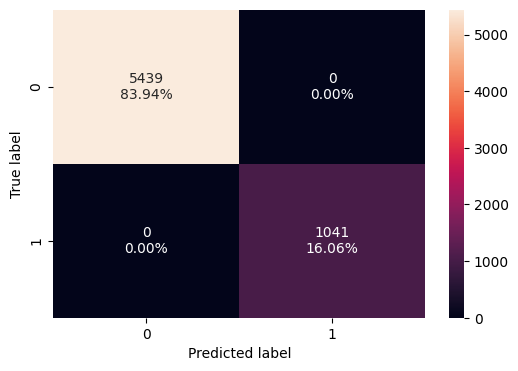

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.969772,0.877395,0.930894,0.903353


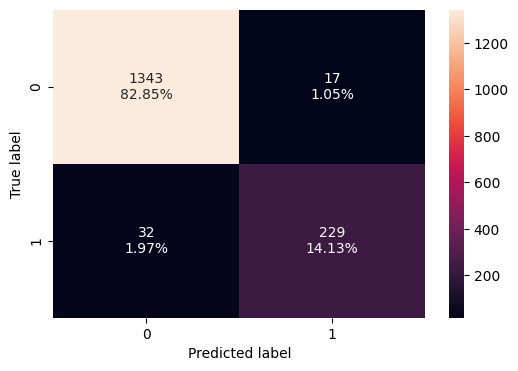

In [114]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(GBCTunedGridBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(GBCTunedGridBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(GBCTunedGridBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(GBCTunedGridBest, XValid, YValid)

tmp = ModelPerformanceMetrics(GBCTunedGridBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("GBCTunedGridBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))

**Observations:**
- Old Gradient Boost Default: Model Name: GBCDefaultModel Recall: 0.8697318007662835
- New Gradient Boost Grid: Model Name: GBCTunedGridBest Recall: 0.877395
- There is a slight gain in th recall performance

In [115]:
# Tune the Gradient Boost model
GBCTunedModel = Pipeline([("GBCScaler", StandardScaler()), ("GBCTuned", GradientBoostingClassifier(random_state = 1))])

param_dist = {"GBCTuned__n_estimators": randint(50, 200), "GBCTuned__learning_rate": np.logspace(-3, 0, 10), "GBCTuned__max_depth": randint(2, 6), "GBCTuned__subsample": [0.6, 0.8, 1.0]}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

# 5b. Run RandomizedSearchCV
GBCTunedRandom = RandomizedSearchCV(GBCTunedModel, param_distributions = param_dist, n_iter = 10, cv = 5, scoring = scorer, random_state = 1, n_jobs=-1)
GBCTunedRandom.fit(XTrain, YTrain)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('GBCScaler', StandardScaler()),
                                             ('GBCTuned',
                                              GradientBoostingClassifier(random_state=1))]),
                   n_jobs=-1,
                   param_distributions={'GBCTuned__learning_rate': array([0.001     , 0.00215443, 0.00464159, 0.01      , 0.02154435,
       0.04641589, 0.1       , 0.21544347, 0.46415888, 1.        ]),
                                        'GBCTuned__max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c3110dab0>,
                                        'GBCTuned__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c31102aa0>,
                                        'GBCTuned__subsample': [0.6, 0.8, 1.0]},
                   random_state=1, scoring=make_scorer(recall_score))

In [116]:
# Print the best parameters and score for RandomizedSearchCV
print("Best parameters found by RandomizedSearchCV:", GBCTunedRandom.best_params_)
print("Best cross-validation score (accuracy):", GBCTunedRandom.best_score_)

GBCTunedRandomBest = GBCTunedRandom.best_estimator_
GBCTunedRandomBest.fit(XTrain, YTrain)

Best parameters found by RandomizedSearchCV: {'GBCTuned__learning_rate': 0.046415888336127774, 'GBCTuned__max_depth': 5, 'GBCTuned__n_estimators': 190, 'GBCTuned__subsample': 0.6}
Best cross-validation score (accuracy): 0.8530456385719543


Pipeline(steps=[('GBCScaler', StandardScaler()),
                ('GBCTuned',
                 GradientBoostingClassifier(learning_rate=0.046415888336127774,
                                            max_depth=5, n_estimators=190,
                                            random_state=1, subsample=0.6))])

Training performance:


,Accuracy,Recall,Precision,F1
0,0.99213,0.963497,0.987205,0.975207


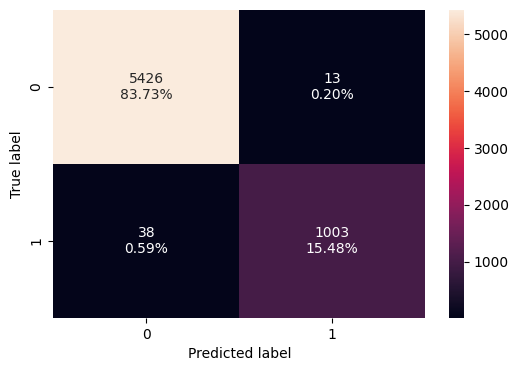

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.972856,0.89272,0.935743,0.913725


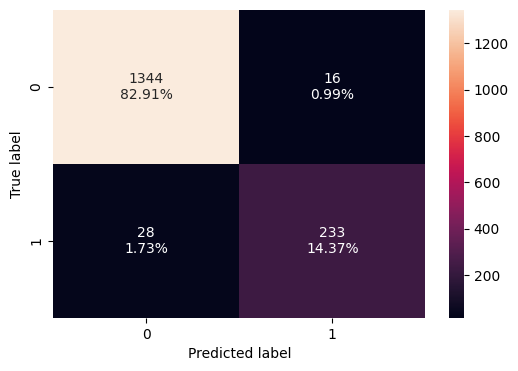

In [117]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(GBCTunedRandomBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(GBCTunedRandomBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(GBCTunedRandomBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(GBCTunedRandomBest, XValid, YValid)

tmp = ModelPerformanceMetrics(GBCTunedRandomBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("GBCTunedRandomBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))

**Observations:**
- Old Gradient Boost Default: Model Name: GBCDefaultModel Recall: 0.8697318007662835
- New Gradian Boost Random: Model Name: GBCTunedRandomBest Recall: 0.89272
- There is a good improvement.

In [118]:
# Tune the Gradient Boost Algorithm with over sampled data
OSGBCTunedModel = Pipeline([("OSGBCScaler", StandardScaler()), ("OSGBCSmote", SMOTE(sampling_strategy = "auto", k_neighbors = 5, random_state = 1)), ("OSGBCTuned", GradientBoostingClassifier(random_state = 1))])

param_grid = {"OSGBCTuned__n_estimators": [50, 150], "OSGBCTuned__learning_rate": [0.01, 0.5], "OSGBCTuned__max_depth": [4, 5], "OSGBCTuned__subsample": [0.6, 0.8]}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

OSGBCTunedGrid = GridSearchCV(OSGBCTunedModel, param_grid = param_grid, cv = 5, scoring = scorer, n_jobs = -1)

OSGBCTunedGrid.fit(XTrain, YTrain)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('OSGBCScaler', StandardScaler()),
                                       ('OSGBCSmote', SMOTE(random_state=1)),
                                       ('OSGBCTuned',
                                        GradientBoostingClassifier(random_state=1))]),
             n_jobs=-1,
             param_grid={'OSGBCTuned__learning_rate': [0.01, 0.5],
                         'OSGBCTuned__max_depth': [4, 5],
                         'OSGBCTuned__n_estimators': [50, 150],
                         'OSGBCTuned__subsample': [0.6, 0.8]},
             scoring=make_scorer(recall_score))

In [119]:
# Print the best parameters and score for GridSearchCV
print("Best parameters found by GridSearchCV:", OSGBCTunedGrid.best_params_)
print("Best cross-validation score (recall):", OSGBCTunedGrid.best_score_)

#Tune the model with best estimator
OSGBCTunedGridBest = OSGBCTunedGrid.best_estimator_
OSGBCTunedGridBest.fit(XTrain, YTrain)

Best parameters found by GridSearchCV: {'OSGBCTuned__learning_rate': 0.01, 'OSGBCTuned__max_depth': 4, 'OSGBCTuned__n_estimators': 150, 'OSGBCTuned__subsample': 0.6}
Best cross-validation score (recall): 0.9029812292970189


Pipeline(steps=[('OSGBCScaler', StandardScaler()),
                ('OSGBCSmote', SMOTE(random_state=1)),
                ('OSGBCTuned',
                 GradientBoostingClassifier(learning_rate=0.01, max_depth=4,
                                            n_estimators=150, random_state=1,
                                            subsample=0.6))])

Training performance:


,Accuracy,Recall,Precision,F1
0,0.927623,0.914505,0.714715,0.80236


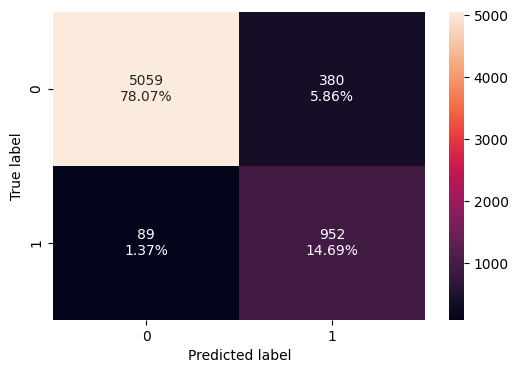

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.924121,0.904215,0.706587,0.793277


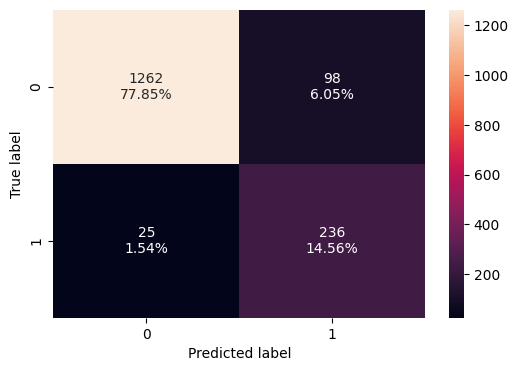

In [120]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(OSGBCTunedGridBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(OSGBCTunedGridBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(OSGBCTunedGridBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(OSGBCTunedGridBest, XValid, YValid)

tmp = ModelPerformanceMetrics(OSGBCTunedGridBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("OSGBCTunedGridBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))

**Observations:**
- Old Gradient Boost Over Sampled Default: Model Name: OSGBCDefaultModel Recall: 0.896551724137931
- New Gradient Boost Over Sampled Grid: Model Name: OSGBCTunedGridBest Recall: 0.904215
- There is a slight improvement in the performance.

In [121]:
# Tune the Gradient Boost Algorithm with over sampled data
OSGBCTunedModel = Pipeline([("OSGBCScaler", StandardScaler()), ("OSGBCSmote", SMOTE(sampling_strategy = "auto", k_neighbors = 5, random_state = 1)), ("OSGBCTuned", GradientBoostingClassifier(random_state = 1))])

param_dist = {"OSGBCTuned__n_estimators": randint(50, 200), "OSGBCTuned__learning_rate": np.logspace(-3, 0, 10), "OSGBCTuned__max_depth": randint(2, 6), "OSGBCTuned__subsample": [0.6, 0.8, 1.0]}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

# 5b. Run RandomizedSearchCV
OSGBCTunedRandom = RandomizedSearchCV(OSGBCTunedModel, param_distributions = param_dist, n_iter = 10, cv = 5, scoring = scorer, random_state = 1, n_jobs=-1)
OSGBCTunedRandom.fit(XTrain, YTrain)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('OSGBCScaler', StandardScaler()),
                                             ('OSGBCSmote',
                                              SMOTE(random_state=1)),
                                             ('OSGBCTuned',
                                              GradientBoostingClassifier(random_state=1))]),
                   n_jobs=-1,
                   param_distributions={'OSGBCTuned__learning_rate': array([0.001     , 0.00215443, 0.00464159, 0.01      , 0.02154435,
       0.04641589, 0.1       , 0.21544347, 0.46415888, 1.        ]),
                                        'OSGBCTuned__max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c30492170>,
                                        'OSGBCTuned__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c2fc32ef0>,
                                        'OSGBCTuned__subsample': [0.6, 0.8,
                                                                  1.0]},
                   random_state=1, scoring=make_scorer(recall_score))

In [122]:
# Print the best parameters and score for RandomizedSearchCV
print("Best parameters found by RandomizedSearchCV:", OSGBCTunedRandom.best_params_)
print("Best cross-validation score (accuracy):", OSGBCTunedRandom.best_score_)

OSGBCTunedRandomBest = OSGBCTunedRandom.best_estimator_
OSGBCTunedRandomBest.fit(XTrain, YTrain)

Best parameters found by RandomizedSearchCV: {'OSGBCTuned__learning_rate': 0.046415888336127774, 'OSGBCTuned__max_depth': 5, 'OSGBCTuned__n_estimators': 190, 'OSGBCTuned__subsample': 0.6}
Best cross-validation score (accuracy): 0.8962596613912404


Pipeline(steps=[('OSGBCScaler', StandardScaler()),
                ('OSGBCSmote', SMOTE(random_state=1)),
                ('OSGBCTuned',
                 GradientBoostingClassifier(learning_rate=0.046415888336127774,
                                            max_depth=5, n_estimators=190,
                                            random_state=1, subsample=0.6))])

Training performance:


,Accuracy,Recall,Precision,F1
0,0.98642,0.967339,0.949105,0.958135


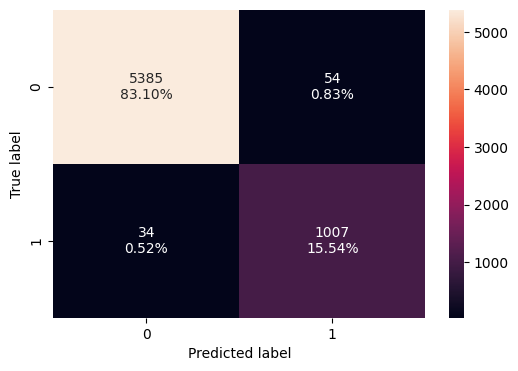

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.960518,0.904215,0.858182,0.880597


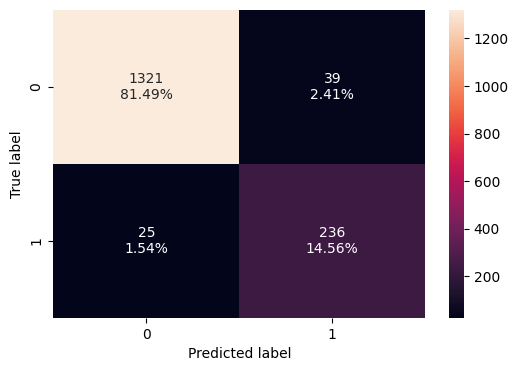

In [123]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(OSGBCTunedRandomBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(OSGBCTunedRandomBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(OSGBCTunedRandomBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(OSGBCTunedRandomBest, XValid, YValid)

tmp = ModelPerformanceMetrics(OSGBCTunedRandomBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("OSGBCTunedRandomBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))

**Observations:**
- Old Gradient Boost Over Sampled Default: Model Name: OSGBCDefaultModel Recall: 0.896551724137931
- New Gradient Boost Over Sampled Random: Model Name: OSGBCTunedRandomBest Recall: 0.904215
- There is a slight improvement in the performance after tuning.

In [124]:
# Tune the Gradient Boost Algorithm with under sampled data
USGBCTunedModel = Pipeline([("USGBCScaler", StandardScaler()), ("USGBCSmote", RandomUnderSampler(sampling_strategy = "auto")), ("USGBCTuned", GradientBoostingClassifier(random_state = 1))])

param_grid = {"USGBCTuned__n_estimators": [50, 150], "USGBCTuned__learning_rate": [0.01, 0.5], "USGBCTuned__max_depth": [4, 5], "USGBCTuned__subsample": [0.6, 0.8]}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

USGBCTunedGrid = GridSearchCV(USGBCTunedModel, param_grid = param_grid, cv = 5, scoring = scorer, n_jobs = -1)

USGBCTunedGrid.fit(XTrain, YTrain)


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('USGBCScaler', StandardScaler()),
                                       ('USGBCSmote', RandomUnderSampler()),
                                       ('USGBCTuned',
                                        GradientBoostingClassifier(random_state=1))]),
             n_jobs=-1,
             param_grid={'USGBCTuned__learning_rate': [0.01, 0.5],
                         'USGBCTuned__max_depth': [4, 5],
                         'USGBCTuned__n_estimators': [50, 150],
                         'USGBCTuned__subsample': [0.6, 0.8]},
             scoring=make_scorer(recall_score))

In [125]:
# Print the best parameters and score for GridSearchCV
print("Best parameters found by GridSearchCV:", USGBCTunedGrid.best_params_)
print("Best cross-validation score (recall):", USGBCTunedGrid.best_score_)

USGBCTunedGridBest = USGBCTunedGrid.best_estimator_
USGBCTunedGridBest.fit(XTrain, YTrain)

Best parameters found by GridSearchCV: {'USGBCTuned__learning_rate': 0.5, 'USGBCTuned__max_depth': 4, 'USGBCTuned__n_estimators': 150, 'USGBCTuned__subsample': 0.8}
Best cross-validation score (recall): 0.9510213470739787


Pipeline(steps=[('USGBCScaler', StandardScaler()),
                ('USGBCSmote', RandomUnderSampler()),
                ('USGBCTuned',
                 GradientBoostingClassifier(learning_rate=0.5, max_depth=4,
                                            n_estimators=150, random_state=1,
                                            subsample=0.8))])

Training performance:


,Accuracy,Recall,Precision,F1
0,0.960031,1.0,0.800769,0.889364


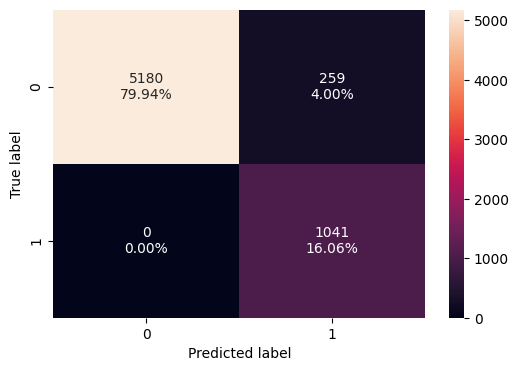

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.948797,0.954023,0.778125,0.857143


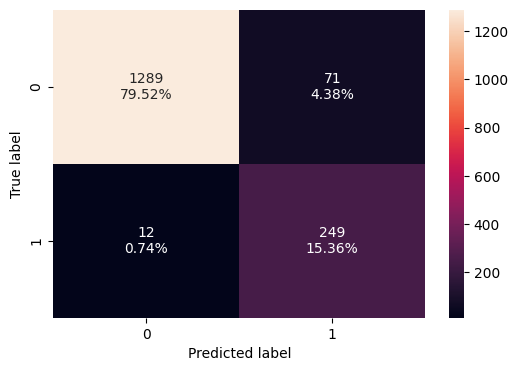

In [126]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(USGBCTunedGridBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(USGBCTunedGridBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(USGBCTunedGridBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(USGBCTunedGridBest, XValid, YValid)

tmp = ModelPerformanceMetrics(USGBCTunedGridBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("USGBCTunedGridBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))

**Observations:**
- Old Gradient Boost Under Sampled Default: Model Name: USGBCDefaultModel Recall: 0.9578544061302682
- New Gradient Boost Under Sampled Grid: Model Name: USGBCTunedGridBest Recall: 0.954023
- There is a good improvement in the performance of the recall.


In [127]:
USGBCTunedModel = Pipeline([("USGBCScaler", StandardScaler()), ("USGBCSmote", RandomUnderSampler(sampling_strategy = "auto")), ("USGBCTuned", GradientBoostingClassifier(random_state = 1))])

param_dist = {"USGBCTuned__n_estimators": randint(50, 200), "USGBCTuned__learning_rate": np.logspace(-3, 0, 10), "USGBCTuned__max_depth": randint(2, 6), "USGBCTuned__subsample": [0.6, 0.8, 1.0]}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

# 5b. Run RandomizedSearchCV
USGBCTunedRandom = RandomizedSearchCV(USGBCTunedModel, param_distributions = param_dist, n_iter = 10, cv = 5, scoring = scorer, random_state = 1, n_jobs=-1)
USGBCTunedRandom.fit(XTrain, YTrain)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('USGBCScaler', StandardScaler()),
                                             ('USGBCSmote',
                                              RandomUnderSampler()),
                                             ('USGBCTuned',
                                              GradientBoostingClassifier(random_state=1))]),
                   n_jobs=-1,
                   param_distributions={'USGBCTuned__learning_rate': array([0.001     , 0.00215443, 0.00464159, 0.01      , 0.02154435,
       0.04641589, 0.1       , 0.21544347, 0.46415888, 1.        ]),
                                        'USGBCTuned__max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c2fc30b80>,
                                        'USGBCTuned__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c2f9ab3d0>,
                                        'USGBCTuned__subsample': [0.6, 0.8,
                                                                  1.0]},
                   random_state=1, scoring=make_scorer(recall_score))

In [128]:
# Print the best parameters and score for RandomizedSearchCV
print("Best parameters found by RandomizedSearchCV:", USGBCTunedRandom.best_params_)
print("Best cross-validation score (accuracy):", USGBCTunedRandom.best_score_)

USGBCTunedRandomBest = USGBCTunedRandom.best_estimator_
USGBCTunedRandomBest.fit(XTrain, YTrain)

Best parameters found by RandomizedSearchCV: {'USGBCTuned__learning_rate': 0.046415888336127774, 'USGBCTuned__max_depth': 5, 'USGBCTuned__n_estimators': 190, 'USGBCTuned__subsample': 0.6}
Best cross-validation score (accuracy): 0.9548444976076554


Pipeline(steps=[('USGBCScaler', StandardScaler()),
                ('USGBCSmote', RandomUnderSampler()),
                ('USGBCTuned',
                 GradientBoostingClassifier(learning_rate=0.046415888336127774,
                                            max_depth=5, n_estimators=190,
                                            random_state=1, subsample=0.6))])

Training performance:


,Accuracy,Recall,Precision,F1
0,0.955401,1.0,0.782707,0.878111


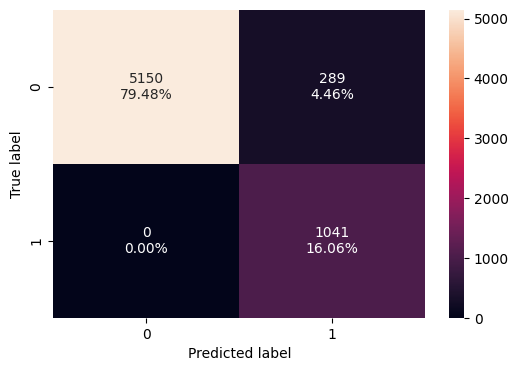

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.950031,0.961686,0.779503,0.861063


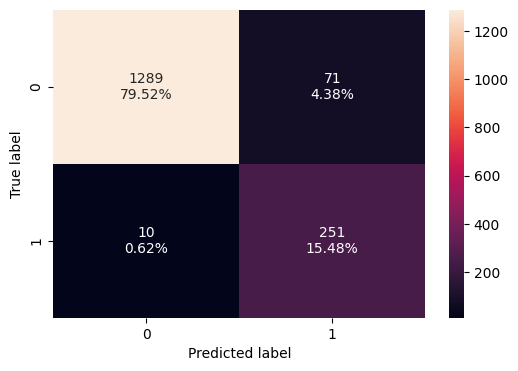

In [129]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(USGBCTunedRandomBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(USGBCTunedRandomBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(USGBCTunedRandomBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(USGBCTunedRandomBest, XValid, YValid)

tmp = ModelPerformanceMetrics(USGBCTunedRandomBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("USGBCTunedRandomBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))

**Observations:**
- Old Gradient Boost Under Sampled Default: Model Name: USGBCDefaultModel Recall: 0.9578544061302682
- New Gradient Boost Under Sampled Random: Model Name: USGBCTunedRandomBest Recall: 0.961686
- There is a slight improvement in the recall

### <a name = 'link623'> XGBoost Hypertuning <a>

In [130]:
# Tune XGBoost Model
XGBCTunedModel = Pipeline([("XGBCScaler", StandardScaler()), ("XGBCTuned", XGBClassifier(random_state = 1))])

# Define hyperparameter grid for GridSearchCV
param_grid = {"XGBCTuned__n_estimators": [50, 100, 200], "XGBCTuned__learning_rate": [0.01, 0.1, 0.3], "XGBCTuned__max_depth": [3, 5, 7], "XGBCTuned__subsample": [0.6, 0.8, 1.0]}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

# Initialize GridSearchCV
XGBTunedGrid = GridSearchCV(XGBCTunedModel, param_grid = param_grid, cv=5, scoring = scorer, n_jobs = -1)

# Fit the model
XGBTunedGrid.fit(XTrain, YTrain)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('XGBCScaler', StandardScaler()),
                                       ('XGBCTuned',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      callbacks=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      device=None,
                                                      early_stopping_rounds=None,
                                                      enable_categorical=False,
                                                      eval_metric=None,
                                                      feature_types=None,
                                                      gamma=None,
                                                      grow_policy=None,
                                                      importan...
                                                      min_child_weight=None,
                                                      missing=nan,
                                                      monotone_constraints=None,
                                                      multi_strategy=None,
                                                      n_estimators=None,
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      random_state=1, ...))]),
             n_jobs=-1,
             param_grid={'XGBCTuned__learning_rate': [0.01, 0.1, 0.3],
                         'XGBCTuned__max_depth': [3, 5, 7],
                         'XGBCTuned__n_estimators': [50, 100, 200],
                         'XGBCTuned__subsample': [0.6, 0.8, 1.0]},
             scoring=make_scorer(recall_score))

In [131]:

# Print the best parameters and score for GridSearchCV
print("Best parameters found by GridSearchCV:", XGBTunedGrid.best_params_)
print("Best cross-validation score (recall):", XGBTunedGrid.best_score_)

XGBTunedGridBest = XGBTunedGrid.best_estimator_
XGBTunedGridBest.fit(XTrain, YTrain)

Best parameters found by GridSearchCV: {'XGBCTuned__learning_rate': 0.1, 'XGBCTuned__max_depth': 7, 'XGBCTuned__n_estimators': 200, 'XGBCTuned__subsample': 1.0}
Best cross-validation score (recall): 0.8789887743835113


Pipeline(steps=[('XGBCScaler', StandardScaler()),
                ('XGBCTuned',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=7, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=200, n_jobs=None,
                               num_parallel_tree=None, random_state=1, ...))])

Training performance:


,Accuracy,Recall,Precision,F1
0,1.0,1.0,1.0,1.0


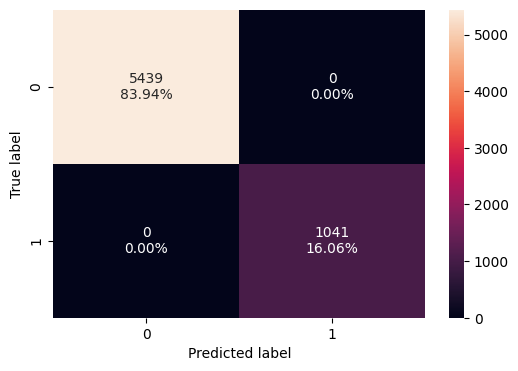

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.966687,0.877395,0.912351,0.894531


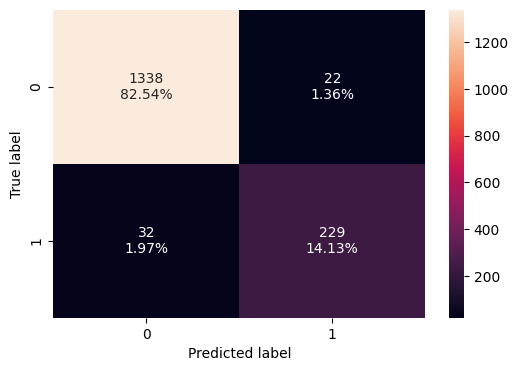

In [132]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(XGBTunedGridBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(XGBTunedGridBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(XGBTunedGridBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(XGBTunedGridBest, XValid, YValid)

tmp = ModelPerformanceMetrics(XGBTunedGridBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("XGBTunedGridBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))

**Observations:**
- Old XGBoost Default: Model Name: XGBCCDefaultModel Recall: 0.8773946360153256
- New XGBoost Grid: Model Name: XGBTunedGridBest Recall: 0.877395
- There is no improvement with the tuning parameters.

In [133]:
# Tune XGBoost Model
XGBCTunedModel = Pipeline([("XGBCScaler", StandardScaler()), ("XGBCTuned", XGBClassifier(random_state = 1))])

param_dist = {"XGBCTuned__n_estimators": randint(50, 200), "XGBCTuned__learning_rate": np.logspace(-3, 0, 10),  "XGBCTuned__max_depth": randint(3, 10), "XGBCTuned__subsample": [0.6, 0.8, 1.0], "XGBCTuned__colsample_bytree": [0.6, 0.8, 1.0]}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

# Initialize RandomizedSearchCV
XGBCTunedRandom = RandomizedSearchCV(XGBCTunedModel, param_distributions = param_dist, n_iter = 10, cv = 5, scoring = scorer, random_state = 1, n_jobs = -1)

# Fit the model
XGBCTunedRandom.fit(XTrain, YTrain)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('XGBCScaler', StandardScaler()),
                                             ('XGBCTuned',
                                              XGBClassifier(base_score=None,
                                                            booster=None,
                                                            callbacks=None,
                                                            colsample_bylevel=None,
                                                            colsample_bynode=None,
                                                            colsample_bytree=None,
                                                            device=None,
                                                            early_stopping_rounds=None,
                                                            enable_categorical=False,
                                                            eval_metric=None,
                                                            feature_types=None,
                                                            gamma=None,
                                                            grow_policy=None,
                                                            im...
                                        'XGBCTuned__learning_rate': array([0.001     , 0.00215443, 0.00464159, 0.01      , 0.02154435,
       0.04641589, 0.1       , 0.21544347, 0.46415888, 1.        ]),
                                        'XGBCTuned__max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c2f95a230>,
                                        'XGBCTuned__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c2f9abcd0>,
                                        'XGBCTuned__subsample': [0.6, 0.8,
                                                                 1.0]},
                   random_state=1, scoring=make_scorer(recall_score))

In [134]:
# Print the best parameters and score for RandomizedSearchCV
print("Best parameters found by RandomizedSearchCV:", XGBCTunedRandom.best_params_)
print("Best cross-validation score (recall):", XGBCTunedRandom.best_score_)

XGBCTunedRandomBest = XGBCTunedRandom.best_estimator_
XGBCTunedRandomBest.fit(XTrain, YTrain)

Best parameters found by RandomizedSearchCV: {'XGBCTuned__colsample_bytree': 0.8, 'XGBCTuned__learning_rate': 0.46415888336127775, 'XGBCTuned__max_depth': 3, 'XGBCTuned__n_estimators': 191, 'XGBCTuned__subsample': 1.0}
Best cross-validation score (recall): 0.8741764814133235


Pipeline(steps=[('XGBCScaler', StandardScaler()),
                ('XGBCTuned',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=0.8, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None,
                               learning_rate=0.46415888336127775, max_bin=None,
                               max_cat_threshold=None, max_cat_to_onehot=None,
                               max_delta_step=None, max_depth=3,
                               max_leaves=None, min_child_weight=None,
                               missing=nan, monotone_constraints=None,
                               multi_strategy=None, n_estimators=191,
                               n_jobs=None, num_parallel_tree=None,
                               random_state=1, ...))])

Training performance:


,Accuracy,Recall,Precision,F1
0,0.999846,1.0,0.99904,0.99952


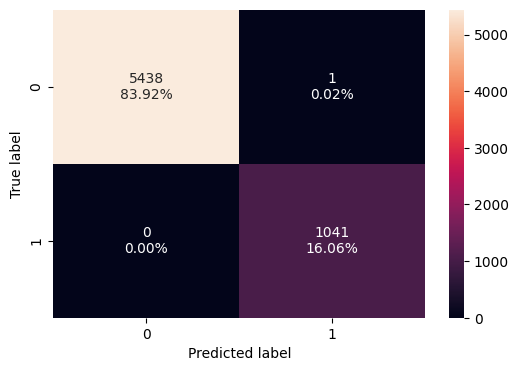

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.974707,0.900383,0.94,0.919765


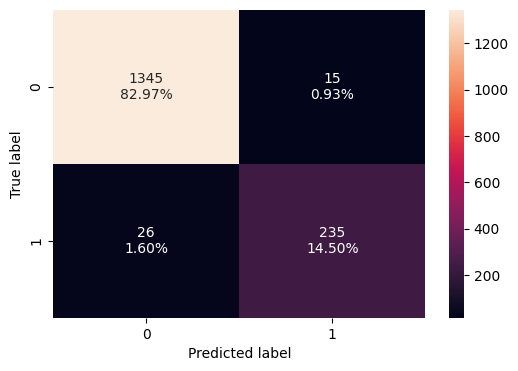

In [135]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(XGBCTunedRandomBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(XGBCTunedRandomBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(XGBCTunedRandomBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(XGBCTunedRandomBest, XValid, YValid)

tmp = ModelPerformanceMetrics(XGBCTunedRandomBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("XGBCTunedRandomBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))

**Observations:**
- Old XGBoost Default: Model Name: XGBCCDefaultModel Recall: 0.8773946360153256
- New XGBoost Random: Model Name: XGBCTunedRandomBest Recall: 0.900383
- There is a good improvement in the XGBoost model.

In [136]:
OSXGBCTunedModel = Pipeline([("OSXGBCScaler", StandardScaler()), ("OSXGBCSmote", SMOTE(sampling_strategy = "auto", k_neighbors = 5, random_state = 1)), ("OSXGBCTuned", XGBClassifier(random_state = 1))])

# Define hyperparameter grid for GridSearchCV
param_grid = {"OSXGBCTuned__n_estimators": [50, 100, 200], "OSXGBCTuned__learning_rate": [0.01, 0.1, 0.3], "OSXGBCTuned__max_depth": [3, 5, 7], "OSXGBCTuned__subsample": [0.6, 0.8, 1.0]}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

# Initialize GridSearchCV
OSXGBTunedGrid = GridSearchCV(OSXGBCTunedModel, param_grid = param_grid, cv=5, scoring = scorer, n_jobs = -1)

# Fit the model
OSXGBTunedGrid.fit(XTrain, YTrain)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('OSXGBCScaler', StandardScaler()),
                                       ('OSXGBCSmote', SMOTE(random_state=1)),
                                       ('OSXGBCTuned',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      callbacks=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      device=None,
                                                      early_stopping_rounds=None,
                                                      enable_categorical=False,
                                                      eval_metric=None,
                                                      feature_types...
                                                      min_child_weight=None,
                                                      missing=nan,
                                                      monotone_constraints=None,
                                                      multi_strategy=None,
                                                      n_estimators=None,
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      random_state=1, ...))]),
             n_jobs=-1,
             param_grid={'OSXGBCTuned__learning_rate': [0.01, 0.1, 0.3],
                         'OSXGBCTuned__max_depth': [3, 5, 7],
                         'OSXGBCTuned__n_estimators': [50, 100, 200],
                         'OSXGBCTuned__subsample': [0.6, 0.8, 1.0]},
             scoring=make_scorer(recall_score))

In [137]:
# Print the best parameters and score for GridSearchCV
print("Best parameters found by GridSearchCV:", OSXGBTunedGrid.best_params_)
print("Best cross-validation score (recall):", OSXGBTunedGrid.best_score_)

OSXGBTunedGridBest = OSXGBTunedGrid.best_estimator_
OSXGBTunedGridBest.fit(XTrain, YTrain)

Best parameters found by GridSearchCV: {'OSXGBCTuned__learning_rate': 0.01, 'OSXGBCTuned__max_depth': 3, 'OSXGBCTuned__n_estimators': 100, 'OSXGBCTuned__subsample': 0.6}
Best cross-validation score (recall): 0.911635075450865


Pipeline(steps=[('OSXGBCScaler', StandardScaler()),
                ('OSXGBCSmote', SMOTE(random_state=1)),
                ('OSXGBCTuned',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.01,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=3, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=100, n_jobs=None,
                               num_parallel_tree=None, random_state=1, ...))])

Training performance:


,Accuracy,Recall,Precision,F1
0,0.894753,0.916427,0.615881,0.73668


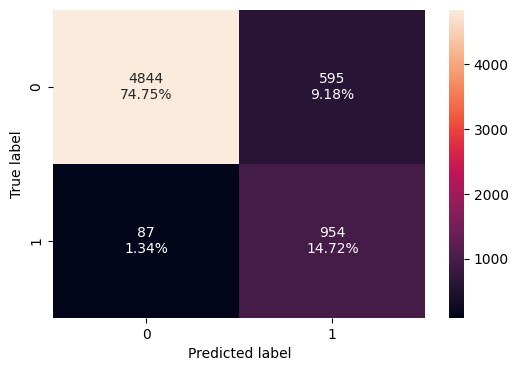

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.892042,0.927203,0.60804,0.734446


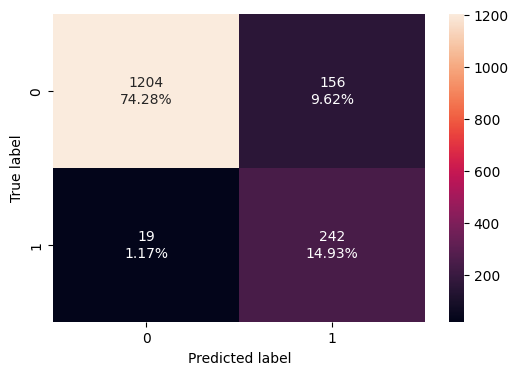

In [138]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(OSXGBTunedGridBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(OSXGBTunedGridBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(OSXGBTunedGridBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(OSXGBTunedGridBest, XValid, YValid)

tmp = ModelPerformanceMetrics(OSXGBTunedGridBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("OSXGBTunedGridBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))

**Observations:**
- Old XGBoost Over Sampled Default: Model Name: OSXGBCCDefaultModel Recall: 0.8850574712643678
- New XGBoost Over Sampled Grid: Model Name: OSXGBTunedGridBest Recall: 0.927203
- There is a significant increase in the recall performance.


In [139]:
# Tune XG Boost Oversampled
OSXGBCTunedModel = Pipeline([("OSXGBCScaler", StandardScaler()), ("OSXGBCSmote", SMOTE(sampling_strategy = "auto", k_neighbors = 5, random_state = 1)), ("OSXGBCTuned", XGBClassifier(random_state = 1))])

param_dist = {"OSXGBCTuned__n_estimators": randint(50, 200), "OSXGBCTuned__learning_rate": np.logspace(-3, 0, 10),  "OSXGBCTuned__max_depth": randint(3, 10), "OSXGBCTuned__subsample": [0.6, 0.8, 1.0], "OSXGBCTuned__colsample_bytree": [0.6, 0.8, 1.0]}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

# Initialize RandomizedSearchCV
OSXGBCTunedRandom = RandomizedSearchCV(OSXGBCTunedModel, param_distributions = param_dist, n_iter = 10, cv = 5, scoring = scorer, random_state = 1, n_jobs = -1)

# Fit the model
OSXGBCTunedRandom.fit(XTrain, YTrain)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('OSXGBCScaler', StandardScaler()),
                                             ('OSXGBCSmote',
                                              SMOTE(random_state=1)),
                                             ('OSXGBCTuned',
                                              XGBClassifier(base_score=None,
                                                            booster=None,
                                                            callbacks=None,
                                                            colsample_bylevel=None,
                                                            colsample_bynode=None,
                                                            colsample_bytree=None,
                                                            device=None,
                                                            early_stopping_rounds=None,
                                                            enable_categorical=False,
                                                            eval_metric=None,
                                                            feature...
                                        'OSXGBCTuned__learning_rate': array([0.001     , 0.00215443, 0.00464159, 0.01      , 0.02154435,
       0.04641589, 0.1       , 0.21544347, 0.46415888, 1.        ]),
                                        'OSXGBCTuned__max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c2f7fc9d0>,
                                        'OSXGBCTuned__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c2f54fc40>,
                                        'OSXGBCTuned__subsample': [0.6, 0.8,
                                                                   1.0]},
                   random_state=1, scoring=make_scorer(recall_score))

In [140]:
# Print the best parameters and score for RandomizedSearchCV
print("Best parameters found by RandomizedSearchCV:", OSXGBCTunedRandom.best_params_)
print("Best cross-validation score (recall):", OSXGBCTunedRandom.best_score_)

OSXGBCTunedRandomBest = OSXGBCTunedRandom.best_estimator_
OSXGBCTunedRandomBest.fit(XTrain, YTrain)

Best parameters found by RandomizedSearchCV: {'OSXGBCTuned__colsample_bytree': 0.6, 'OSXGBCTuned__learning_rate': 0.1, 'OSXGBCTuned__max_depth': 4, 'OSXGBCTuned__n_estimators': 70, 'OSXGBCTuned__subsample': 1.0}
Best cross-validation score (recall): 0.8895196908354803


Pipeline(steps=[('OSXGBCScaler', StandardScaler()),
                ('OSXGBCSmote', SMOTE(random_state=1)),
                ('OSXGBCTuned',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=0.6, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=4, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=70, n_jobs=None,
                               num_parallel_tree=None, random_state=1, ...))])

Training performance:


,Accuracy,Recall,Precision,F1
0,0.969753,0.930836,0.886551,0.908154


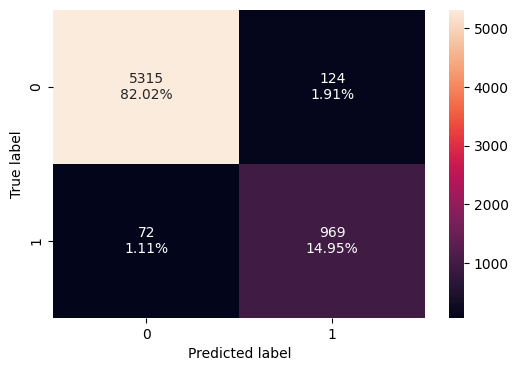

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.956817,0.900383,0.842294,0.87037


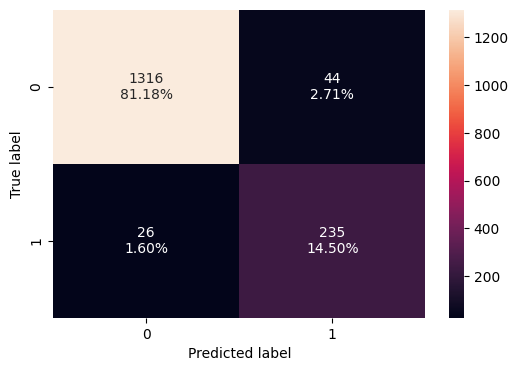

In [141]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(OSXGBCTunedRandomBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(OSXGBCTunedRandomBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(OSXGBCTunedRandomBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(OSXGBCTunedRandomBest, XValid, YValid)

tmp = ModelPerformanceMetrics(OSXGBCTunedRandomBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("OSXGBCTunedRandomBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))

**Observations:**
- Old XGBoost Over Sampled Default: Model Name: OSXGBCCDefaultModel Recall: 0.8850574712643678
- New XGBoost Over Sampled Random: Model Name: OSXGBCTunedRandomBest Recall: 0.900383
- There is a slight improvement in the performance of the model.

In [142]:
# Tune the XGBoost with Under sampling
USXGBCTunedModel = Pipeline([("USXGBCScaler", StandardScaler()), ("USXGBCSmote", RandomUnderSampler(sampling_strategy = "auto")), ("USXGBCTuned", XGBClassifier(random_state = 1))])

# Define hyperparameter grid for GridSearchCV
param_grid = {"USXGBCTuned__n_estimators": [50, 100, 200], "USXGBCTuned__learning_rate": [0.01, 0.1, 0.3], "USXGBCTuned__max_depth": [3, 5, 7], "USXGBCTuned__subsample": [0.6, 0.8, 1.0]}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

# Initialize GridSearchCV
USXGBTunedGrid = GridSearchCV(USXGBCTunedModel, param_grid = param_grid, cv=5, scoring = scorer, n_jobs = -1)

# Fit the model
USXGBTunedGrid.fit(XTrain, YTrain)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('USXGBCScaler', StandardScaler()),
                                       ('USXGBCSmote', RandomUnderSampler()),
                                       ('USXGBCTuned',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      callbacks=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      device=None,
                                                      early_stopping_rounds=None,
                                                      enable_categorical=False,
                                                      eval_metric=None,
                                                      feature_types=...
                                                      min_child_weight=None,
                                                      missing=nan,
                                                      monotone_constraints=None,
                                                      multi_strategy=None,
                                                      n_estimators=None,
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      random_state=1, ...))]),
             n_jobs=-1,
             param_grid={'USXGBCTuned__learning_rate': [0.01, 0.1, 0.3],
                         'USXGBCTuned__max_depth': [3, 5, 7],
                         'USXGBCTuned__n_estimators': [50, 100, 200],
                         'USXGBCTuned__subsample': [0.6, 0.8, 1.0]},
             scoring=make_scorer(recall_score))

In [143]:
# Print the best parameters and score for GridSearchCV
print("Best parameters found by GridSearchCV:", USXGBTunedGrid.best_params_)
print("Best cross-validation score (recall):", USXGBTunedGrid.best_score_)

# Evaluate on the test set
USXGBTunedGridBest = USXGBTunedGrid.best_estimator_
USXGBTunedGridBest.fit(XTrain, YTrain)

Best parameters found by GridSearchCV: {'USXGBCTuned__learning_rate': 0.1, 'USXGBCTuned__max_depth': 7, 'USXGBCTuned__n_estimators': 100, 'USXGBCTuned__subsample': 1.0}
Best cross-validation score (recall): 0.9596567905778433


Pipeline(steps=[('USXGBCScaler', StandardScaler()),
                ('USXGBCSmote', RandomUnderSampler()),
                ('USXGBCTuned',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=7, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=100, n_jobs=None,
                               num_parallel_tree=None, random_state=1, ...))])

Training performance:


,Accuracy,Recall,Precision,F1
0,0.957562,1.0,0.791033,0.883326


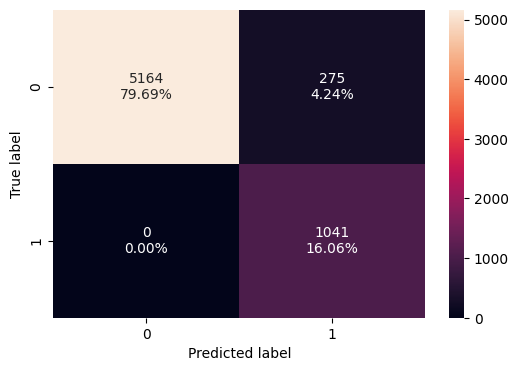

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.943862,0.961686,0.756024,0.846543


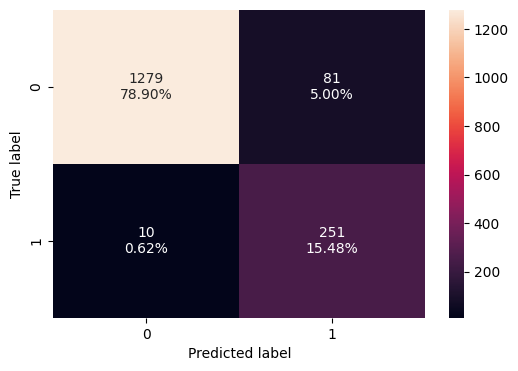

In [144]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(USXGBTunedGridBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(USXGBTunedGridBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(USXGBTunedGridBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(USXGBTunedGridBest, XValid, YValid)

tmp = ModelPerformanceMetrics(USXGBTunedGridBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("USXGBTunedGridBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))

**Observations:**
- Old XGBoost Under Sampled Default: Model Name: USXGBCCDefaultModel Recall: 0.9655172413793104
- New XGBoost Under Sampled Grid: Model Name: USXGBTunedGridBest Recall: 0.961686
- There is a slight improvement in the recall performance.

In [145]:
USXGBCTunedModel = Pipeline([("USXGBCScaler", StandardScaler()), ("USXGBCSmote", RandomUnderSampler(sampling_strategy = "auto")), ("USXGBCTuned", XGBClassifier(random_state = 1))])

param_dist = {"USXGBCTuned__n_estimators": randint(50, 200), "USXGBCTuned__learning_rate": np.logspace(-3, 0, 10),  "USXGBCTuned__max_depth": randint(3, 10), "USXGBCTuned__subsample": [0.6, 0.8, 1.0], "USXGBCTuned__colsample_bytree": [0.6, 0.8, 1.0]}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

# Initialize RandomizedSearchCV
USXGBCTunedRandom = RandomizedSearchCV(USXGBCTunedModel, param_distributions = param_dist, n_iter = 10, cv = 5, scoring = scorer, random_state = 1, n_jobs = -1)

# Fit the model
USXGBCTunedRandom.fit(XTrain, YTrain)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('USXGBCScaler', StandardScaler()),
                                             ('USXGBCSmote',
                                              RandomUnderSampler()),
                                             ('USXGBCTuned',
                                              XGBClassifier(base_score=None,
                                                            booster=None,
                                                            callbacks=None,
                                                            colsample_bylevel=None,
                                                            colsample_bynode=None,
                                                            colsample_bytree=None,
                                                            device=None,
                                                            early_stopping_rounds=None,
                                                            enable_categorical=False,
                                                            eval_metric=None,
                                                            feature_...
                                        'USXGBCTuned__learning_rate': array([0.001     , 0.00215443, 0.00464159, 0.01      , 0.02154435,
       0.04641589, 0.1       , 0.21544347, 0.46415888, 1.        ]),
                                        'USXGBCTuned__max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c2f7147f0>,
                                        'USXGBCTuned__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7e4c2f52cee0>,
                                        'USXGBCTuned__subsample': [0.6, 0.8,
                                                                   1.0]},
                   random_state=1, scoring=make_scorer(recall_score))

In [146]:
# Print the best parameters and score for RandomizedSearchCV
print("Best parameters found by RandomizedSearchCV:", USXGBCTunedRandom.best_params_)
print("Best cross-validation score (recall):", USXGBCTunedRandom.best_score_)

# Evaluate on the test set
USXGBCTunedRandomBest = USXGBCTunedRandom.best_estimator_
USXGBCTunedRandomBest.fit(XTrain, YTrain)

Best parameters found by RandomizedSearchCV: {'USXGBCTuned__colsample_bytree': 0.8, 'USXGBCTuned__learning_rate': 0.46415888336127775, 'USXGBCTuned__max_depth': 9, 'USXGBCTuned__n_estimators': 121, 'USXGBCTuned__subsample': 1.0}
Best cross-validation score (recall): 0.9519782848730218


Pipeline(steps=[('USXGBCScaler', StandardScaler()),
                ('USXGBCSmote', RandomUnderSampler()),
                ('USXGBCTuned',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=0.8, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None,
                               learning_rate=0.46415888336127775, max_bin=None,
                               max_cat_threshold=None, max_cat_to_onehot=None,
                               max_delta_step=None, max_depth=9,
                               max_leaves=None, min_child_weight=None,
                               missing=nan, monotone_constraints=None,
                               multi_strategy=None, n_estimators=121,
                               n_jobs=None, num_parallel_tree=None,
                               random_state=1, ...))])

Training performance:


,Accuracy,Recall,Precision,F1
0,0.958333,1.0,0.79405,0.885204


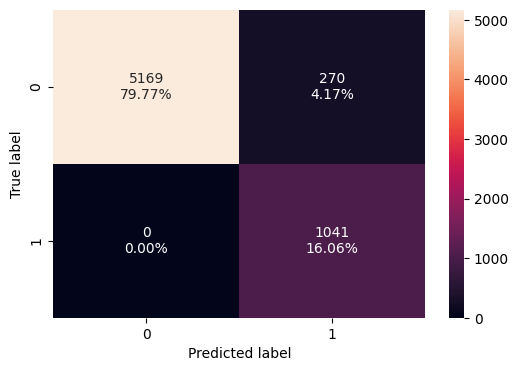

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.947563,0.965517,0.768293,0.855688


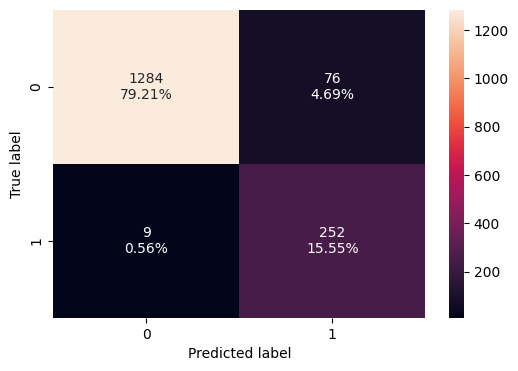

In [147]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(USXGBCTunedRandomBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(USXGBCTunedRandomBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(USXGBCTunedRandomBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(USXGBCTunedRandomBest, XValid, YValid)

tmp = ModelPerformanceMetrics(USXGBCTunedRandomBest, XValid, YValid)
AllModels.append(ModelPerformanceStats("USXGBCTunedRandomBest", float(tmp.Accuracy), float(tmp.Recall), float(tmp.Precision), float(tmp.F1)))

**Observations:**
- Old XGBoost Under Sampled Default : Model Name: USXGBCCDefaultModel Recall: 0.9655172413793104
- New XGBoost Under Sampled Random: Model Name: USXGBCTunedRandomBest Recall: 0.965517
- The performance has slightly decreased with the best tuning.

## <a name = 'link630'> Check and comment on model performance across different metrics <a>

Adaptive Boost Tuning:
- No Sampling:
  - Old Adaptive Boost Default: Model Name: ABCDefaultModel Recall: 0.842911877394636
  - New Adaptive Boost Grid: Model Name: ABCTunedGridBest Recall: 0.89272
  - New Adaptive Boost Random: Model Name: ABCTunedRandomBest Recall: 0.888889
- Over Sampling:
	- Old Adaptive Boost Over Sampled Default: Model Name: OSABCDefaultModel Recall: 0.9003831417624522
	- New Adaptive Boost Over Sampled Grid: Model Name: OSABCTunedGridBest Recall: 0.911877
	- New Adaptive Boost Over Sampled Random: Model Name: OSABCTunedRandomBest Recall: 0.908046
- Under Sampling:
	- Old Adaptive Boost Under Sampled Default: Model Name: USABCDefaultModel Recall: 0.9386973180076629
	- New Adaptive Boost Under Sampled Grid: Model Name: USABCTunedGridBest Recall: 0.97318
	- New Adaptive Boost Under Sampled Random: Model Name: USABCTunedRandomBest Recall: 0.977011

Gradient Boost Tuning:
- No Sampling:
	- Old Gradient Boost Default: Model Name: GBCDefaultModel Recall: 0.8697318007662835
	- New Gradient Boost Grid: Model Name: GBCTunedGridBest Recall: 0.877395
	- New Gradian Boost Random: Model Name: GBCTunedRandomBest Recall: 0.89272
- Over Sampling:
	- Old Gradient Boost Over Sampled Default: Model Name: OSGBCDefaultModel Recall: 0.896551724137931
	- New Gradient Boost Over Sampled Grid: Model Name: OSGBCTunedGridBest Recall: 0.904215
	- New Gradient Boost Over Sampled Random: Model Name: OSGBCTunedRandomBest Recall: 0.904215
- Under Sampling:
	- Old Gradient Boost Under Sampled Default: Model Name: USGBCDefaultModel Recall: 0.9578544061302682
	- New Gradient Boost Under Sampled Grid: Model Name: USGBCTunedGridBest Recall: 0.954023
	- New Gradient Boost Under Sampled Random: Model Name: USGBCTunedRandomBest Recall: 0.961686

XGBoost Tuning:
- No Sampling:
	- Old XGBoost Default: Model Name: XGBCCDefaultModel Recall: 0.8773946360153256
	- New XGBoost Grid: Model Name: XGBTunedGridBest Recall: 0.877395
	- New XGBoost Random: Model Name: XGBCTunedRandomBest Recall: 0.900383
- Over Sampling:
	- Old XGBoost Over Sampled Default: Model Name: OSXGBCCDefaultModel Recall: 0.8850574712643678
	- New XGBoost Over Sampled Grid: Model Name: OSXGBTunedGridBest Recall: 0.927203
	- New XGBoost Over Sampled Random: Model Name: OSXGBCTunedRandomBest Recall: 0.900383
- Under Sampling:
	- Old XGBoost Under Sampled Default: Model Name: USXGBCCDefaultModel Recall: 0.9616858237547893
	- New XGBoost Under Sampled Grid: Model Name: USXGBTunedGridBest Recall: 0.961686
	- New XGBoost Under Sampled Random: Model Name: USXGBCTunedRandomBest Recall: 0.965517

# <a name = 'link70'> Model Performance Comparison and Final Model Selection <a>

## <a name = 'link71'> Compare the performances of the tuned models <a>

In [148]:
# Extract attributes from the people array and load them into a DataFrame
data = {
    "Name": [ModelPerformanceStats.name for ModelPerformanceStats in AllModels],
    "Accuracy": [ModelPerformanceStats.accuracy for ModelPerformanceStats in AllModels],
    "Recall": [ModelPerformanceStats.recall for ModelPerformanceStats in AllModels],
    "Precision": [ModelPerformanceStats.precision for ModelPerformanceStats in AllModels],
    "F1": [ModelPerformanceStats.f1 for ModelPerformanceStats in AllModels],
}

# Create a DataFrame from the extracted data
AllModelDF = pd.DataFrame(data)

AllModelDFSorted = AllModelDF.sort_values(by="Recall", ascending = False)
AllModelDFSorted = AllModelDFSorted.reset_index(drop = True)
AllModelDFSorted

,Name,Accuracy,Recall,Precision,F1
0,USABCTunedGridBest,0.946329,0.973180,0.760479,0.853782
1,USXGBCTunedRandomBest,0.947563,0.965517,0.768293,0.855688
2,USXGBCCDefaultModel,0.950648,0.965517,0.780186,0.863014
3,USXGBTunedGridBest,0.943862,0.961686,0.756024,0.846543
4,USGBCTunedRandomBest,0.950031,0.961686,0.779503,0.861063
5,USGBCTunedGridBest,0.948797,0.954023,0.778125,0.857143
6,USGBCDefaultModel,0.938927,0.950192,0.742515,0.833613
7,USABCTunedRandomBest,0.944479,0.946360,0.764706,0.845890
8,USABCDefaultModel,0.925972,0.938697,0.702006,0.803279
9,USBCDefaultModel,0.925355,0.938697,0.700000,0.801964


**Observations:**
- The models attaied higher recall performance.
- As a by product the Type I error rate (False Positive Rate) has increased.
- Here having more FPR is not a problem because this will simply increase the potential customers who will be predicted as attriting customers and the bank officials will take appropriate measures to retain the customer.
- More the FPR, there will be more number of predicted customers whom should be reached out to retain. This will increase the burden of the bank employees.

## <a name = 'link72'> Choose the final model with a proper rationale <a>

In [149]:
display(Markdown("**Final Model Chosen:**{}".format(AllModelDFSorted.iloc[0,0])))

**Final Model Chosen:**USABCTunedGridBest

**Observations:**
- We will choose the model name that has the highest recall value.
- As mentioned earlier, this will increase the FPR and further increases the list of potential customer who can leave up credit card services.
- This will also increase the burden on the employees to reach out to more customers and offer more options to retain.
- However, This actiion will further strengthen the relationship of the bank with the customer, and the customer will be pleased to use the credit card services.
- Hence we can completely ignore the precision here and choose the best model that gives a least value for recall (sensitivity)

## <a name = 'link73'> Comment on the performance of the best model on the test set <a>

Training performance:


,Accuracy,Recall,Precision,F1
0,0.946451,0.98367,0.756278,0.855115


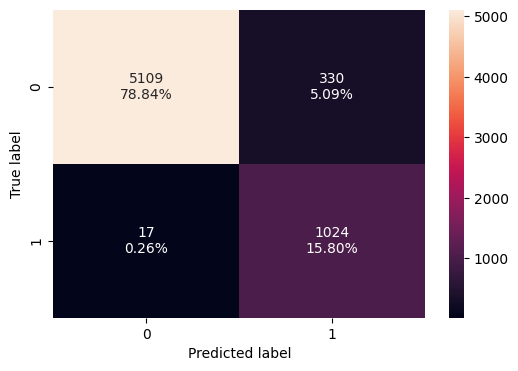

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.946329,0.97318,0.760479,0.853782


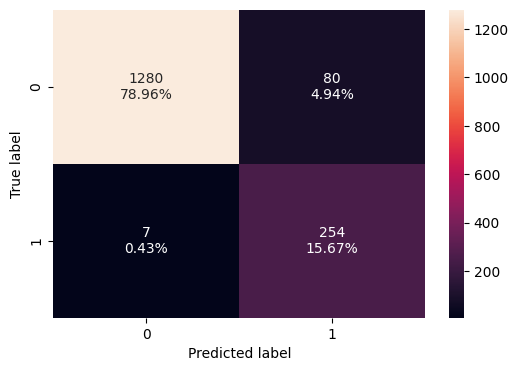

Test performance:


,Accuracy,Recall,Precision,F1
0,0.939783,0.975385,0.735499,0.838624


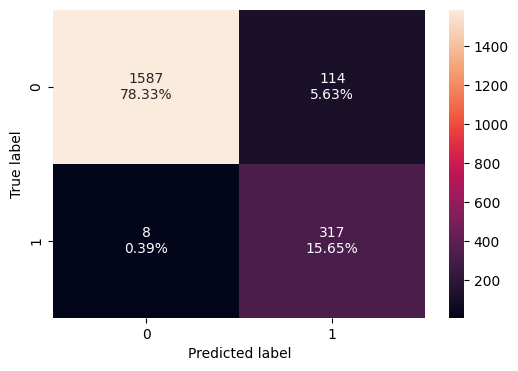

In [163]:
# Calculating different metrics on train set and validation set
print("Training performance:")
display(ModelPerformanceMetrics(USABCTunedGridBest, XTrain, YTrain))
# creating confusion matrix
ConfusionMatrix(USABCTunedGridBest, XTrain, YTrain)

# Calculating different metrics on validation set
print("Validation performance:")
display(ModelPerformanceMetrics(USABCTunedGridBest, XValid, YValid))
# creating confusion matrix
ConfusionMatrix(USABCTunedGridBest, XValid, YValid)

# Calculating different metrics on test set
print("Test performance:")
display(ModelPerformanceMetrics(USABCTunedGridBest, XTest, YTest))
# creating confusion matrix
ConfusionMatrix(USABCTunedGridBest, XTest, YTest)

| Data | Accuracy | Recall | Precision | F1 |
| --- | --- | --- | --- | --- |
| Train | 0.946451 | 0.98367 | 0.756278 | 0.855115 |
| Valid | 0.946329 | 0.97318 | 0.760479 | 0.853782 |
| Test | 0.939783 | 0.975385 |0.735499 | 0.838624 |

**Observations:**
- The model tries to reduce the True Negatives to almost nill on the train data.
- The model tries not to leave any correlated events that are potentially shown by the customers who have given up the services.

# <a name = 'link80'> Actionable Insights & Recommendations <a>

## <a name = 'link81'> Write down insights from the analysis conducted <a>

In [164]:
ABCTunedGridBest = ABCTunedGrid.best_estimator_._final_estimator

Total_Trans_Amt : 0.27
Total_Trans_Ct : 0.13
Total_Amt_Chng_Q4_Q1 : 0.12
Total_Revolving_Bal : 0.09
Total_Ct_Chng_Q4_Q1 : 0.07
Total_Relationship_Count : 0.04
Customer_Age : 0.04
Contacts_Count_12_mon : 0.03
Credit_Limit : 0.03
Avg_Open_To_Buy : 0.03
Months_Inactive_12_mon : 0.03
Avg_Utilization_Ratio : 0.03
Months_on_book : 0.02
Dependent_count : 0.02
Marital_Status_Married : 0.01
Education_Level_Uneducated : 0.01
Gender_F : 0.0
Marital_Status_Single : 0.0
Marital_Status_Divorced : 0.0
Income_Category_$60K - $80K : 0.0
Gender_M : 0.0
Education_Level_College : 0.0
Income_Category_$80K - $120K : 0.0
Education_Level_Post-Graduate : 0.0
Card_Category_Blue : 0.0
Education_Level_Doctorate : 0.0
Education_Level_High School : 0.0
Card_Category_Platinum : 0.0
Education_Level_Graduate : 0.0
Income_Category_$120K + : 0.0
Income_Category_$40K - $60K : 0.0
Income_Category_Less than $40K : 0.0
Card_Category_Gold : 0.0
Card_Category_Silver : 0.0


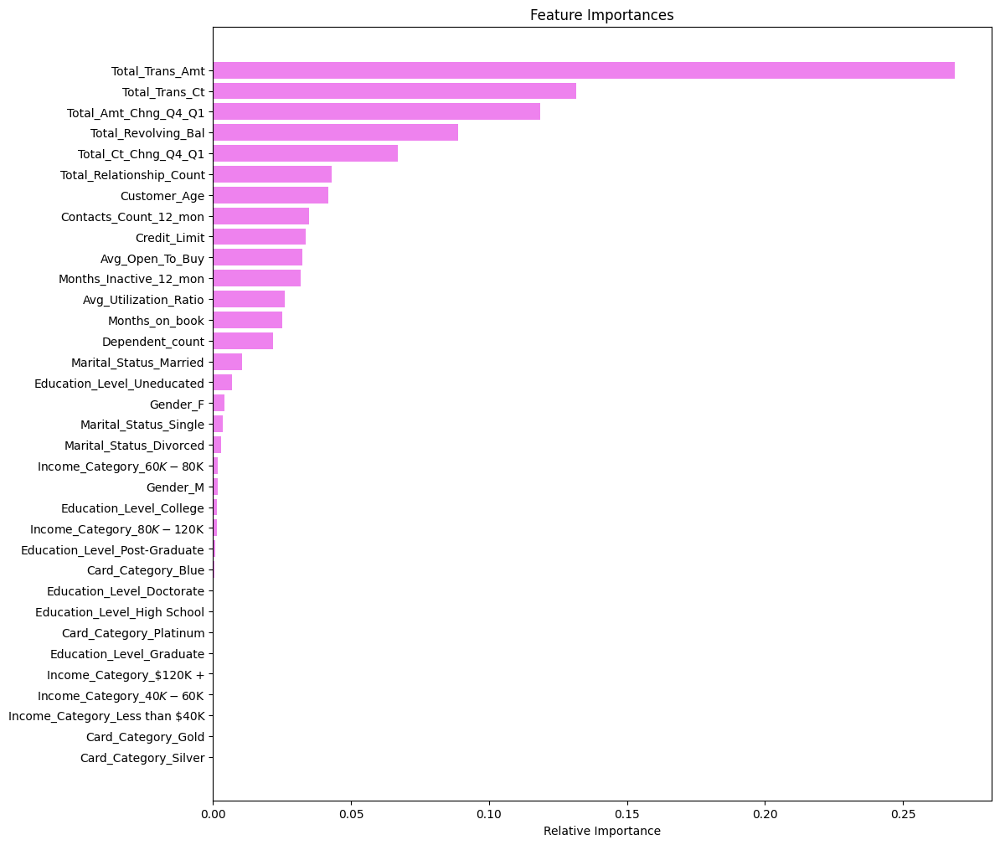

In [165]:
# get list of features from dmodel
col_names = list(X.columns)
feature_names = X.columns
importances = ABCTunedGrid.best_estimator_._final_estimator.feature_importances_
indices = np.argsort(importances)

for i in reversed(indices):
  print(col_names[i], ":", round(importances[i], 2))

# plot the features
plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

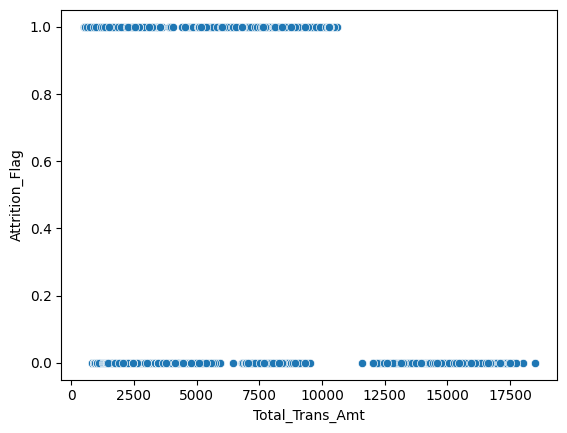

In [153]:
# create a scatterplot
sns.scatterplot(data = BankChurnABT, x = "Total_Trans_Amt", y = "Attrition_Flag")
plt.show()

**Observations:**
- Attrited customers have lesser Total transaction amount.
- Customers having larger total transaction amount are existing customers.
- Attrited customers have Total transaction amount less than or equal to 11K.

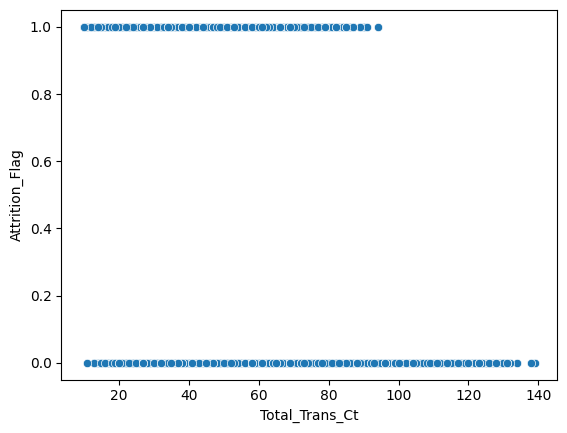

In [154]:
# create a scatterplot
sns.scatterplot(data = BankChurnABT, x = "Total_Trans_Ct", y = "Attrition_Flag")
plt.show()

**Observations:**
- Attrited customers have lesser Total transaction count.
- Customers having larger total transaction count are existing customers.

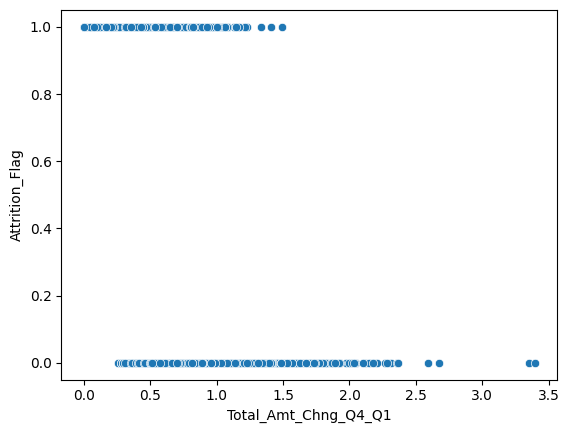

In [166]:
# create a scatterplot
sns.scatterplot(data = BankChurnABT, x = "Total_Amt_Chng_Q4_Q1", y = "Attrition_Flag")
plt.show()

**Observations:**
- The customer who have too low value for Total_Amt_Chng_Q4_Q1 have tendency to leave the services.
- The customers who have too high value for Total_Amt_Chng_Q4_Q1 are existing customers.
- This is the ratio of total of transaction amount in Q4 with Q1. THe exisitng customer have used the credit cards for more transactions in Q4.

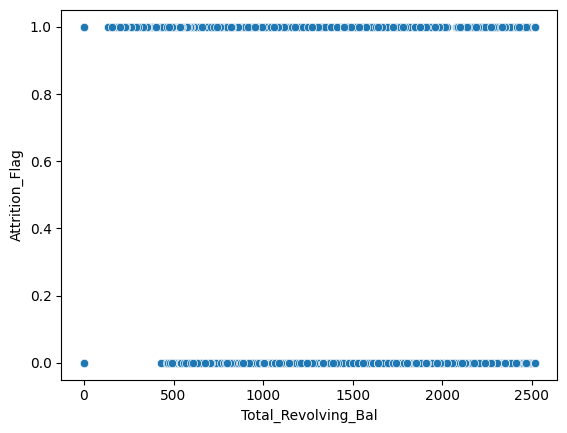

In [167]:
# create a scatterplot
sns.scatterplot(data = BankChurnABT, x = "Total_Revolving_Bal", y = "Attrition_Flag")
plt.show()

**Observations:**
- Attrited customers have low values of total revolving balance.

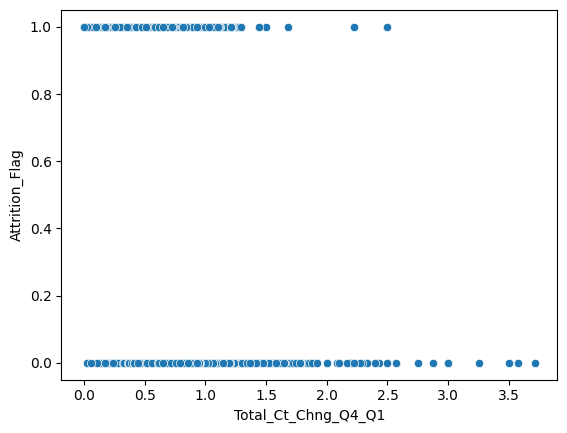

In [169]:
# create a scatterplot
sns.scatterplot(data = BankChurnABT, x = "Total_Ct_Chng_Q4_Q1", y = "Attrition_Flag")
plt.show()

**Observations:**
- Existing customers have higher values for Total_Ct_Chng_Q4_Q1

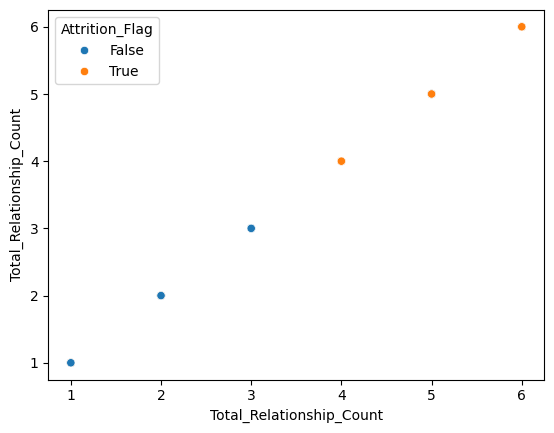

In [172]:
# create a scatterplot
sns.scatterplot(data = BankChurnABT, x = "Total_Relationship_Count", y = "Total_Relationship_Count", hue = "Attrition_Flag")
plt.show()

**Observations:**
- The attrited customers have higher number of Total_relationship_count

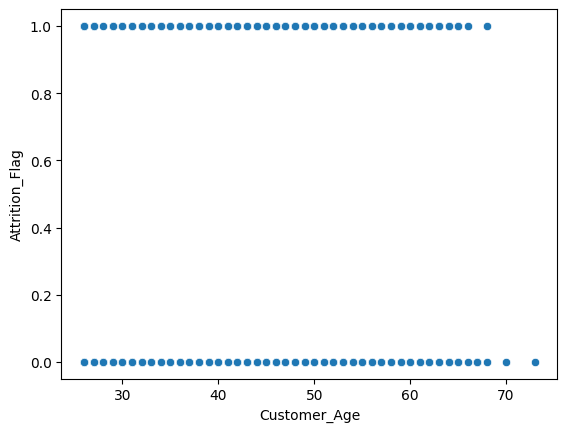

In [176]:
# create a scatterplot
sns.scatterplot(data = BankChurnABT, x = "Customer_Age", y = "Attrition_Flag")
plt.show()

**Observations:**
- No specific observations found

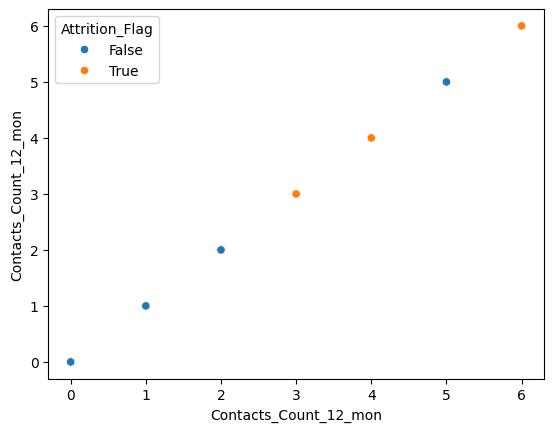

In [178]:
# create a scatterplot
sns.scatterplot(data = BankChurnABT, x = "Contacts_Count_12_mon", y = "Contacts_Count_12_mon", hue = "Attrition_Flag")
plt.show()

**Observations:**
- Higher the contacts_Count_12_mon implies the customer has larger chances of attretion.

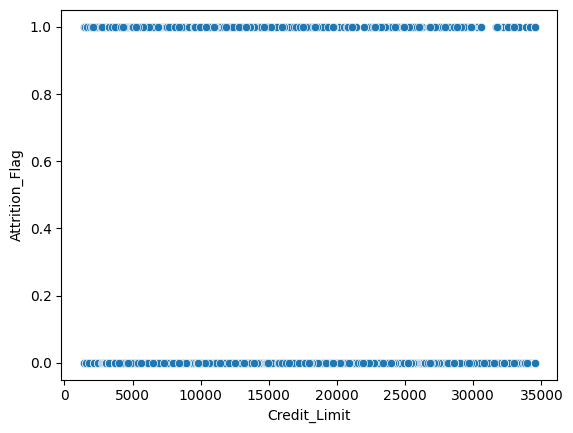

In [179]:
# create a scatterplot
sns.scatterplot(data = BankChurnABT, x = "Credit_Limit", y = "Attrition_Flag")
plt.show()

**Observations:**
- No specific observations

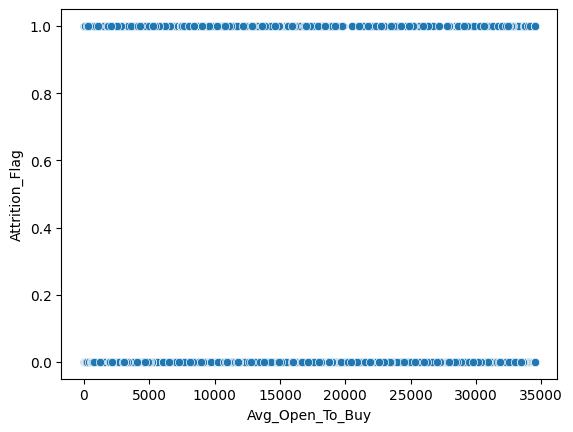

In [180]:
# create a scatterplot
sns.scatterplot(data = BankChurnABT, x = "Avg_Open_To_Buy", y = "Attrition_Flag")
plt.show()

**Observations:**
- No specific observations

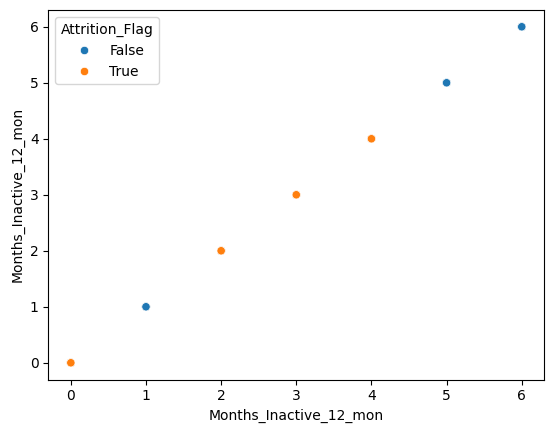

In [182]:
# create a scatterplot
sns.scatterplot(data = BankChurnABT, x = "Months_Inactive_12_mon", y = "Months_Inactive_12_mon", hue = "Attrition_Flag")
plt.show()

**Observations:**
- The customers who have a few months of inactivity have chances to leave the credit card services.

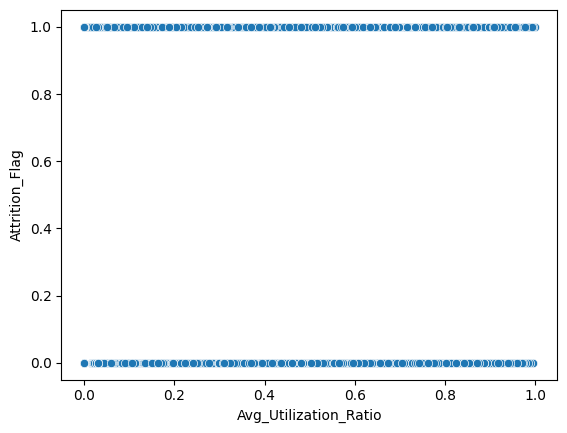

In [186]:
# create a scatterplot
sns.scatterplot(data = BankChurnABT, x = "Avg_Utilization_Ratio", y = "Attrition_Flag")
plt.show()

**Observations:**
- No specific observations

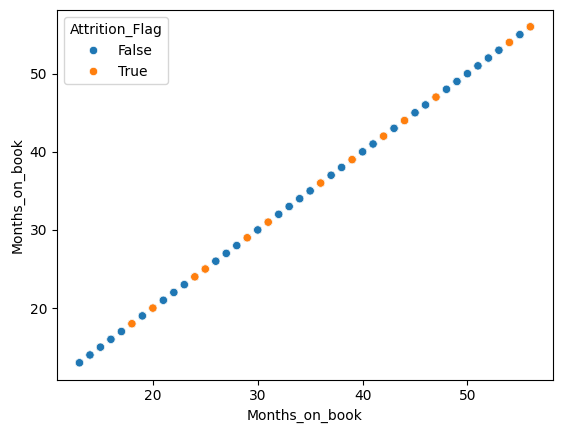

In [188]:
# create a scatterplot
sns.scatterplot(data = BankChurnABT, x = "Months_on_book", y = "Months_on_book", hue = "Attrition_Flag")
plt.show()

**Observations:**
- No specific observations

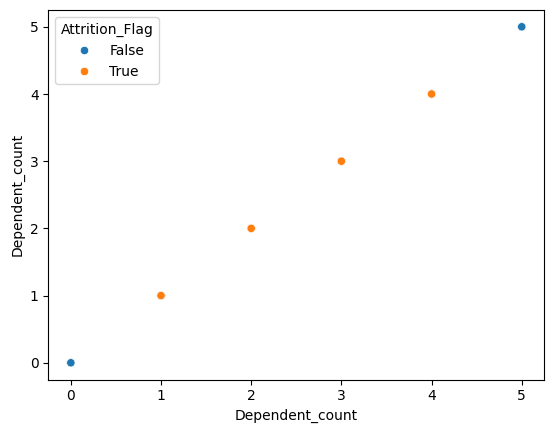

In [190]:
# create a scatterplot
sns.scatterplot(data = BankChurnABT, x = "Dependent_count", y = "Dependent_count", hue = "Attrition_Flag")
plt.show()

**Observations:**
- The attrited customer mostly have 1 - 4 dependents. However, this does not seem to be a correlation.

## <a name = 'link82'> Provide actionable business recommendations <a>

- Thera should target customers who attrit based on their historical customer profile from this dataset (as a starting point). These customers should be targeted more by the company and offer them added benefits.

| Columns | Influence |
| --- | --- |
| Total_Trans_Amt | 0.27 |
| Total_Trans_Ct | 0.13 |
| Total_Amt_Chng_Q4_Q1 | 0.12 |
| Total_Revolving_Bal | 0.09 |
| Total_Ct_Chng_Q4_Q1 | 0.07 |
| Total_Relationship_Count | 0.04 |
| Customer_Age | 0.04 |
| Contacts_Count_12_mon | 0.03 |
| Credit_Limit | 0.03 |
| Avg_Open_To_Buy | 0.03 |
| Months_Inactive_12_mon | 0.03 |
| Avg_Utilization_Ratio | 0.03 |
| Months_on_book | 0.02 |
| Dependent_count | 0.02 |

**Actions:**
1. The Bank should set up new processes to monitor the total transaction amount spent by the existing customer in the past 12 months. If there is a decline below 11K then there are chances that the customer might be thinking of giving up the service. The bank should reach out to the customer and offer cashback and other benefits so that the customer is encouraged to use the credit cards as much as possible.
2. The existing customers have more than 100+ total transactions by credit card in the past 12 months. The new process should monitor the reduction in the number of transactions by the customer and reach out to the customer to provide more offers to encourage the customers to use the credit card more and more.
3. We can increase the ratio of the total transaction amount in the 4th quarter to the total transaction amount in the 1st quarter by increasing the transaction amount in the 4th quarter. Provide more discounts and other benefits to increase the usage of the cards.
4. The balance that carries over from one month to the next is the revolving balance and a few existing customers do not keep any balance at the end of the month. If a customer starts showing high Total_revolving_Bal then reach out to the customer and compensate with lesser interest on the credit balance.
5. We can increase the ratio of the total transactions in the 4th quarter to the total transactions in the 1st quarter by increasing the transaction amount in the 4th quarter. Provide more discounts and other benefits to increase the usage of the cards.

**Recommendations:**

- We observed in our analysis that the total tranaction count is the #1 feature of importance, followed by the month-to-month balance, then the total amount of products a customer holds with the bank in predicting whether a customer will attrit or not. The company should carefully consider these features and monitor or flag them them for it's customers around the thresholds:
  - total transactions below 100.
  - monthly balance carry-over below 500.
  - total product holdings between 2 - 3.
- Experiment with new card types that target lower-income customers that need less credit and who fall into the related high-liklihood to attrite categories. This way Thera Bank can get a better feel for it's customers and provide a more diverse credit card offering.